In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import time
import seaborn as sns
import os
import json
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
import time
import re
from collections import Counter
from sklearn.model_selection import  KFold, train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.dates as mdates
# import mplfinance as mpf



In [2]:
color_list = ['blue','orange','red','green','hotpink','slategray','darkorange','goldenrod','orangered',
 'dodgerblue','brown','burlywood','cadetblue','forestgreen','chocolate','midnightblue','cornflowerblue',
 'indigo','crimson']

In [ ]:
pricepath = 'prices/'
for full_namee in os.listdir(pricepath):
    pname = full_namee.split(".")[0]
    ptype = pname.split('_')[0]
    pdf = pd.read_csv(pricepath+full_namee)
    pricedf = pd.read_csv(pricepath+full_namee)
    path = 'grouped_by/'
    for full_name in os.listdir(path):
        name = full_name.split(".")[0]
        type = name.split('_')[0]
        df = pd.read_csv(path+full_name)
        if 'created_at' in df.columns:
            df.rename(columns={"created_at": "Date"}, inplace=True)
        if 'commit.committer.date' in df.columns:
            df.rename(columns={"commit.committer.date": "Date"}, inplace=True)
        if ptype == type:

            if(name.split('_')[1] == 'commits'):
                pdf = pd.read_csv(pricepath+full_namee)
                pdf = pdf.merge(df, on='Date')
                pdf.to_csv('commitPrice/'+ptype+'.csv', index=False)
            if(name.split('_')[1] == 'repos'):
                pdf = pd.read_csv(pricepath+full_namee)
                pdf = pdf.merge(df, on='Date')
                pdf.to_csv('repoprice/'+ptype+'.csv', index=False)
            if(name.split('_')[1] == 'issues'):
                pdf = pd.read_csv(pricepath+full_namee)
                pdf = pdf.merge(df, on='Date')
                pdf.to_csv('issueprice/'+ptype+'.csv', index=False)
            pricedf = pricedf.merge(df, on='Date')
            pricedf.to_csv('allmerged/'+ptype+'.csv', index=False)



In [11]:
df = pd.read_csv('remove_equal_columns_repo/bittensor.csv')
df.head()

,id,size,stargazers_count,forks_count,open_issues_count,has_issues,archived,has_wiki,has_discussions,is_template
0,1,164,7,54,16,1.0,0.0,1.0,0.0,0.0
1,1,1871,5,9,0,1.0,0.0,1.0,0.0,0.0
2,2,152,1,2,1,1.0,0.0,1.0,0.0,0.0
3,2,124,1,3,0,1.0,0.0,0.5,0.0,0.0
4,1,336,44,58,19,1.0,0.0,1.0,0.0,1.0


In [15]:
df = pd.read_csv('remove_equal_columns_issue/bittensor.csv')
df.head()

,id,comments,reactions.total_count,reactions.+1,reactions.-1,reactions.confused,reactions.heart,reactions.rocket,reactions.laugh,reactions.hooray,user.type
0,4,0,0,0,0,0,0,0,0,0,1.0
1,5,3,0,0,0,0,0,0,0,0,1.0
2,11,0,0,0,0,0,0,0,0,0,1.0
3,25,3,0,0,0,0,0,0,0,0,1.0
4,6,0,0,0,0,0,0,0,0,0,1.0


In [14]:
df = pd.read_csv('remove_equal_columns_commit/bittensor.csv')
df.head()

,node_id,commit.comment_count,author.id,committer.id,author.type,committer.type
0,2,0,2,1,1.000000,1.000000
1,30,0,12,3,0.800000,0.800000
2,35,0,19,4,0.971429,0.971429
3,29,0,8,5,0.931034,0.931034
4,39,0,10,3,0.538462,0.589744


In [ ]:
os.makedirs('remove_equal_columns_issue/')

path = 'commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path + full_name)
    columns_to_drop = []   
    for i, c1 in enumerate(df.columns):
        for c2 in df.columns[i+1:]:   
            if df[c1].equals(df[c2]) and c1 != c2:
                print(f'{name}: {c1} is equal to {c2}')
                columns_to_drop.append(c2)   
    df.drop(columns=columns_to_drop, inplace=True)  
    df.to_csv(f'remove_equal_columns_issue/{name}.csv',index=False)


bittensor: Close is equal to Adj Close
fetchai: Close is equal to Adj Close
numerai: Close is equal to Adj Close
oceanprotocol: Close is equal to Adj Close
oraichain: Close is equal to Adj Close
singularitynet: Close is equal to Adj Close


In [16]:
daily_commits = {}
daily_repo = {}
daily_issue = {}
path = 'remove_equal_columns_repo/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    daily_repo.update({name:df})

path = 'remove_equal_columns_issue/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    daily_issue.update({name:df})

path = 'remove_equal_columns_commit/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    daily_commits.update({name:df})

bittensor :   start_year :  2018-01-19    end_year :  2024-05-08
fetchai :   start_year :  2018-01-19    end_year :  2024-05-08
numerai :   start_year :  2018-01-19    end_year :  2024-05-08
singularitynet :   start_year :  2018-01-19    end_year :  2024-05-08
oceanprotocol :   start_year :  2018-01-19    end_year :  2024-05-08
oraichain :   start_year :  2018-01-19    end_year :  2024-05-08
2018-03-26
2024-05-08


<Figure size 1000x600 with 0 Axes>

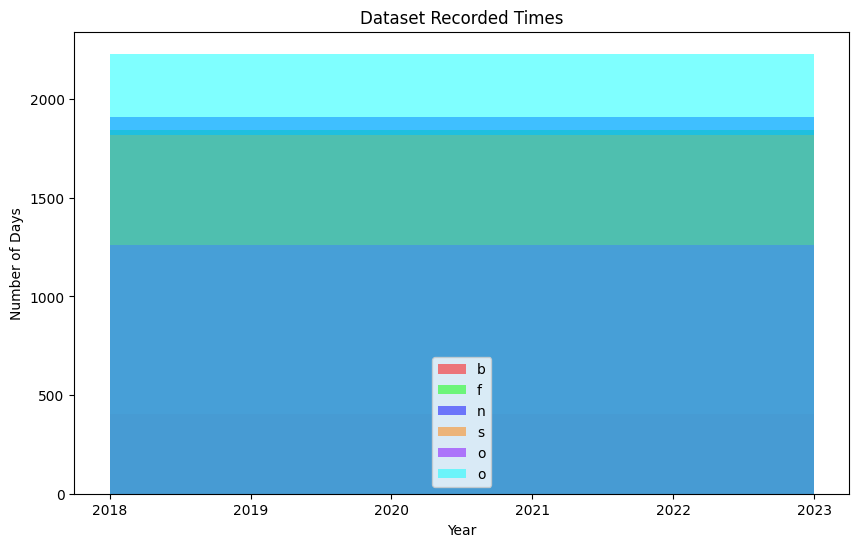

In [47]:
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
    print(df_name ,':   start_year : ',  pd.to_datetime(df['Date']).dt.date.min(), '   end_year : ', pd.to_datetime(df['Date']).dt.date.max() )
start_year = min([df['Date'].dt.date.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.date.max() for df in daily_repo.values()])
print (start_year)
print (end_year)

start_years = [df['Date'].dt.date.min() for df in daily_repo.values()]
end_years = [df['Date'].dt.date.max() for df in daily_repo.values()]

years = pd.date_range(start=start_year, end=end_year, freq='Y').year

# Create a list of the number of days for each year
days = [(end_years[i] - start_years[i]).days + 1 for i in range(len(start_years))]
color_listt = [(1, 0, 0, 0.5), (0, 1, 0, 0.5), (0, 0, 1, 0.5), (1, 0.5, 0, 0.5), (0.5, 0, 1, 0.5), (0, 1, 1, 0.5)]

# Plot the area chart
plt.figure(figsize=(10, 6))
plt.figure(figsize=(10, 6))
for i, df_name in enumerate(['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']):
    plt.stackplot(years, days[i], labels=df_name, colors=[color_listt[i]])
plt.xlabel('Year')
plt.ylabel('Number of Days')
plt.title('Dataset Recorded Times')
plt.legend()
plt.show()

In [24]:
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
    print(df_name ,':   start_year : ',  pd.to_datetime(df['Date']).dt.date.min(), '   end_year : ', pd.to_datetime(df['Date']).dt.date.max() )
start_year = min([df['Date'].dt.date.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.date.max() for df in daily_repo.values()])
print (start_year)
print (end_year)

start_years = [df['Date'].dt.date.min() for df in daily_repo.values()]
end_years = [df['Date'].dt.date.max() for df in daily_repo.values()]

start_year = max(start_years)
end_year = min(end_years)
print(f"Overlap years: {start_year} to {end_year}")

bittensor :   start_year :  2018-02-12    end_year :  2024-05-08
fetchai :   start_year :  2018-02-12    end_year :  2024-05-08
numerai :   start_year :  2018-02-12    end_year :  2024-05-08
singularitynet :   start_year :  2018-02-12    end_year :  2024-05-08
oceanprotocol :   start_year :  2018-02-12    end_year :  2024-05-08
oraichain :   start_year :  2018-02-12    end_year :  2024-05-08
2018-03-26
2024-05-08
Overlap years: 2023-03-23 to 2023-12-20


In [25]:
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_commits[df_name]['Date'] = pd.to_datetime(daily_commits[df_name]['Date'])
    print(df_name ,':   start_year : ',  pd.to_datetime(df['Date']).dt.date.min(), '   end_year : ', pd.to_datetime(df['Date']).dt.date.max() )

start_year = min([df['Date'].dt.date.min() for df in daily_commits.values()])
end_year = max([df['Date'].dt.date.max() for df in daily_commits.values()])
print (start_year)
print (end_year)
start_years = [df['Date'].dt.date.min() for df in daily_commits.values()]
end_years = [df['Date'].dt.date.max() for df in daily_commits.values()]

start_year = max(start_years)
end_year = min(end_years)
print(f"Overlap years: {start_year} to {end_year}")


bittensor :   start_year :  2018-02-12    end_year :  2024-05-08
fetchai :   start_year :  2018-02-12    end_year :  2024-05-08
numerai :   start_year :  2018-02-12    end_year :  2024-05-08
singularitynet :   start_year :  2018-02-12    end_year :  2024-05-08
oceanprotocol :   start_year :  2018-02-12    end_year :  2024-05-08
oraichain :   start_year :  2018-02-12    end_year :  2024-05-08
2017-11-09
2024-05-08
Overlap years: 2023-03-05 to 2024-04-30


In [31]:
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_issue[df_name]['Date'] = pd.to_datetime(daily_issue[df_name]['Date'])
    print(df_name ,':   start_year : ',  pd.to_datetime(df['Date']).dt.date.min(), '   end_year : ', pd.to_datetime(df['Date']).dt.date.max() )

    daily_issue[df_name]['Date'] = pd.to_datetime(daily_issue[df_name]['Date'])
start_year = min([df['Date'].dt.date.min() for df in daily_issue.values()])
end_year = max([df['Date'].dt.date.max() for df in daily_issue.values()])
print (start_year)
print (end_year)
start_years = [df['Date'].dt.date.min() for df in daily_issue.values()]
end_years = [df['Date'].dt.date.max() for df in daily_issue.values()]

start_year = max(start_years)
end_year = min(end_years)
print(f"Overlap years: {start_year} to {end_year}")

bittensor :   start_year :  2020-10-28    end_year :  2024-05-08
fetchai :   start_year :  2020-10-28    end_year :  2024-05-08
numerai :   start_year :  2020-10-28    end_year :  2024-05-08
singularitynet :   start_year :  2020-10-28    end_year :  2024-05-08
oceanprotocol :   start_year :  2020-10-28    end_year :  2024-05-08
oraichain :   start_year :  2020-10-28    end_year :  2024-05-08
2017-11-11
2024-05-08
Overlap years: 2023-03-06 to 2024-05-06


### EDA

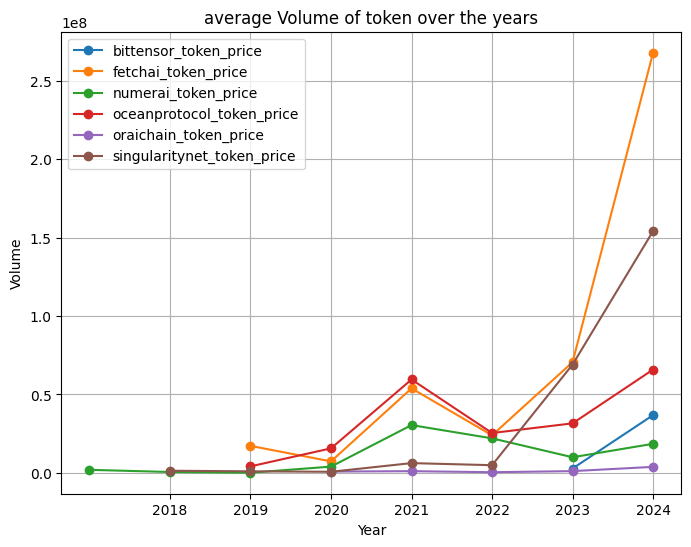

In [46]:

path = 'prices/'
plt.figure(figsize=(8, 6))   

for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path + full_name)
    
    df['Date'] = pd.to_datetime(df['Date'])
    
    df['Year'] = df['Date'].dt.year
    
    yearly_data = df.groupby('Year')['Volume'].mean().reset_index()
    
    plt.plot(yearly_data['Year'], yearly_data['Volume'], marker='o', label=name)

plt.title('average Volume of token over the years')  
plt.xlabel('Year')  
plt.ylabel('Volume')  
plt.grid(True)  
plt.legend()  
plt.xticks(yearly_data['Year'].unique())  
plt.show()

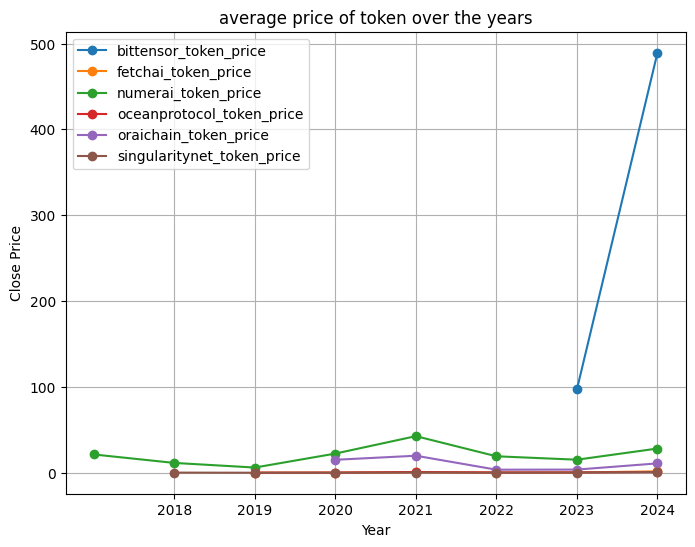

In [45]:

path = 'prices/'
plt.figure(figsize=(8, 6))   

for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path + full_name)
    
    df['Date'] = pd.to_datetime(df['Date'])
    
    df['Year'] = df['Date'].dt.year
    
    yearly_data = df.groupby('Year')['Close'].mean().reset_index()
    
    plt.plot(yearly_data['Year'], yearly_data['Close'], marker='o', label=name)

plt.title('average price of token over the years')  
plt.xlabel('Year')  
plt.ylabel('Close Price')  
plt.grid(True)  
plt.legend()  
plt.xticks(yearly_data['Year'].unique())  
plt.show()

### Analyze Developer Activity
10 points <br/>
Analyze trends in developer activity over time.
Look for patterns, spikes, or dips that might correlate with events or milestones in the project's development.

### Rank Projects by Activity
10 points<br/>
Collect data on the number of commits and repositories created for each crypto project.
Rank the projects based on these metrics and graph the evolution of this ranking over time.

#### repo

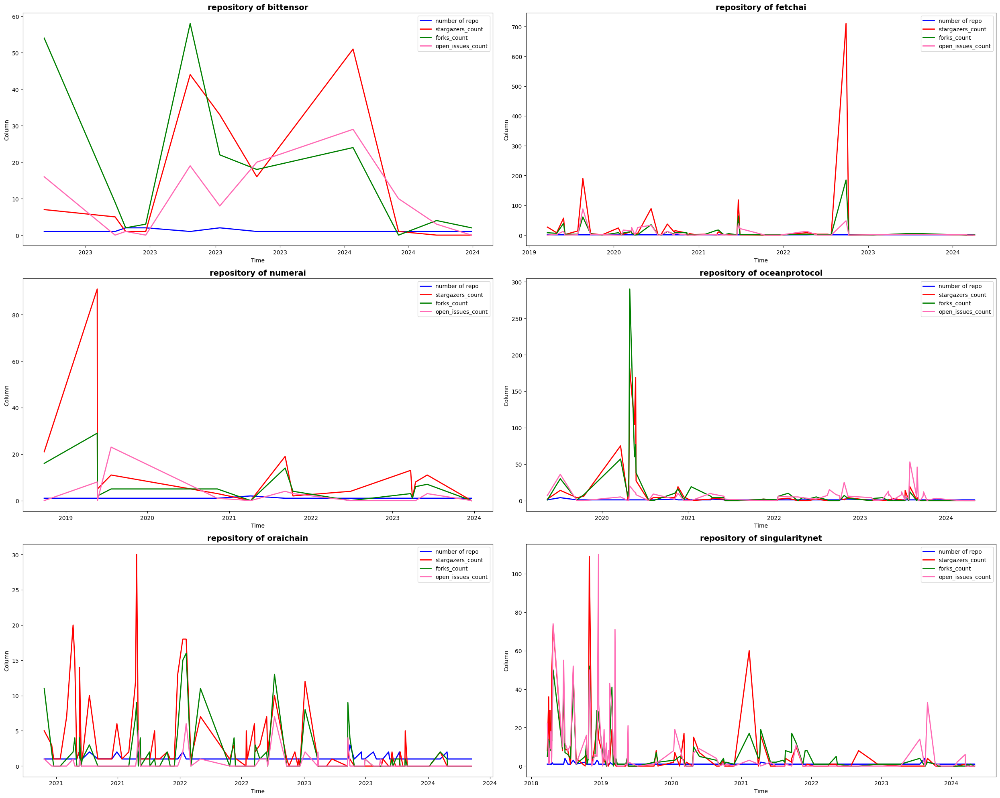

In [ ]:
pair_list = list(daily_repo.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
# for (i, ax) in  enumerate(axes.flatten()):
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = daily_repo[c]
    ax.plot(df['Date'],df['id'],label='number of repo', c=color_list[0], linewidth=2.0 )
    # ax.plot(df['Date'],df['size'],label='size', color=color_list[1])
    ax.plot(df['Date'],df['stargazers_count'],label='stargazers_count', c =color_list[2], linewidth=2.0 )
    ax.plot(df['Date'],df['forks_count'],label='forks_count', c=color_list[3], linewidth=2.0 )
    ax.plot(df['Date'],df['open_issues_count'],label='open_issues_count', c=color_list[4], linewidth=2.0 )

    ax.set_title(f'repository of {c}', fontsize=14, fontweight='bold')
    ax.set_ylabel(r'Column')
    ax.set_xlabel(r'Time')

    # Set the x-axis to show only the year
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show the year only
    ax.legend()

    # Adjust layout to prevent overlap
plt.tight_layout()


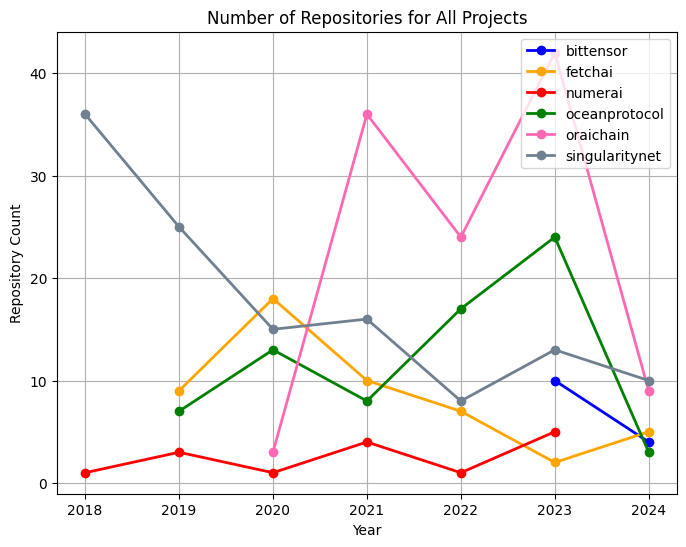

In [85]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_repo.items():
    # Convert index to datetime if it's not already
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    # Extract year from date to ensure plotting by year 
    value['Year'] = value.index.year

    # Group by year if multiple entries per year exist
    yearly_data = value.groupby('Year')['id'].sum().reset_index()

    # Plot with markers and line width
    plt.plot(yearly_data['Year'], yearly_data['id'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of Repositories for All Projects')  # Set title
plt.xlabel('Year')  # X-axis label for year
plt.ylabel('Repository Count')  # Y-axis label for repository count
plt.grid(True)  # Optional: Add grid for better readability
plt.xticks(yearly_data['Year'].unique())  # Adjust x-axis ticks to show unique years

plt.show()

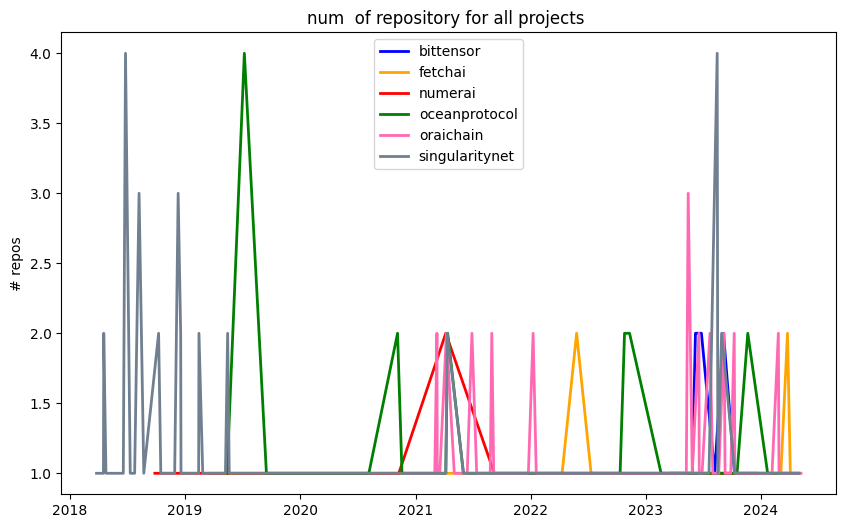

In [88]:
j = 0
fig, ax = plt.subplots(figsize=(10,6))

for key, value in daily_repo.items():
    value = value.set_index('Date')
    value.index = pd.to_datetime(value.index)
    plt.plot(value.index, value['id'], label=key, color=color_list[j], linewidth=2.0)
    j += 1
    value = value.reset_index(drop=False)
plt.legend()
# Set title and labels
plt.title('num  of repository for all projects ')
plt.ylabel('# repos')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Show the plot
plt.show()


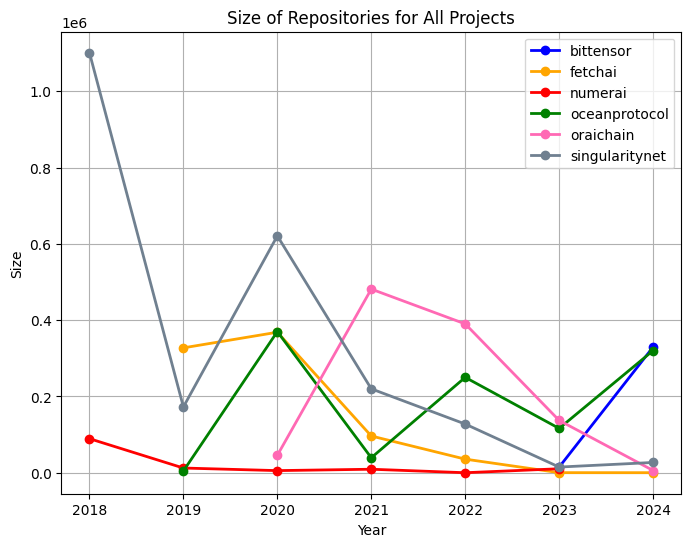

In [86]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_repo.items():
    # Convert index to datetime if it's not already
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    # Extract year from date to ensure plotting by year 
    value['Year'] = value.index.year

    # Group by year if multiple entries per year exist
    yearly_data = value.groupby('Year')['size'].sum().reset_index()

    # Plot with markers and line width
    plt.plot(yearly_data['Year'], yearly_data['size'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Size of Repositories for All Projects')  # Set title
plt.xlabel('Year')  # X-axis label for year
plt.ylabel('Size')  # Y-axis label for repository count
plt.grid(True)  # Optional: Add grid for better readability
plt.xticks(yearly_data['Year'].unique())  # Adjust x-axis ticks to show unique years

plt.show()

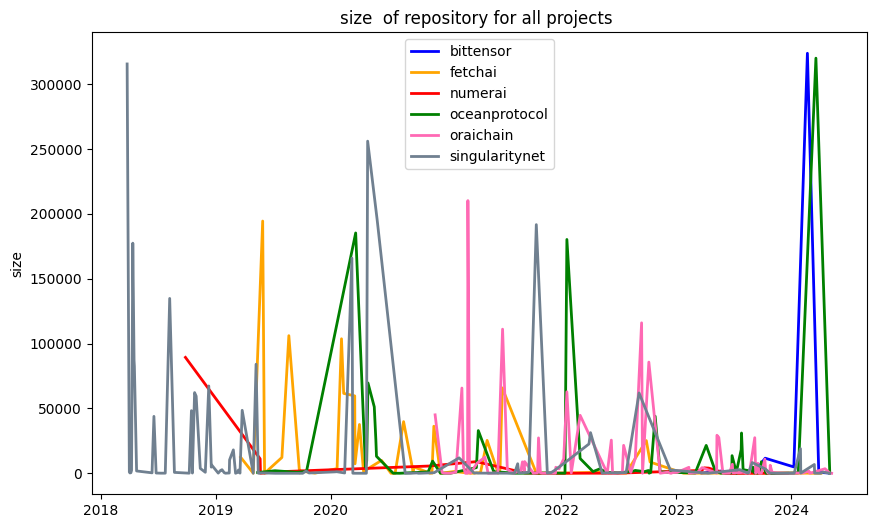

In [87]:
j = 0
fig, ax = plt.subplots(figsize=(10,6))

for key, value in daily_repo.items():
    value = value.set_index('Date')
    value.index = pd.to_datetime(value.index)
    plt.plot(value.index, value['size'], label=key, color=color_list[j], linewidth=2.0)
    j += 1
    value = value.reset_index(drop=False)
plt.legend()
# Set title and labels
plt.title('size  of repository for all projects ')
plt.ylabel('size')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Show the plot
plt.show()


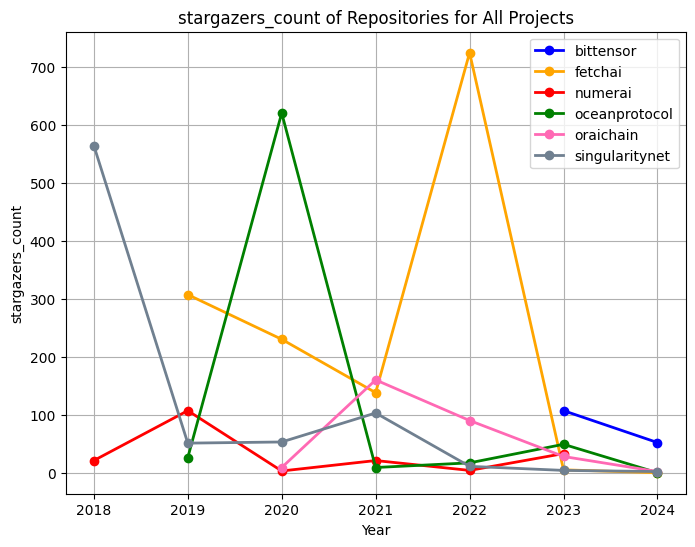

In [89]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_repo.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['stargazers_count'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['stargazers_count'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('stargazers_count of Repositories for All Projects')   
plt.xlabel('Year')   
plt.ylabel('stargazers_count')  
plt.grid(True)   
plt.xticks(yearly_data['Year'].unique())  

plt.show()

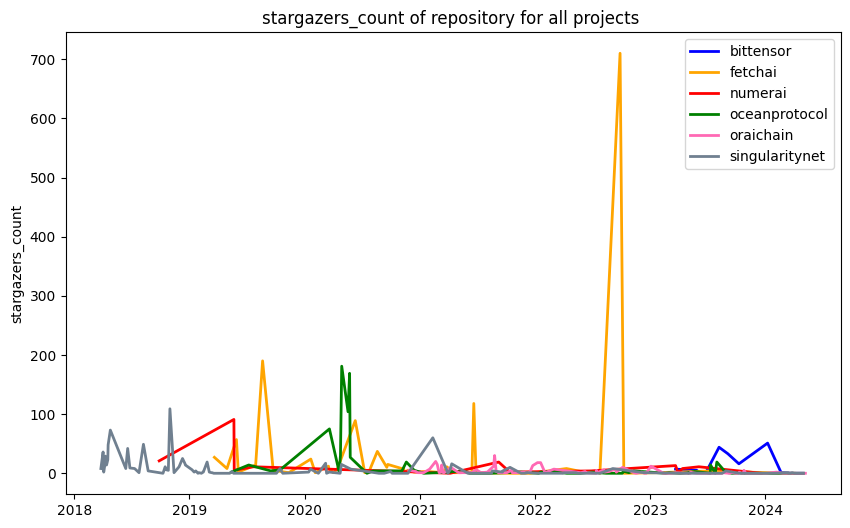

In [ ]:
j = 0
fig, ax = plt.subplots(figsize=(10,6))

for key, value in daily_repo.items():
    value = value.set_index('Date')
    value.index = pd.to_datetime(value.index)
    plt.plot(value.index, value['stargazers_count'], label=key, color=color_list[j], linewidth=2.0)
    j += 1
    value = value.reset_index(drop=False)
plt.legend()
plt.title('stargazers_count of repository for all projects ')
plt.ylabel('stargazers_count')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.show()


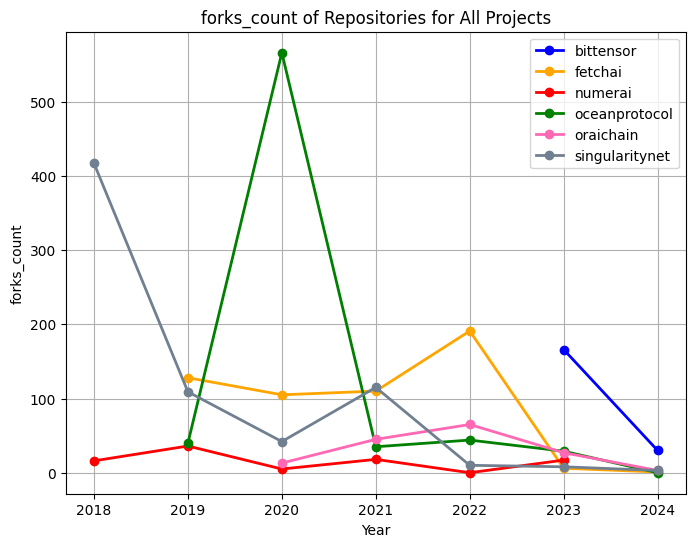

In [90]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_repo.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['forks_count'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['forks_count'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('forks_count of Repositories for All Projects')  
plt.xlabel('Year')  
plt.ylabel('forks_count') 
plt.grid(True) 
plt.xticks(yearly_data['Year'].unique())  

plt.show()

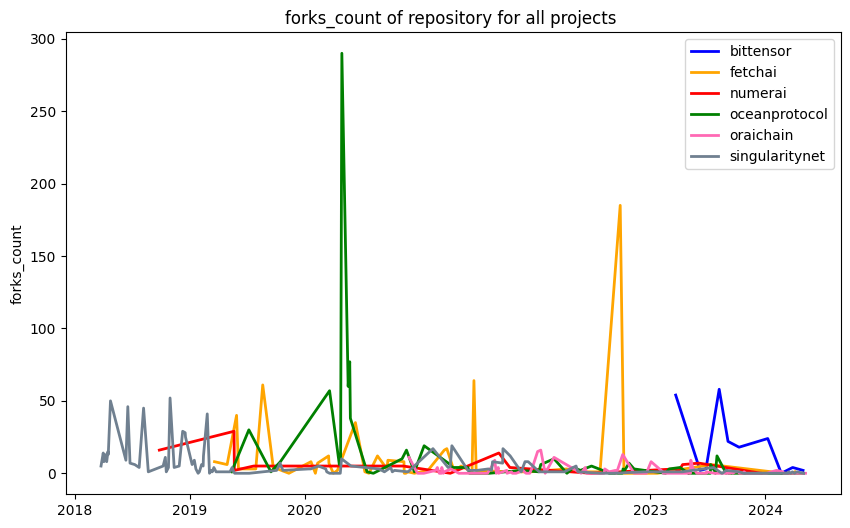

In [ ]:

# Assuming 'daily_repo' is a dictionary where each value is a pandas DataFrame
j = 0
fig, ax = plt.subplots(figsize=(10,6))

for key, value in daily_repo.items():
    value = value.set_index('Date')
    value.index = pd.to_datetime(value.index)
    plt.plot(value.index, value['forks_count'], label=key, color=color_list[j], linewidth=2.0)
    j += 1
    value = value.reset_index(drop=False)
plt.legend()
# Set title and labels
plt.title('forks_count of repository for all projects ')
plt.ylabel('forks_count')

# plt.xlim(pd.Timestamp('2018-01-01'),
#          pd.Timestamp('2024-12-31'))
# Format the x-axis tick labels to display years
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Show the plot
plt.show()

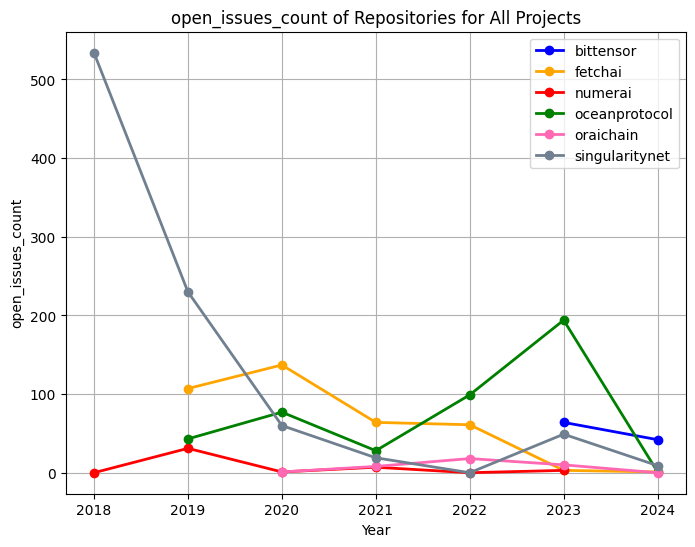

In [91]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_repo.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['open_issues_count'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['open_issues_count'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('open_issues_count of Repositories for All Projects')  
plt.xlabel('Year')  
plt.ylabel('open_issues_count') 
plt.grid(True) 
plt.xticks(yearly_data['Year'].unique())  

plt.show()

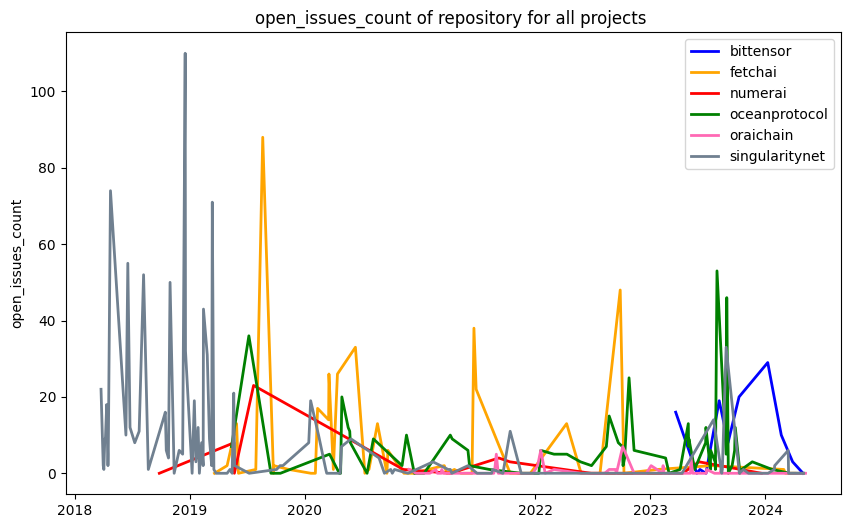

In [ ]:
j = 0
fig, ax = plt.subplots(figsize=(10,6))

# Reset the index, keeping the old index as a column
for key, value in daily_repo.items():
    value = value.set_index('Date')
    value.index = pd.to_datetime(value.index)
    plt.plot(value.index, value['open_issues_count'], label=key, color=color_list[j], linewidth=2.0)
    j += 1
    value = value.reset_index(drop=False)

plt.legend()
# Set title and labels
plt.title('open_issues_count of repository for all projects ')
plt.ylabel('open_issues_count')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Show the plot
plt.show()


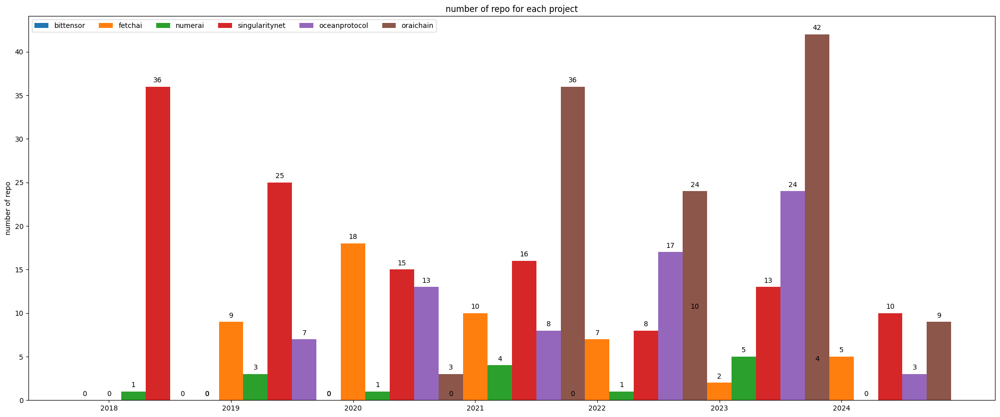

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_repo['bittensor'].groupby(pd.to_datetime(daily_repo['bittensor']['Date']).dt.year)["id"].sum()
fetchai = daily_repo['fetchai'].groupby(pd.to_datetime(daily_repo['fetchai']['Date']).dt.year)["id"].sum()
numerai = daily_repo['numerai'].groupby(pd.to_datetime(daily_repo['numerai']['Date']).dt.year)["id"].sum()
singularitynet = daily_repo['singularitynet'].groupby(pd.to_datetime(daily_repo['singularitynet']['Date']).dt.year)["id"].sum()
oceanprotocol = daily_repo['oceanprotocol'].groupby(pd.to_datetime(daily_repo['oceanprotocol']['Date']).dt.year)["id"].sum()
oraichain = daily_repo['oraichain'].groupby(pd.to_datetime(daily_repo['oraichain']['Date']).dt.year)["id"].sum()

for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_repo.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of repo')
ax.set_title('number of repo for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)
# ax.set_ylim(0, 35000)

plt.show()


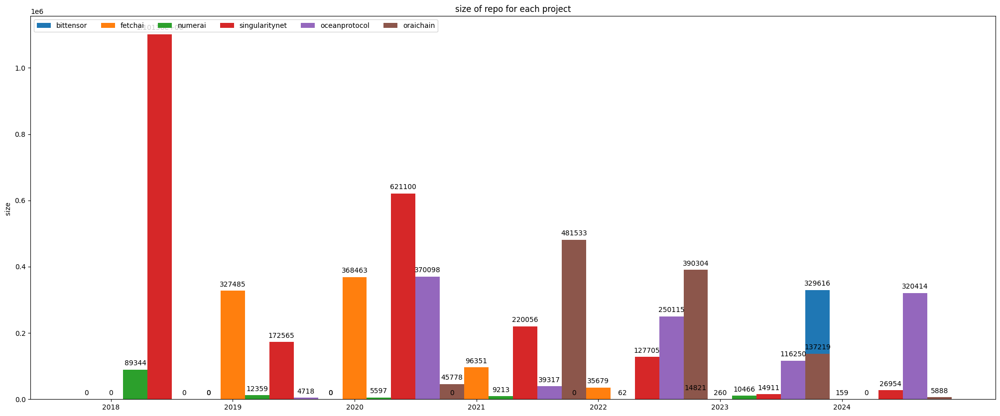

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_repo['bittensor'].groupby(pd.to_datetime(daily_repo['bittensor']['Date']).dt.year)["size"].sum()
fetchai = daily_repo['fetchai'].groupby(pd.to_datetime(daily_repo['fetchai']['Date']).dt.year)["size"].sum()
numerai = daily_repo['numerai'].groupby(pd.to_datetime(daily_repo['numerai']['Date']).dt.year)["size"].sum()
singularitynet = daily_repo['singularitynet'].groupby(pd.to_datetime(daily_repo['singularitynet']['Date']).dt.year)["size"].sum()
oceanprotocol = daily_repo['oceanprotocol'].groupby(pd.to_datetime(daily_repo['oceanprotocol']['Date']).dt.year)["size"].sum()
oraichain = daily_repo['oraichain'].groupby(pd.to_datetime(daily_repo['oraichain']['Date']).dt.year)["size"].sum()

for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_repo.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('size ')
ax.set_title('size of repo for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


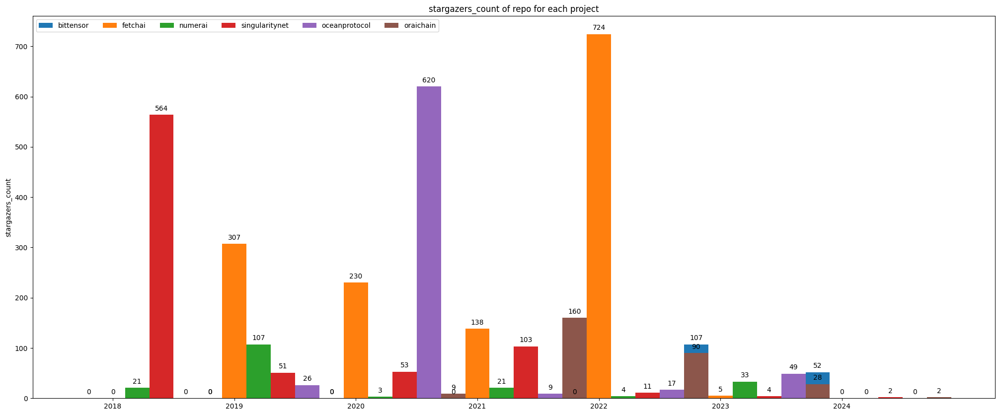

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_repo['bittensor'].groupby(pd.to_datetime(daily_repo['bittensor']['Date']).dt.year)["stargazers_count"].sum()
fetchai = daily_repo['fetchai'].groupby(pd.to_datetime(daily_repo['fetchai']['Date']).dt.year)["stargazers_count"].sum()
numerai = daily_repo['numerai'].groupby(pd.to_datetime(daily_repo['numerai']['Date']).dt.year)["stargazers_count"].sum()
singularitynet = daily_repo['singularitynet'].groupby(pd.to_datetime(daily_repo['singularitynet']['Date']).dt.year)["stargazers_count"].sum()
oceanprotocol = daily_repo['oceanprotocol'].groupby(pd.to_datetime(daily_repo['oceanprotocol']['Date']).dt.year)["stargazers_count"].sum()
oraichain = daily_repo['oraichain'].groupby(pd.to_datetime(daily_repo['oraichain']['Date']).dt.year)["stargazers_count"].sum()

for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_repo.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('stargazers_count')
ax.set_title('stargazers_count of repo for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


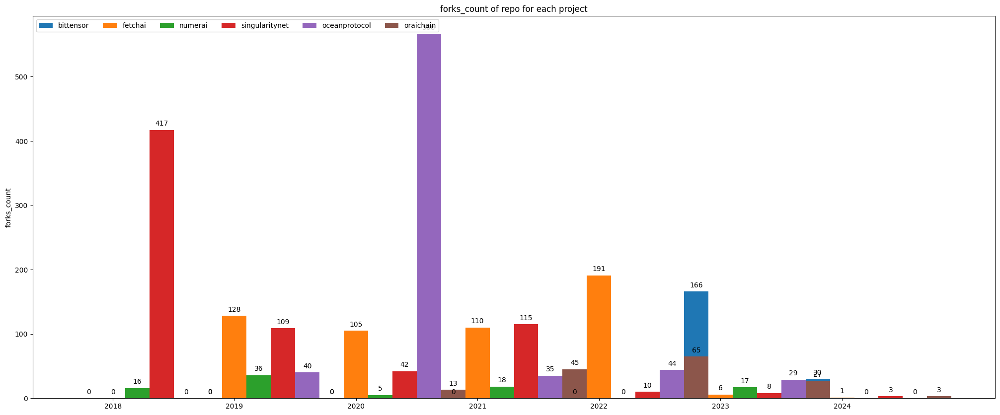

In [48]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_repo['bittensor'].groupby(pd.to_datetime(daily_repo['bittensor']['Date']).dt.year)["forks_count"].sum()
fetchai = daily_repo['fetchai'].groupby(pd.to_datetime(daily_repo['fetchai']['Date']).dt.year)["forks_count"].sum()
numerai = daily_repo['numerai'].groupby(pd.to_datetime(daily_repo['numerai']['Date']).dt.year)["forks_count"].sum()
singularitynet = daily_repo['singularitynet'].groupby(pd.to_datetime(daily_repo['singularitynet']['Date']).dt.year)["forks_count"].sum()
oceanprotocol = daily_repo['oceanprotocol'].groupby(pd.to_datetime(daily_repo['oceanprotocol']['Date']).dt.year)["forks_count"].sum()
oraichain = daily_repo['oraichain'].groupby(pd.to_datetime(daily_repo['oraichain']['Date']).dt.year)["forks_count"].sum()
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_repo.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('forks_count')
ax.set_title('forks_count of repo for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


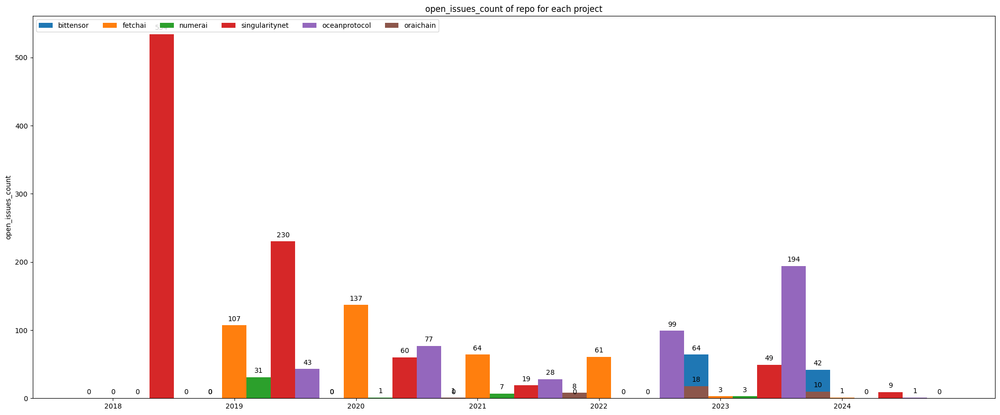

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_repo['bittensor'].groupby(pd.to_datetime(daily_repo['bittensor']['Date']).dt.year)["open_issues_count"].sum()
fetchai = daily_repo['fetchai'].groupby(pd.to_datetime(daily_repo['fetchai']['Date']).dt.year)["open_issues_count"].sum()
numerai = daily_repo['numerai'].groupby(pd.to_datetime(daily_repo['numerai']['Date']).dt.year)["open_issues_count"].sum()
singularitynet = daily_repo['singularitynet'].groupby(pd.to_datetime(daily_repo['singularitynet']['Date']).dt.year)["open_issues_count"].sum()
oceanprotocol = daily_repo['oceanprotocol'].groupby(pd.to_datetime(daily_repo['oceanprotocol']['Date']).dt.year)["open_issues_count"].sum()
oraichain = daily_repo['oraichain'].groupby(pd.to_datetime(daily_repo['oraichain']['Date']).dt.year)["open_issues_count"].sum()
# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_repo[df_name]['Date'] = pd.to_datetime(daily_repo[df_name]['Date'])
# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_repo.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_repo.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('open_issues_count')
ax.set_title('open_issues_count of repo for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


#### commits

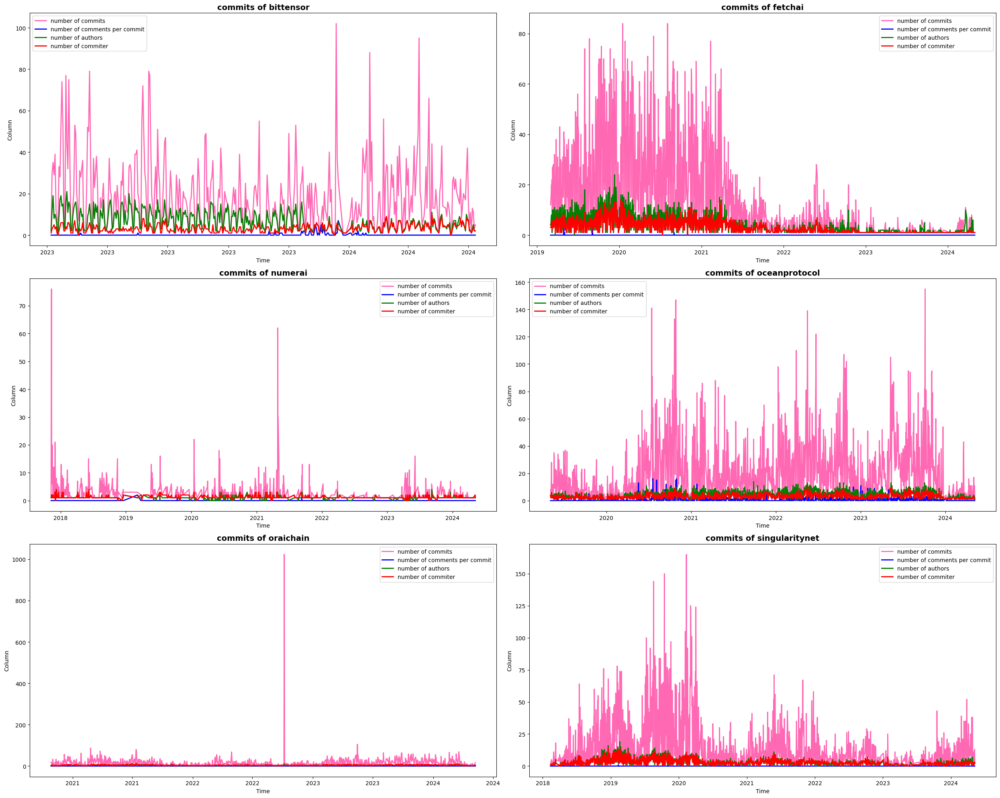

In [ ]:
pair_list = list(daily_commits.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = daily_commits[c]
    ax.plot(df['Date'],df['node_id'],label='number of commits', c=color_list[4], linewidth=2.0 )
    ax.plot(df['Date'],df['commit.comment_count'],label='number of comments per commit', c =color_list[0], linewidth=2.0 )
    ax.plot(df['Date'],df['author.id'],label='number of authors', c=color_list[3], linewidth=2.0 )
    ax.plot(df['Date'],df['committer.id'],label='number of commiter', c=color_list[2], linewidth=2.0 )

    ax.set_title(f'commits of {c}', fontsize=14, fontweight='bold')
    ax.set_ylabel(r'Column')
    ax.set_xlabel(r'Time')


    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  
    ax.legend()

plt.tight_layout()


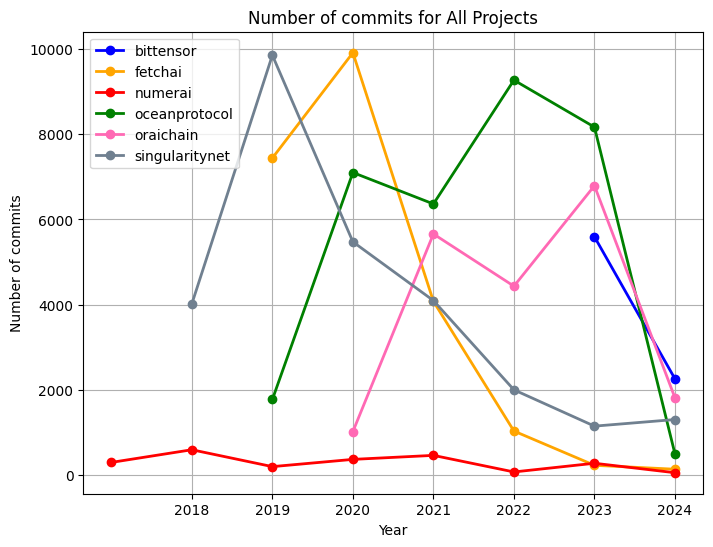

In [92]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_commits.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['node_id'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['node_id'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of commits for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of commits')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

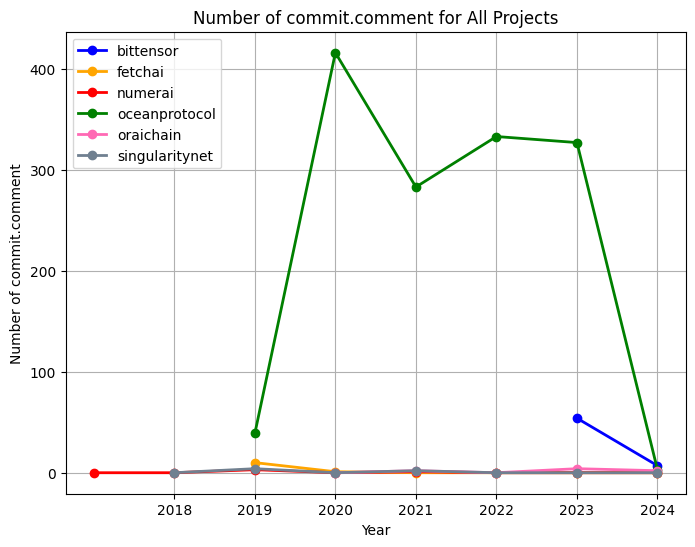

In [93]:


plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_commits.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['commit.comment_count'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['commit.comment_count'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of commit.comment for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of commit.comment')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

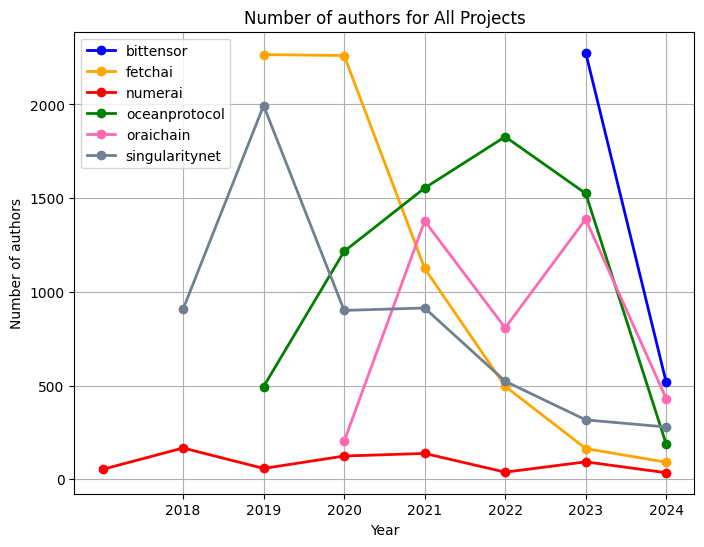

In [94]:

plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_commits.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['author.id'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['author.id'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of authors for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of authors')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

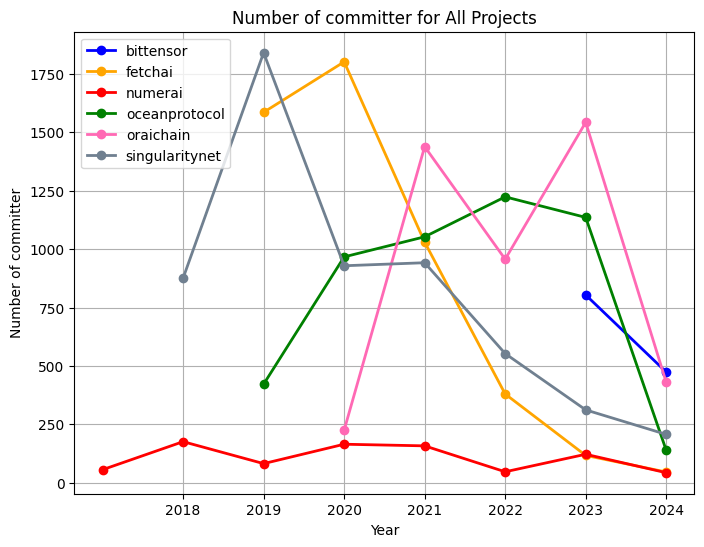

In [96]:

plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_commits.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['committer.id'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['committer.id'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of committer for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of committer')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

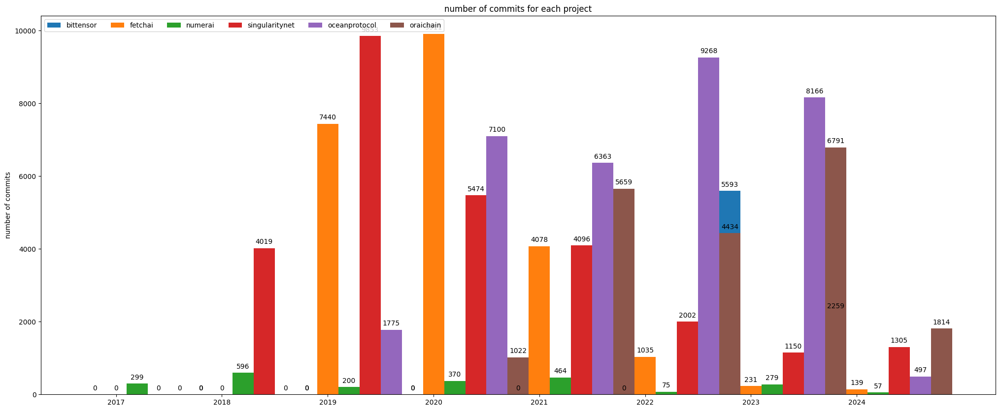

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_commits['bittensor'].groupby(pd.to_datetime(daily_commits['bittensor']['Date']).dt.year)["node_id"].sum()
fetchai = daily_commits['fetchai'].groupby(pd.to_datetime(daily_commits['fetchai']['Date']).dt.year)["node_id"].sum()
numerai = daily_commits['numerai'].groupby(pd.to_datetime(daily_commits['numerai']['Date']).dt.year)["node_id"].sum()
singularitynet = daily_commits['singularitynet'].groupby(pd.to_datetime(daily_commits['singularitynet']['Date']).dt.year)["node_id"].sum()
oceanprotocol = daily_commits['oceanprotocol'].groupby(pd.to_datetime(daily_commits['oceanprotocol']['Date']).dt.year)["node_id"].sum()
oraichain = daily_commits['oraichain'].groupby(pd.to_datetime(daily_commits['oraichain']['Date']).dt.year)["node_id"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_commits[df_name]['Date'] = pd.to_datetime(daily_commits[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_commits.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_commits.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of commits')
ax.set_title('number of commits for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


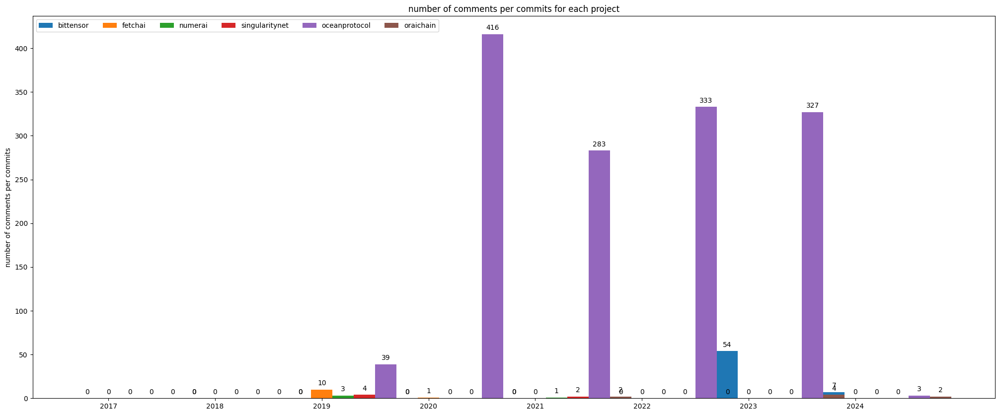

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_commits['bittensor'].groupby(pd.to_datetime(daily_commits['bittensor']['Date']).dt.year)["commit.comment_count"].sum()
fetchai = daily_commits['fetchai'].groupby(pd.to_datetime(daily_commits['fetchai']['Date']).dt.year)["commit.comment_count"].sum()
numerai = daily_commits['numerai'].groupby(pd.to_datetime(daily_commits['numerai']['Date']).dt.year)["commit.comment_count"].sum()
singularitynet = daily_commits['singularitynet'].groupby(pd.to_datetime(daily_commits['singularitynet']['Date']).dt.year)["commit.comment_count"].sum()
oceanprotocol = daily_commits['oceanprotocol'].groupby(pd.to_datetime(daily_commits['oceanprotocol']['Date']).dt.year)["commit.comment_count"].sum()
oraichain = daily_commits['oraichain'].groupby(pd.to_datetime(daily_commits['oraichain']['Date']).dt.year)["commit.comment_count"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_commits[df_name]['Date'] = pd.to_datetime(daily_commits[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_commits.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_commits.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of comments per commits')
ax.set_title('number of comments per commits for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


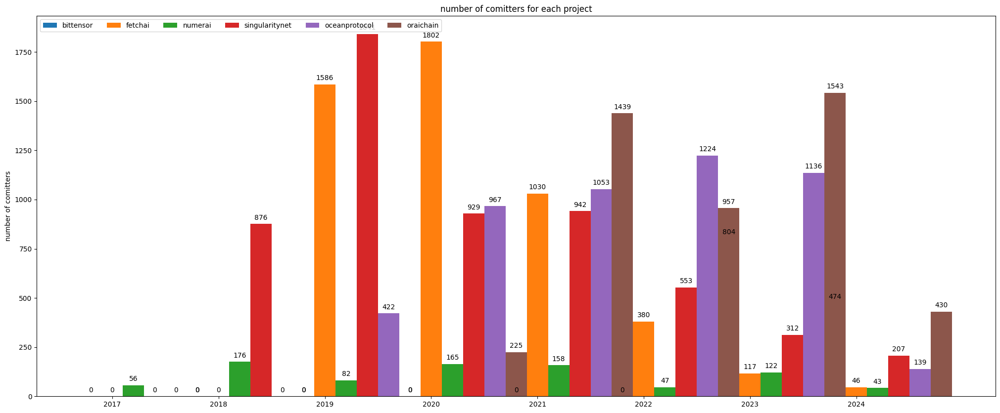

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_commits['bittensor'].groupby(pd.to_datetime(daily_commits['bittensor']['Date']).dt.year)["committer.id"].sum()
fetchai = daily_commits['fetchai'].groupby(pd.to_datetime(daily_commits['fetchai']['Date']).dt.year)["committer.id"].sum()
numerai = daily_commits['numerai'].groupby(pd.to_datetime(daily_commits['numerai']['Date']).dt.year)["committer.id"].sum()
singularitynet = daily_commits['singularitynet'].groupby(pd.to_datetime(daily_commits['singularitynet']['Date']).dt.year)["committer.id"].sum()
oceanprotocol = daily_commits['oceanprotocol'].groupby(pd.to_datetime(daily_commits['oceanprotocol']['Date']).dt.year)["committer.id"].sum()
oraichain = daily_commits['oraichain'].groupby(pd.to_datetime(daily_commits['oraichain']['Date']).dt.year)["committer.id"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_commits[df_name]['Date'] = pd.to_datetime(daily_commits[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_commits.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_commits.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of comitters')
ax.set_title('number of comitters for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


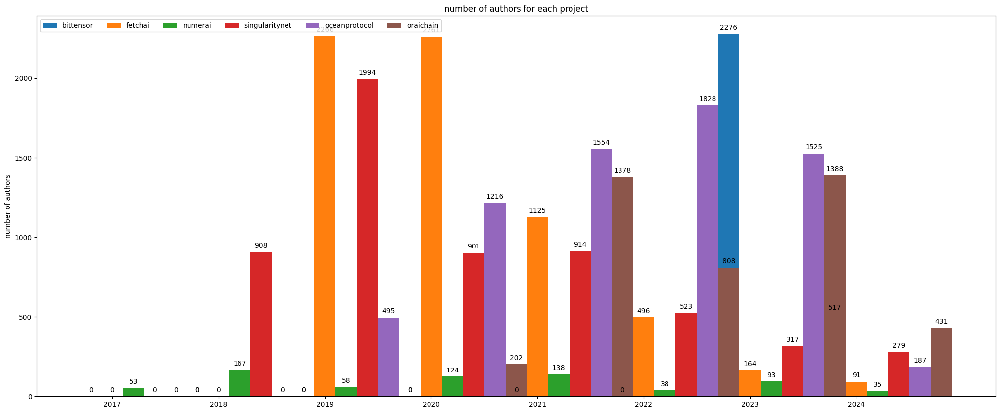

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_commits['bittensor'].groupby(pd.to_datetime(daily_commits['bittensor']['Date']).dt.year)["author.id"].sum()
fetchai = daily_commits['fetchai'].groupby(pd.to_datetime(daily_commits['fetchai']['Date']).dt.year)["author.id"].sum()
numerai = daily_commits['numerai'].groupby(pd.to_datetime(daily_commits['numerai']['Date']).dt.year)["author.id"].sum()
singularitynet = daily_commits['singularitynet'].groupby(pd.to_datetime(daily_commits['singularitynet']['Date']).dt.year)["author.id"].sum()
oceanprotocol = daily_commits['oceanprotocol'].groupby(pd.to_datetime(daily_commits['oceanprotocol']['Date']).dt.year)["author.id"].sum()
oraichain = daily_commits['oraichain'].groupby(pd.to_datetime(daily_commits['oraichain']['Date']).dt.year)["author.id"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_commits[df_name]['Date'] = pd.to_datetime(daily_commits[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_commits.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_commits.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of authors')
ax.set_title('number of authors for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


#### issues

id	comments	reactions.total_count

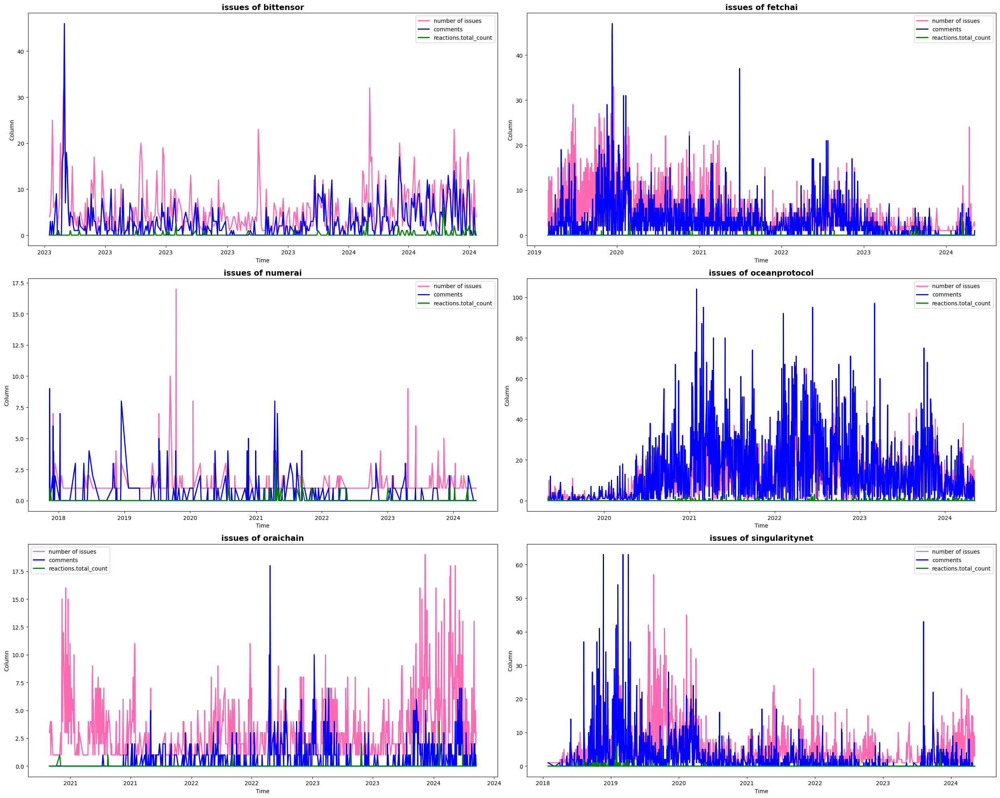

In [ ]:
pair_list = list(daily_issue.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = daily_issue[c]
    ax.plot(df['Date'],df['id'],label='number of issues', c=color_list[4], linewidth=2.0 )
    ax.plot(df['Date'],df['comments'],label='comments', c =color_list[0], linewidth=2.0 )
    ax.plot(df['Date'],df['reactions.total_count'],label='reactions.total_count', c=color_list[3], linewidth=2.0 )

    ax.set_title(f'issues of {c}', fontsize=14, fontweight='bold')
    ax.set_ylabel(r'Column')
    ax.set_xlabel(r'Time')

    # Set the x-axis to show only the year
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show the year only
    ax.legend()

    # Adjust layout to prevent overlap
plt.tight_layout()


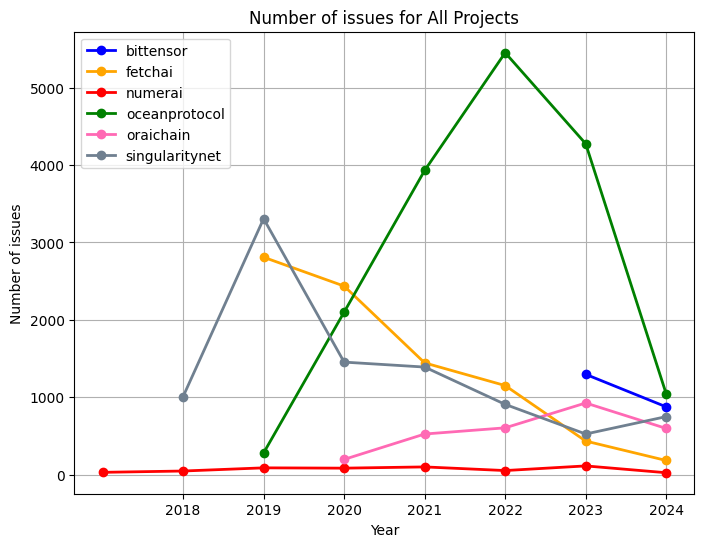

In [97]:

plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_issue.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['id'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['id'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of issues for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of issues')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

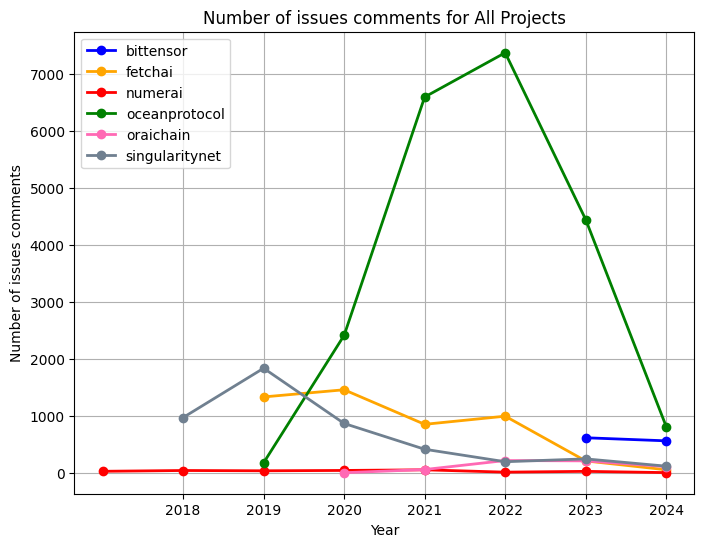

In [98]:

plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_issue.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['comments'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['comments'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of issues comments for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of issues comments')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

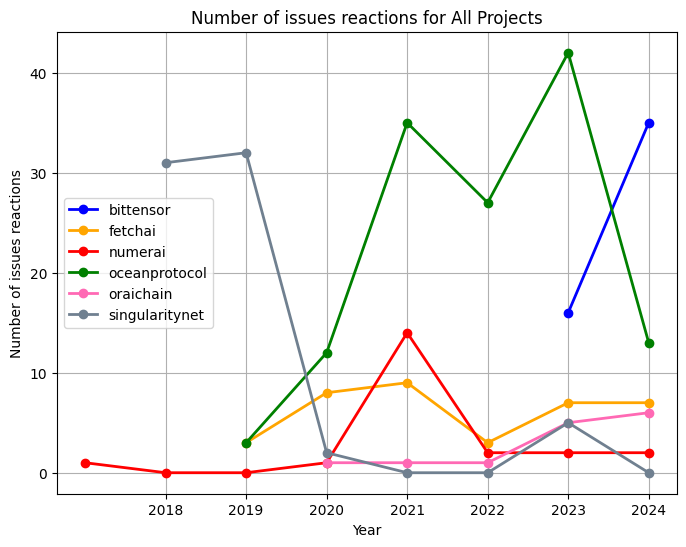

In [99]:

plt.figure(figsize=(8, 6))

j = 0
for key, value in daily_issue.items():
    value['Date'] = pd.to_datetime(value['Date'])
    value = value.set_index('Date')

    value['Year'] = value.index.year

    yearly_data = value.groupby('Year')['reactions.total_count'].sum().reset_index()

    plt.plot(yearly_data['Year'], yearly_data['reactions.total_count'], label=key, color=color_list[j], marker='o', linewidth=2.0)
    j += 1

plt.legend()
plt.title('Number of issues reactions for All Projects')  
plt.xlabel('Year')   
plt.ylabel('Number of issues reactions')   
plt.grid(True)  # 
plt.xticks(yearly_data['Year'].unique())   

plt.show()

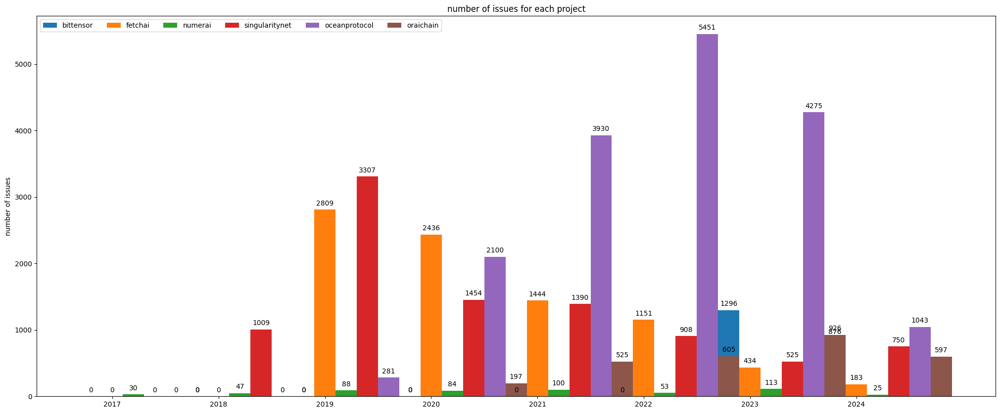

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_issue['bittensor'].groupby(pd.to_datetime(daily_issue['bittensor']['Date']).dt.year)["id"].sum()
fetchai = daily_issue['fetchai'].groupby(pd.to_datetime(daily_issue['fetchai']['Date']).dt.year)["id"].sum()
numerai = daily_issue['numerai'].groupby(pd.to_datetime(daily_issue['numerai']['Date']).dt.year)["id"].sum()
singularitynet = daily_issue['singularitynet'].groupby(pd.to_datetime(daily_issue['singularitynet']['Date']).dt.year)["id"].sum()
oceanprotocol = daily_issue['oceanprotocol'].groupby(pd.to_datetime(daily_issue['oceanprotocol']['Date']).dt.year)["id"].sum()
oraichain = daily_issue['oraichain'].groupby(pd.to_datetime(daily_issue['oraichain']['Date']).dt.year)["id"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_issue[df_name]['Date'] = pd.to_datetime(daily_issue[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_issue.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_issue.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of issues')
ax.set_title('number of issues for each project')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


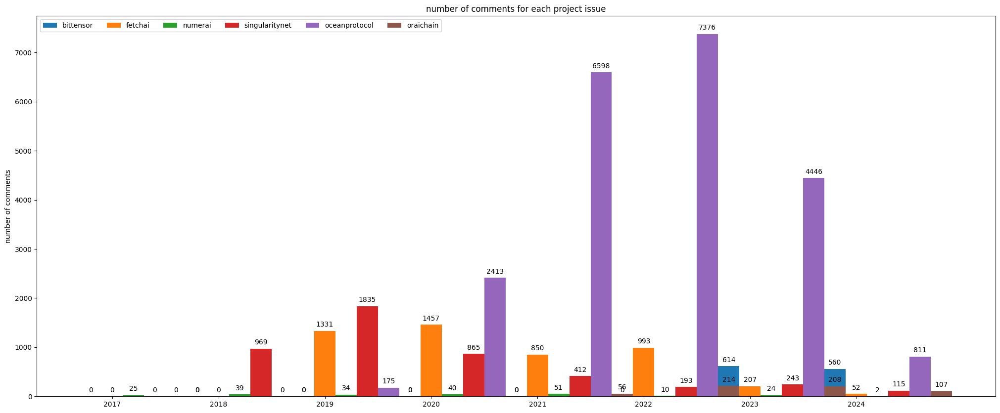

In [ ]:

# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_issue['bittensor'].groupby(pd.to_datetime(daily_issue['bittensor']['Date']).dt.year)["comments"].sum()
fetchai = daily_issue['fetchai'].groupby(pd.to_datetime(daily_issue['fetchai']['Date']).dt.year)["comments"].sum()
numerai = daily_issue['numerai'].groupby(pd.to_datetime(daily_issue['numerai']['Date']).dt.year)["comments"].sum()
singularitynet = daily_issue['singularitynet'].groupby(pd.to_datetime(daily_issue['singularitynet']['Date']).dt.year)["comments"].sum()
oceanprotocol = daily_issue['oceanprotocol'].groupby(pd.to_datetime(daily_issue['oceanprotocol']['Date']).dt.year)["comments"].sum()
oraichain = daily_issue['oraichain'].groupby(pd.to_datetime(daily_issue['oraichain']['Date']).dt.year)["comments"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_issue[df_name]['Date'] = pd.to_datetime(daily_issue[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_issue.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_issue.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of comments')
ax.set_title('number of comments for each project issue')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


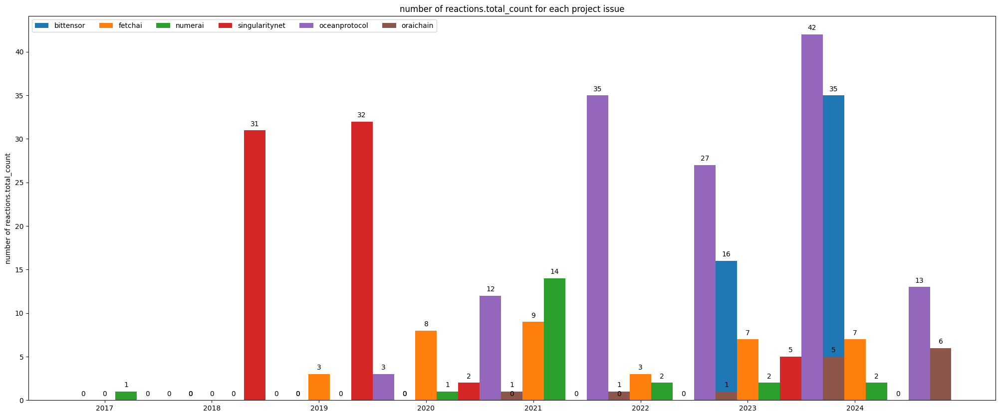

In [ ]:


# Assuming daily_repo is a dictionary of DataFrames, each with a 'Date' column
bittensor = daily_issue['bittensor'].groupby(pd.to_datetime(daily_issue['bittensor']['Date']).dt.year)["reactions.total_count"].sum()
fetchai = daily_issue['fetchai'].groupby(pd.to_datetime(daily_issue['fetchai']['Date']).dt.year)["reactions.total_count"].sum()
numerai = daily_issue['numerai'].groupby(pd.to_datetime(daily_issue['numerai']['Date']).dt.year)["reactions.total_count"].sum()
singularitynet = daily_issue['singularitynet'].groupby(pd.to_datetime(daily_issue['singularitynet']['Date']).dt.year)["reactions.total_count"].sum()
oceanprotocol = daily_issue['oceanprotocol'].groupby(pd.to_datetime(daily_issue['oceanprotocol']['Date']).dt.year)["reactions.total_count"].sum()
oraichain = daily_issue['oraichain'].groupby(pd.to_datetime(daily_issue['oraichain']['Date']).dt.year)["reactions.total_count"].sum()


# Convert 'Date' column to datetime format if needed
for df_name in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    daily_issue[df_name]['Date'] = pd.to_datetime(daily_issue[df_name]['Date'])

# Create a range of years from the earliest to the latest year
start_year = min([df['Date'].dt.year.min() for df in daily_issue.values()])
end_year = max([df['Date'].dt.year.max() for df in daily_issue.values()])
uniqueness = pd.Series(range(start_year, end_year + 1))

fig, ax = plt.subplots(figsize=(25, 10))

projects = {
    'bittensor': bittensor,
    'fetchai': fetchai,
    'numerai': numerai,
    'singularitynet': singularitynet,
    'oceanprotocol': oceanprotocol,
    'oraichain': oraichain
}

x = np.arange(len(uniqueness))  # the label locations
width = 0.2  # the width of the bars
multiplier = 0

for key, value in projects.items():
    value = value.reindex(uniqueness, fill_value=0)
    offset = width * multiplier
    rects = ax.bar(x + offset, value.values, width, label=key)
    ax.bar_label(rects, padding=4)
    multiplier += 1

ax.set_ylabel('number of reactions.total_count')
ax.set_title('number of reactions.total_count for each project issue')
ax.set_xticks(x + width, uniqueness)
ax.legend(loc='upper left', ncols=6)

plt.show()


### Rank the Most Active Developers
10 points<br/>
Analyze developer activity within each project and identify the most active contributors.
Graph the evolution of this ranking over time to track changes in developer involvement.

In [ ]:
commits_dicts = {}
repo_dicts = {}
issue_dicts = {}
merged_dict ={}
os.makedirs('rank')
path = 'url_fields_removed/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    type = name.split('_')[1]
    name = name.split('_')[0]
    df = pd.read_csv(path + full_name)
    if type== 'issues':
        df = df[['user.id', 'user.site_admin' , 'user.node_id', 'user.type',  'created_at']]
        issue_dicts.update({name:df})
    if type== 'repos':
        df = df[[ 'owner.id', 'owner.site_admin','owner.node_id', 'owner.type',  'created_at']]
        repo_dicts.update({name:df})
    if type== 'commits':
        df = df[['commit.author.name', 'author.id', 'author.node_id', 'author.type', 'author.site_admin', 'commit.author.date']]
        commits_dicts.update({name:df})
    df.to_csv('rank/'+ full_name)

# for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
#     df = commits_dicts[crypto].merge(issue_dicts[crypto], left_on='author.login', right_on='user.login')
#     df = df.merge(repo_dicts[crypto],  left_on='author.login', right_on='owner.login')
#     merged_dict.update({name:df})

# for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
#     crypto_activity = merged_dict[crypto].groupby('author.login')['commit.author.date'].count().reset_index().rename(columns={'commit.author.date': 'activity_count'})
#     crypto_ranking = crypto_activity.sort_values('activity_count', ascending=False)
#     plt.plot(crypto_ranking.index, crypto_ranking['activity_count'], label=crypto)

# # Add labels and title to the plot
# plt.xlabel('Developer Ranking')
# plt.ylabel('Activity Count')
# plt.title('Evolution of Developer Ranking')

# # Show the legend and plot
# plt.legend()
# plt.show()



In [2]:
import os

commits_dicts = {}
repo_dicts = {}
issue_dicts = {}
# os.makedirs('rank')
path = 'rank/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    type = name.split('_')[1]
    name = name.split('_')[0]
    df = pd.read_csv(path + full_name)
    if type== 'issues':
        # df = df[['reactions.total_count','user.login', 'user.id', 'user.node_id', 'user.gravatar_id', 'user.type', 'user.site_admin', 'created_at']]
        issue_dicts.update({name:df})
    if type== 'repos':
        # df = df[['owner.login', 'owner.id', 'owner.node_id', 'owner.gravatar_id', 'owner.type', 'owner.site_admin', 'created_at']]
        repo_dicts.update({name:df})
    if type== 'commits':
        # df = df[['commit.author.name','commit.committer.name','commit.committer.date','commit.author.date', 'author.id','committer.id'
        #           ,'committer.type','committer.site_admin', 'committer.node_id', 'author.node_id', 'author.type', 'author.site_admin']]
        commits_dicts.update({name:df})
    # df.to_csv('rank/'+ full_name)





In [ ]:
merged_dict ={}

for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    df = commits_dicts[crypto].merge(issue_dicts[crypto], left_on='author.id', right_on='user.id')
    merged_dict.update({crypto:df})
    print('commit.author',crypto, df.shape)


commit.author bittensor (1406072, 19)
commit.author fetchai (12201351, 19)
commit.author numerai (56155, 19)
commit.author singularitynet (7608859, 19)


In [ ]:
merged_dict ={}

In [3]:
merged_dict ={}

for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    df = commits_dicts[crypto].merge(issue_dicts[crypto], left_on='committer.id', right_on='user.id')
    merged_dict.update({crypto:df})
    print('commit.comitter',crypto, df.shape)





commit.comitter bittensor (866936, 19)
commit.comitter fetchai (8036764, 19)
commit.comitter numerai (41220, 19)
commit.comitter singularitynet (4679627, 19)
commit.comitter oceanprotocol (12713069, 19)
commit.comitter oraichain (3045541, 19)


In [7]:
merged_dict['fetchai'].columns

Index(['Unnamed: 0_x', 'commit.author.name', 'commit.committer.name',
       'commit.committer.date', 'commit.author.date', 'author.id',
       'committer.id', 'committer.type', 'committer.site_admin',
       'committer.node_id', 'author.node_id', 'author.type',
       'author.site_admin', 'Unnamed: 0_y', 'user.id', 'user.site_admin',
       'user.node_id', 'user.type', 'created_at'],
      dtype='object')

In [6]:
crypto_ranking = {}
for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    print(crypto)
    # print(merged_dict)

    # print(merged_dict[crypto].columns)
    crypto_activity = merged_dict[crypto].groupby('committer.id')['commit.committer.date'].count().reset_index()
    ranking = crypto_activity.sort_values('commit.committer.date', ascending=False)
    # print(crypto_ranking)
    ranking = ranking.merge(merged_dict[crypto][['committer.id', 'commit.committer.name']],
                                      on='committer.id', how='left')
    ranking = ranking.drop_duplicates(subset=['committer.id'])
    crypto_ranking.update({crypto: ranking})
    print(crypto_ranking[crypto].head(10))


bittensor
        committer.id  commit.committer.date commit.committer.name
0         24501463.0                 238800     Cameron Fairchild
238800    31426574.0                 149058               ifrit98
387858     5873393.0                 101094          Ala Shaabana
488952    22141615.0                  74284        Raj Karamchedu
563236    85906264.0                  58864                Eugene
622100    32490803.0                  52000               unconst
674100     6709103.0                  50700          Steffen Cruz
724800    38992619.0                  45864            p-ferreira
770664    49876827.0                  34228        isabella618033
804892    93473497.0                  19075              opentaco
fetchai
         committer.id  commit.committer.date     commit.committer.name
0          19314578.0                4457300            David Minarsch
4457300     9467617.0                1975866             MarcoFavorito
6433166      132153.0                 38950

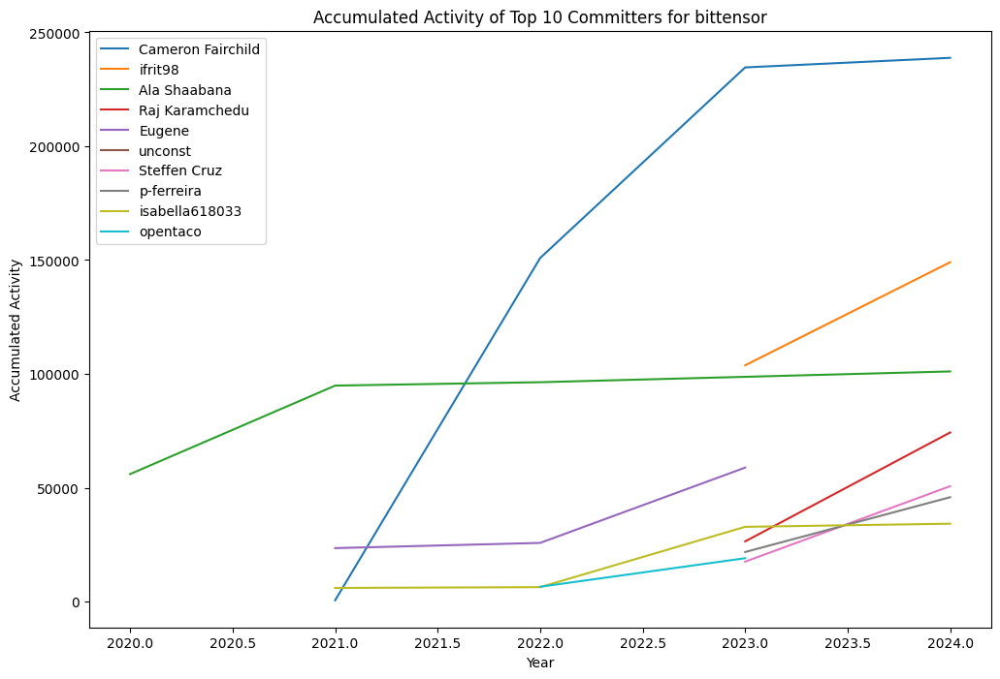

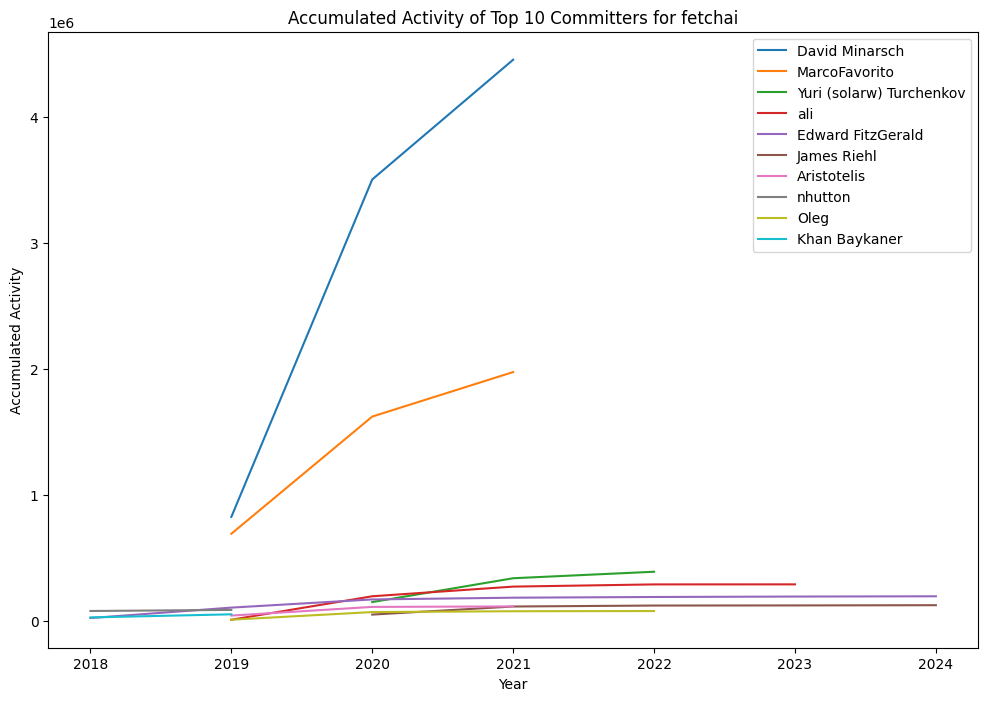

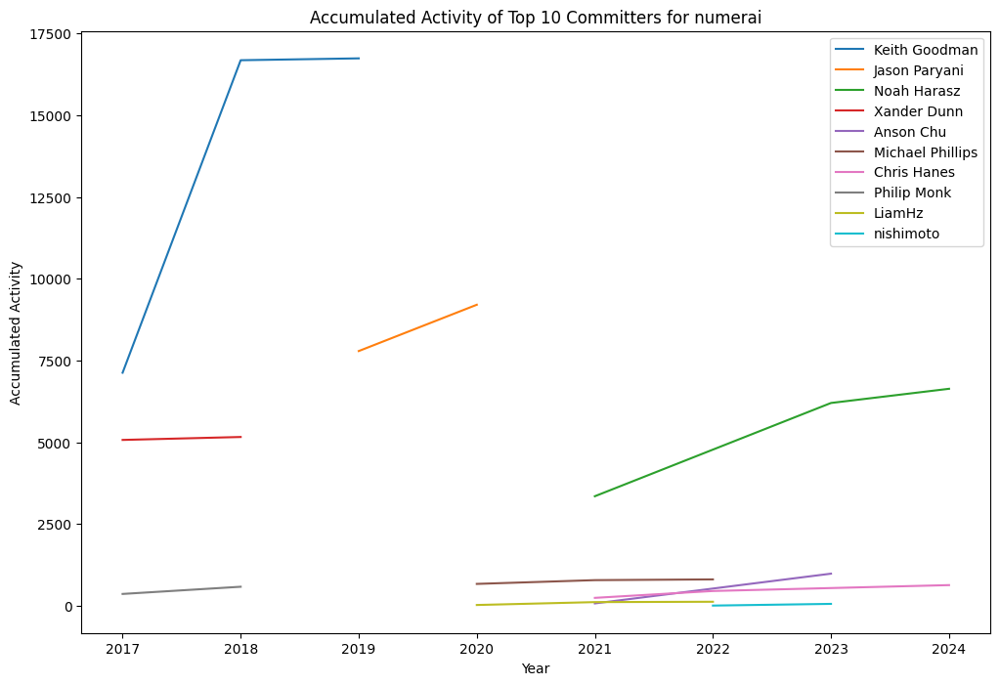

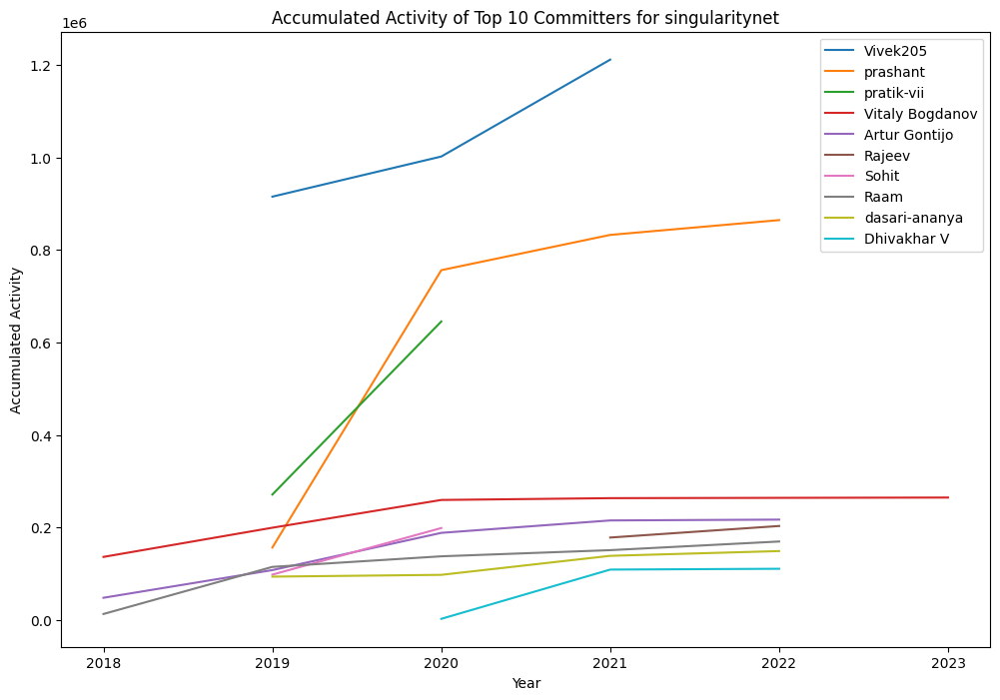

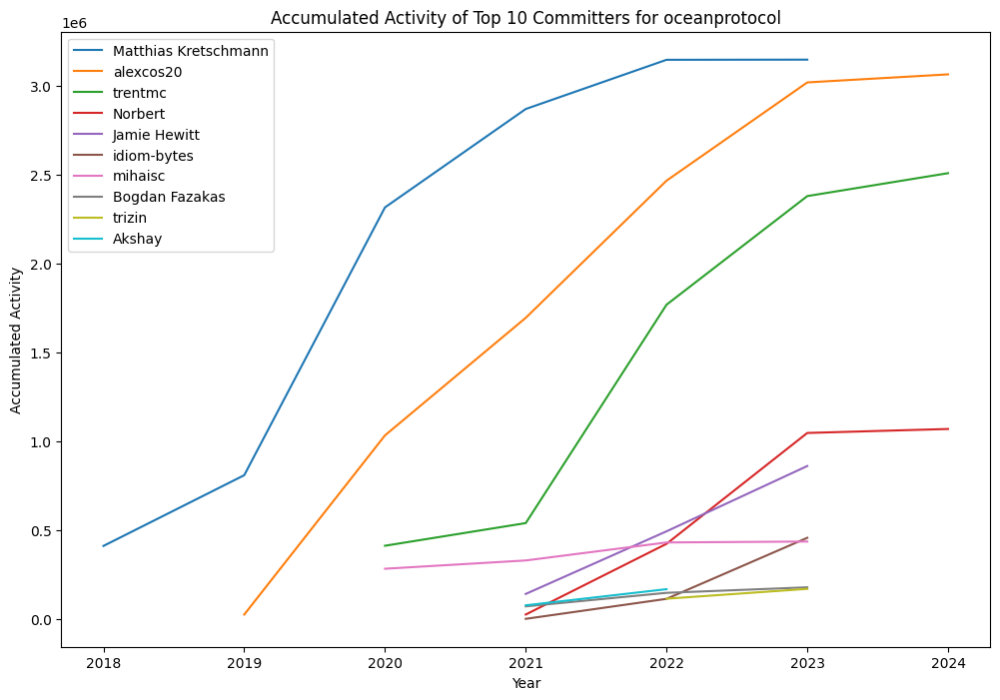

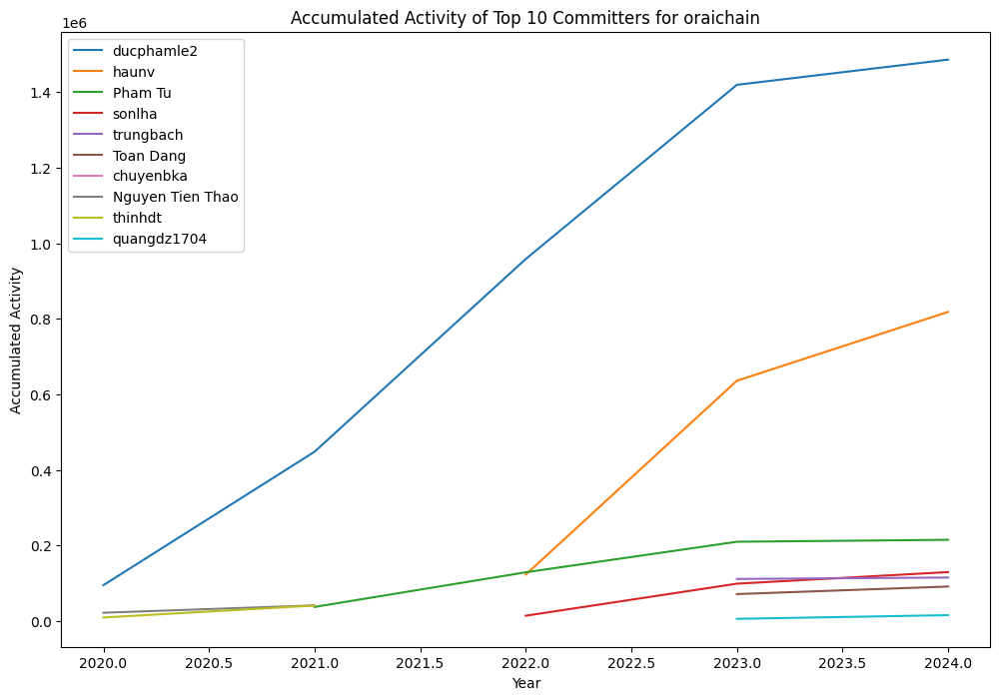

In [8]:

def plot_committer_activity(merged_dict, crypto):
    # Get the top 10 committers for the given crypto
    crypto_activity = merged_dict[crypto].groupby('committer.id')['commit.committer.date'].count().reset_index()
    crypto_ranking = crypto_activity.sort_values('commit.committer.date', ascending=False).head(10)
    crypto_ranking = crypto_ranking.merge(merged_dict[crypto][['committer.id', 'commit.committer.name']], on='committer.id', how='left')
    crypto_ranking = crypto_ranking.drop_duplicates(subset=['committer.id'])

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(12, 8))

    # Plot the accumulated activity for each top committer
    for committer_id in crypto_ranking['committer.id']:
        committer_activity = merged_dict[crypto][merged_dict[crypto]['committer.id'] == committer_id].groupby(pd.to_datetime(merged_dict[crypto]['commit.committer.date']).dt.year)['commit.committer.date'].count().cumsum()
        committer_name = crypto_ranking[crypto_ranking['committer.id'] == committer_id]['commit.committer.name'].values[0]
        ax.plot(committer_activity.index, committer_activity, label=committer_name)

    # Set the title, axis labels, and legend
    ax.set_title(f"Accumulated Activity of Top 10 Committers for {crypto}")
    ax.set_xlabel("Year")
    ax.set_ylabel("Accumulated Activity")
    ax.legend()

    # Show the plot
    plt.show()

# Call the function for each cryptocurrency
for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    plot_committer_activity(merged_dict, crypto)

In [ ]:
crypto_ranking = crypto_ranking.groupby([pd.Grouper(key='commit.committer.date', freq='Y'), 'committer.id']).count().reset_index()
import plotly.graph_objs as go

# Assuming crypto_ranking is your DataFrame
fig = go.Figure()

for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    crypto_data = crypto_ranking[crypto_ranking['committer.id'] == crypto]
    for year in crypto_data['commit.committer.date'].unique():
        year_data = crypto_data[crypto_data['commit.committer.date'] == year]
        fig.add_trace(go.Scatter(x=year_data['commit.committer.date'], y=year_data['commit.committer.date'].count(), name=f"{crypto} - {year}"))

fig.update_layout(title="Accumulated Activity of Top 10 Crypto Rankings by Year", xaxis_title="Year", yaxis_title="Number of Commits")
fig.show()


### Rank Repositories by Activity
10 points<br/>
For each project, rank repositories by the number of commits. This will help identify which parts of the project are seeing the most development activity.

In [56]:
import ast

def extract_repo_name(row):
    try:
        row = ast.literal_eval(row)
        if len(row)>0 and row!='nan':
            try:
                splitted_text = row[0]['url'].split('/')
            except (ValueError, SyntaxError):
                print("erroooooor", row)
            repos_index = splitted_text.index('repos')
            if repos_index + 2 < len(splitted_text):
                words_after_repos = splitted_text[repos_index + 1], splitted_text[repos_index + 2]
            return words_after_repos[0]+ '/' + words_after_repos[1]
        else:
            return ''
    except(ValueError, SyntaxError):
        print("erro000ooooor", row)

In [70]:
commits_dict = {}
repo_dict={}
path = 'url_fields_removed/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    type = name.split('_')[1]
    name = name.split('_')[0]
    df = pd.read_csv(path+full_name)
    print(name)

    if type== 'commits':
        df['parents'].fillna('[]', inplace=True)
        df['repo_name'] = df['parents'].apply(extract_repo_name)
        # print(df['repo_name'][0])
        commits_dict.update({name:df})
    if type == 'repos':
        repo_dict.update({name:df})


bittensor
bittensor
bittensor
fetchai
fetchai
fetchai
numerai
numerai
numerai
oceanprotocol
oceanprotocol
oceanprotocol
oraichain
oraichain
oraichain
singularitynet
singularitynet
singularitynet


In [77]:
merged_dict={}
for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
        df = commits_dict[crypto].merge(repo_dict[crypto], left_on='repo_name', right_on='full_name')
        print(df.shape)
        merged_dict.update({crypto:df})
print(df.columns)

(24969, 81)
(44346, 81)
(2710, 81)
(28003, 81)
(35959, 81)
(22559, 81)
Index(['sha', 'node_id_x', 'parents', 'commit.author.name',
       'commit.author.email', 'commit.author.date', 'commit.committer.name',
       'commit.committer.email', 'commit.committer.date', 'commit.message',
       'commit.tree.sha', 'commit.comment_count',
       'commit.verification.verified', 'commit.verification.reason',
       'commit.verification.signature', 'commit.verification.payload',
       'author.login', 'author.id', 'author.node_id', 'author.gravatar_id',
       'author.type', 'author.site_admin', 'committer.login', 'committer.id',
       'committer.node_id', 'committer.gravatar_id', 'committer.type',
       'committer.site_admin', 'author', 'committer', 'repo_name', 'id',
       'node_id_y', 'name', 'full_name', 'private', 'description', 'fork',
       'created_at', 'updated_at', 'pushed_at', 'homepage', 'size',
       'stargazers_count', 'watchers_count', 'language', 'has_issues',
       'has_pr

In [82]:
crypto_ranking = {}
for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    print(crypto)
    crypto_activity = merged_dict[crypto].groupby('id')['node_id_x'].count().reset_index()
    ranking = crypto_activity.sort_values('node_id_x', ascending=False)
    ranking = ranking.merge(merged_dict[crypto][['full_name', 'id']],on='id' ,how='left')
    ranking = ranking.drop_duplicates(subset=['id'])
    crypto_ranking.update({crypto: ranking})
    print(crypto_ranking[crypto].head(10))


bittensor
              id  node_id_x                  full_name
0      761412090      14769    opentensor/polkadot-sdk
14769  283347912       3851       opentensor/bittensor
18620  608683796       1210       opentensor/subtensor
19830  741209532        898       opentensor/prompting
20728  703178046        620  opentensor/developer-docs
21348  498821260        601        opentensor/old-docs
21949  601243114        554      opentensor/validators
22503  687654447        447  opentensor/text-prompting
22950  530342503        312     opentensor/mem-pytorch
23262  508370989        275           opentensor/squid
fetchai
              id  node_id_x                 full_name
0      203558879      11310        fetchai/agents-aea
11310  381083181       8481        fetchai/tendermint
19791  239742630       7753  fetchai/cosmos-consensus
27544  248020306       6061        fetchai/cosmos-sdk
33605  117567381       2055            fetchai/ledger
35660  145117118       1130    fetchai/ledger-archive

bittensor


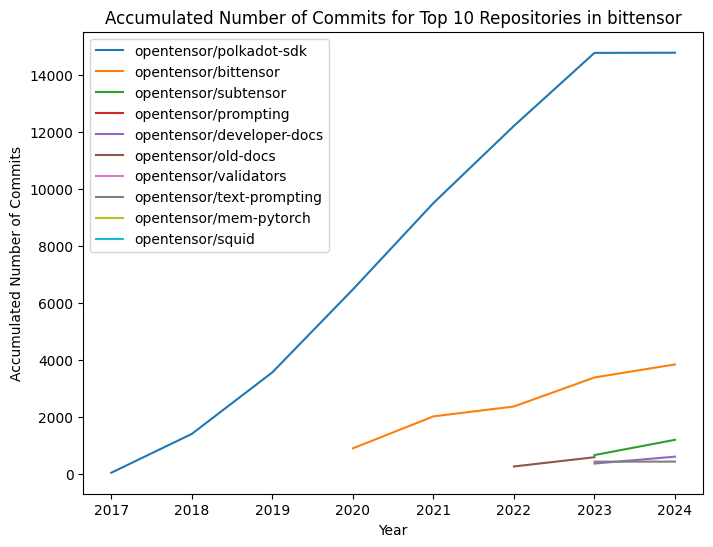

fetchai


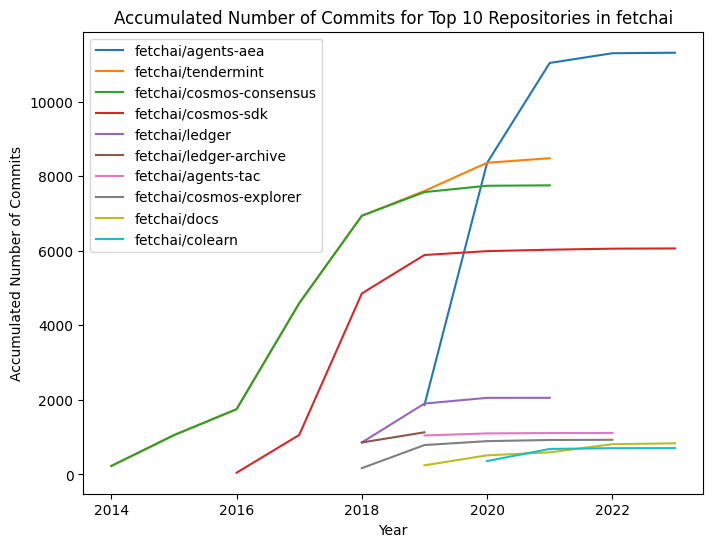

numerai


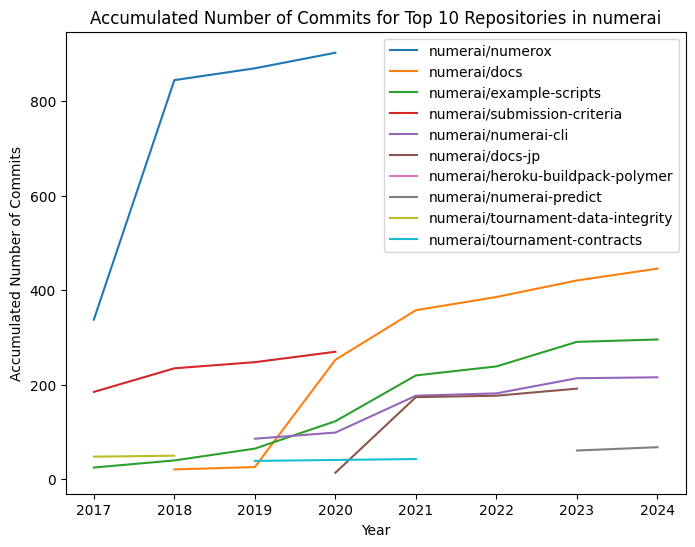

singularitynet


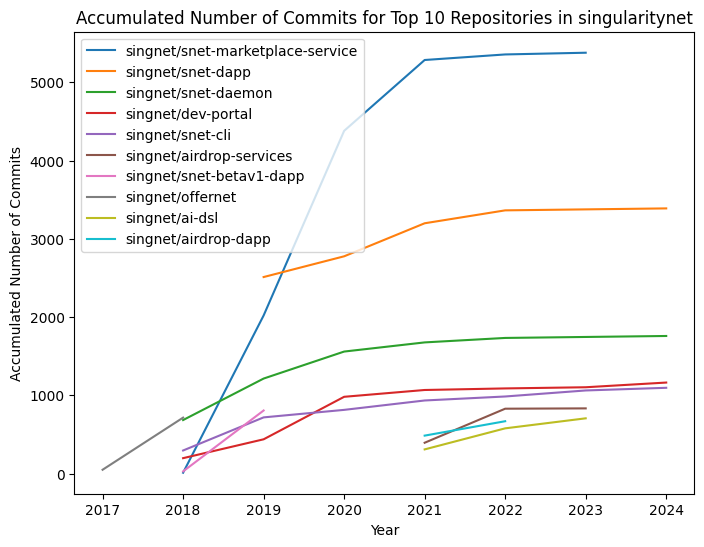

oceanprotocol


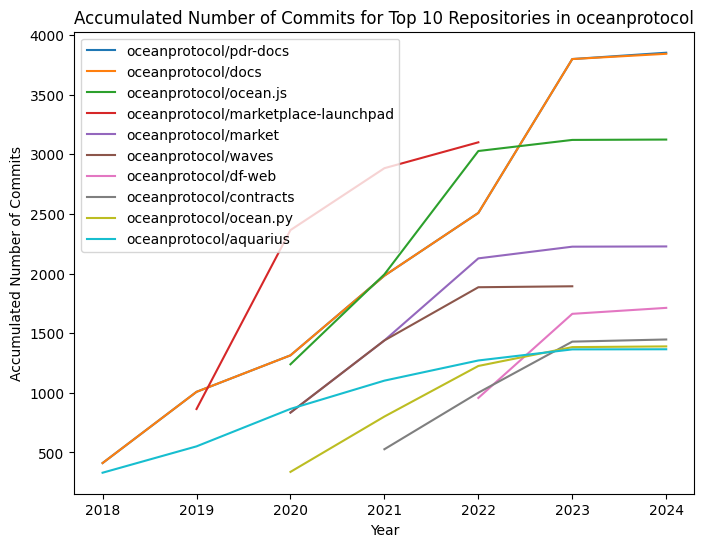

oraichain


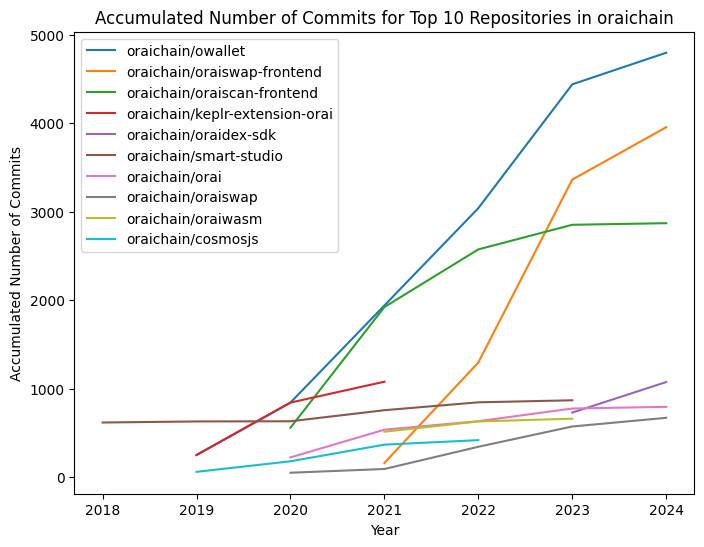

In [93]:

def plot_ranked_repo(merged_dict, crypto):
    # Get the top 10 committers for the given crypto
    print(crypto)
    crypto_activity = merged_dict[crypto].groupby('id')['node_id_x'].count().reset_index()
    ranking = crypto_activity.sort_values('node_id_x', ascending=False).head(10)
    ranking = ranking.merge(merged_dict[crypto][['full_name', 'id']], on='id', how='left')
    ranking = ranking.drop_duplicates(subset=['id'])

    fig, ax = plt.subplots(figsize=(8, 6))

    for id in ranking['id']:
        ranked_Repo = merged_dict[crypto][merged_dict[crypto]['id'] == id].groupby(pd.to_datetime(merged_dict[crypto]['commit.committer.date']).dt.year)['node_id_x'].count().cumsum()
        committer_name = ranking[ranking['id'] == id]['full_name'].values[0]
        ax.plot(ranked_Repo.index, ranked_Repo, label=committer_name)

    ax.set_title(f"Accumulated Number of Commits for Top 10 Repositories in {crypto}")
    ax.set_xlabel("Year")
    ax.set_ylabel("Accumulated Number of Commits")
    ax.legend()

    plt.show()

for crypto in ['bittensor', 'fetchai', 'numerai', 'singularitynet', 'oceanprotocol', 'oraichain']:
    plot_ranked_repo(merged_dict, crypto)

### Correlations
20 points<br/>
Use statistical methods to determine the correlation between developer activity and project token price.
Analyze the correlation in different timeframes (short-term, medium-term, long-term) to understand if phases of high or low activity impact token price.

#### Calculate Pearson Correlation 


#### weekly

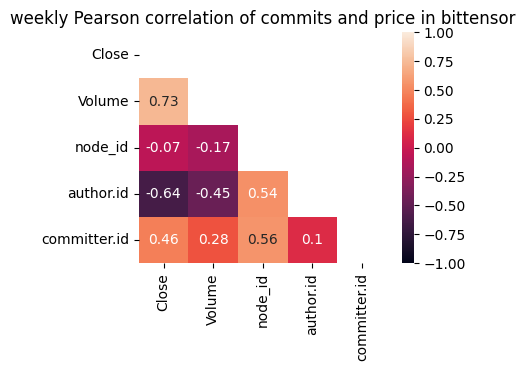

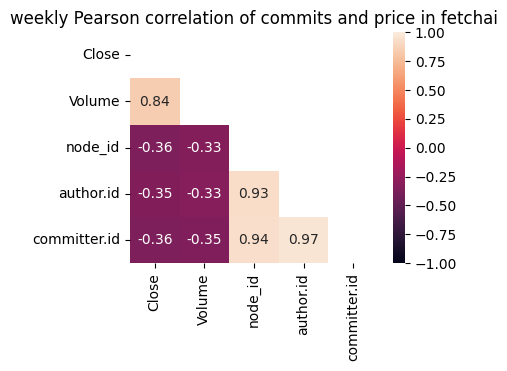

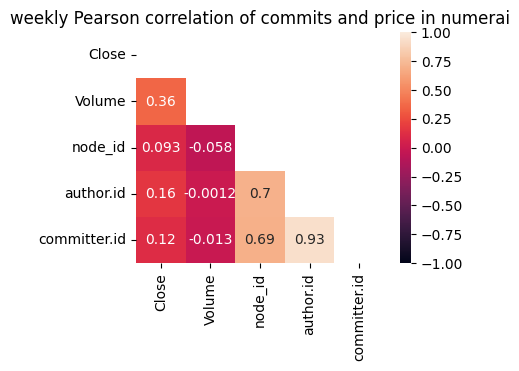

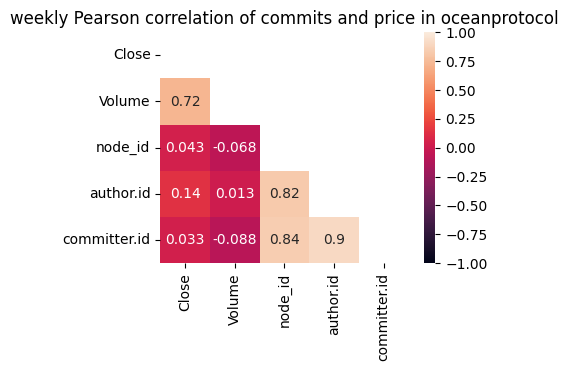

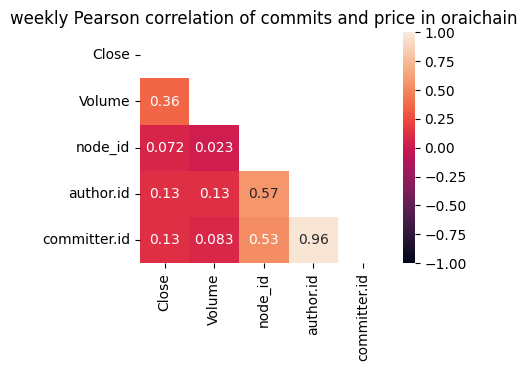

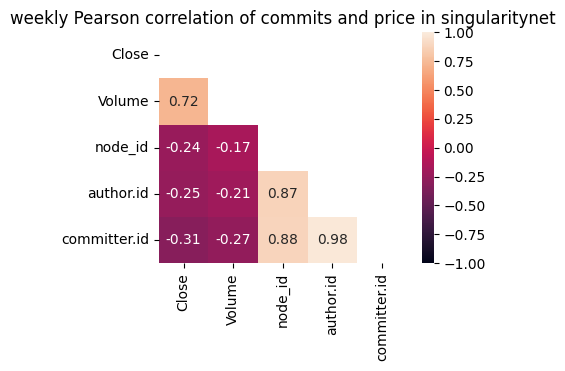

In [13]:
path = 'weekly_commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'node_id', 'author.id','committer.id']]
    heat_map(df, f'weekly Pearson correlation of commits and price in {name}')

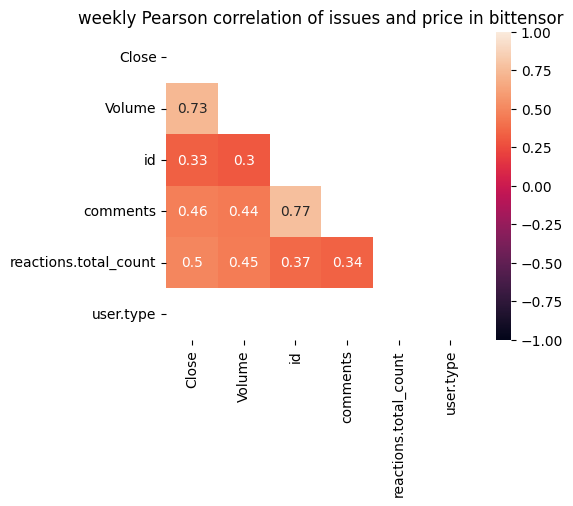

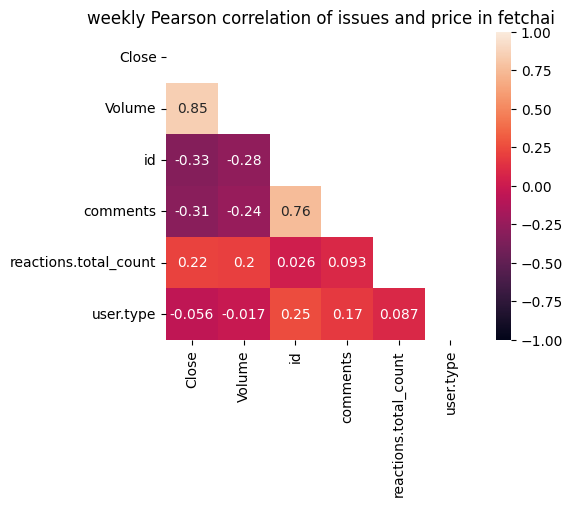

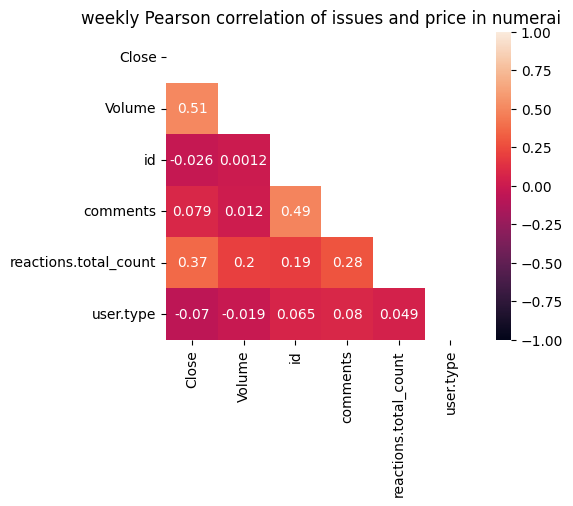

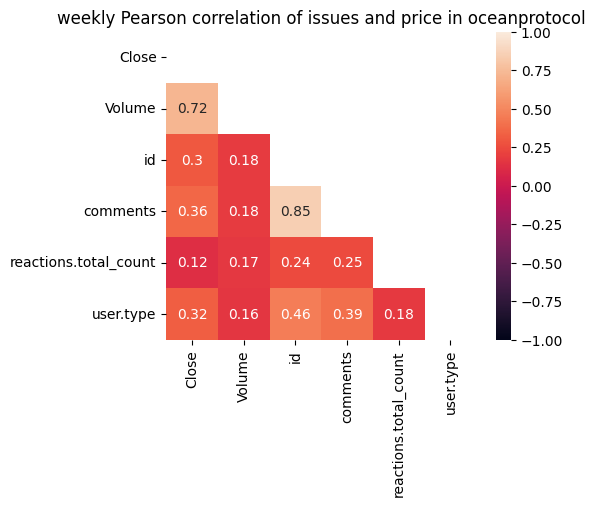

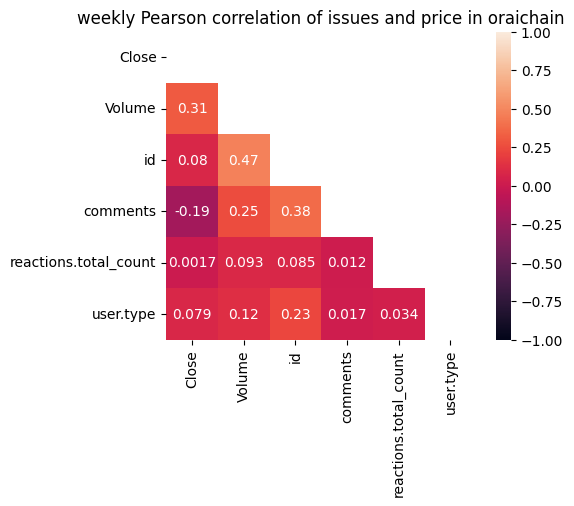

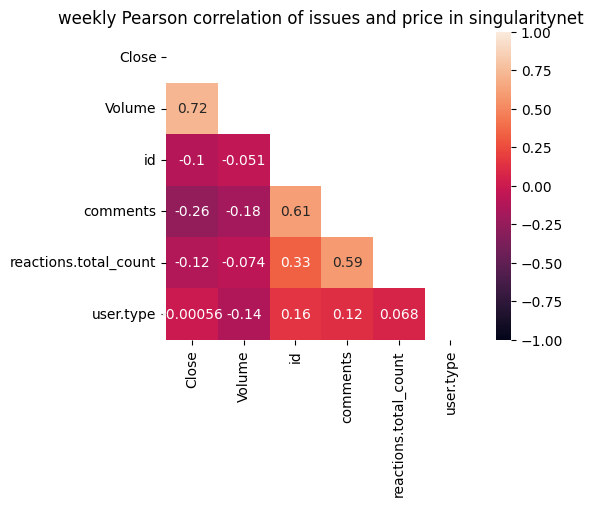

In [17]:
path = 'weekly_issueprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'id','comments','reactions.total_count', 'user.type']]
    heat_map(df, f'weekly Pearson correlation of issues and price in {name}')

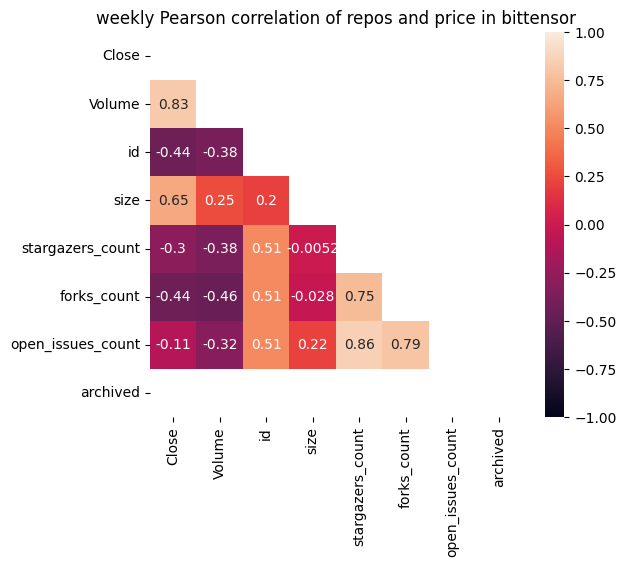

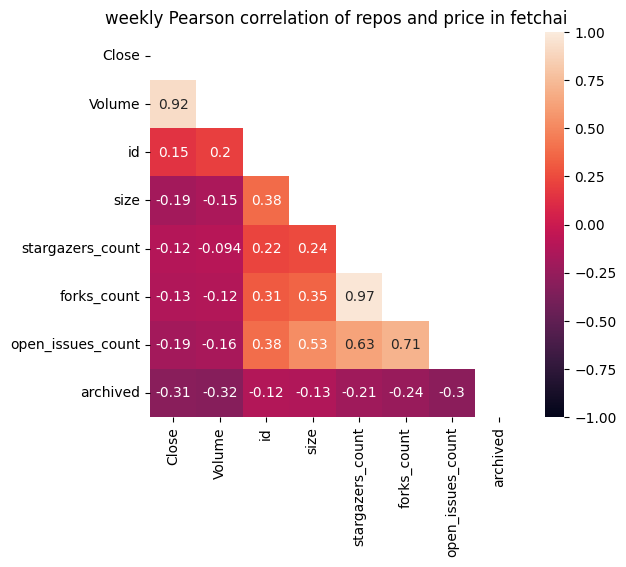

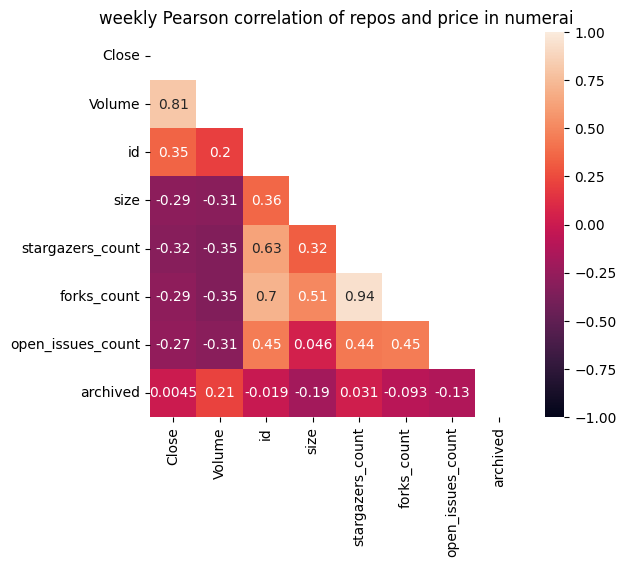

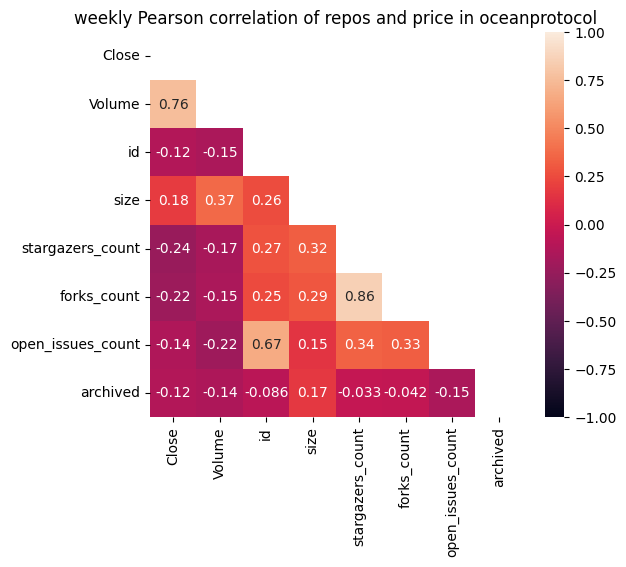

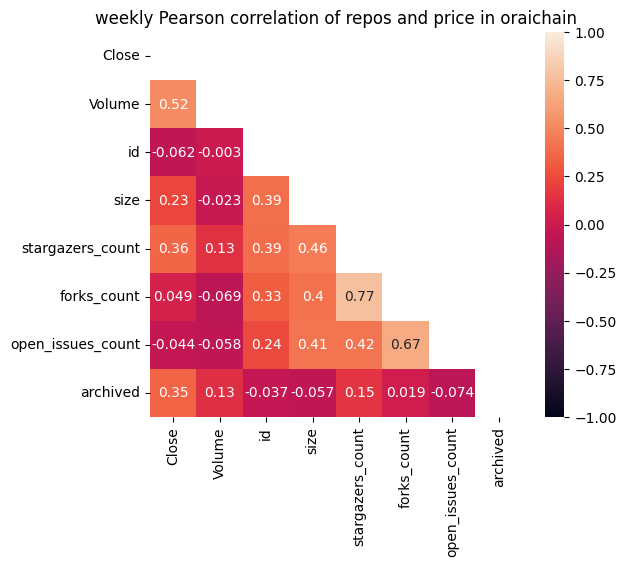

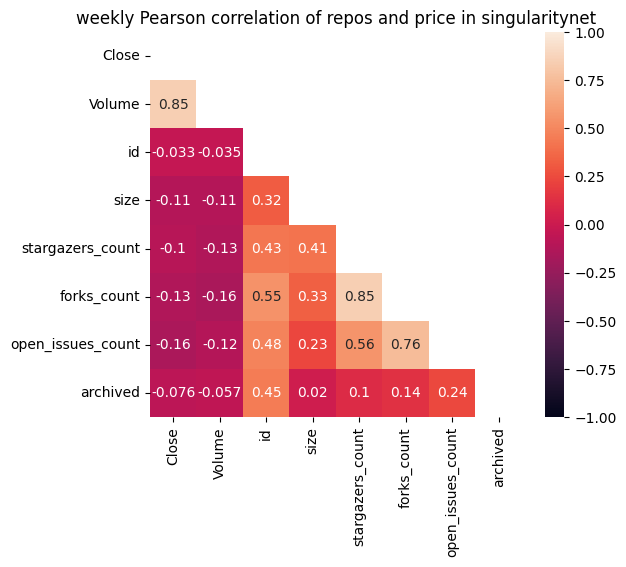

In [27]:
path = 'weekly_repoprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'id','size','stargazers_count','forks_count','open_issues_count','archived',]]
    heat_map(df, f'weekly Pearson correlation of repos and price in {name}')

#### monthly

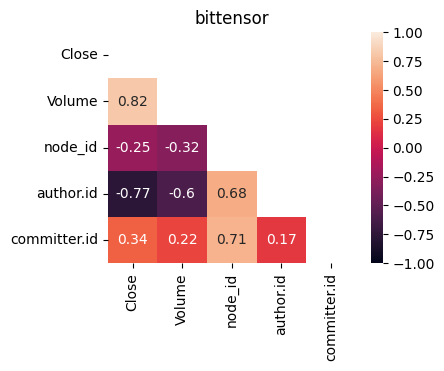

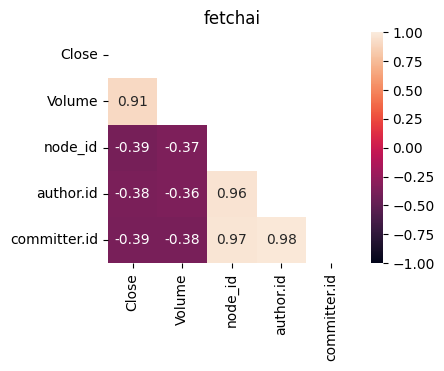

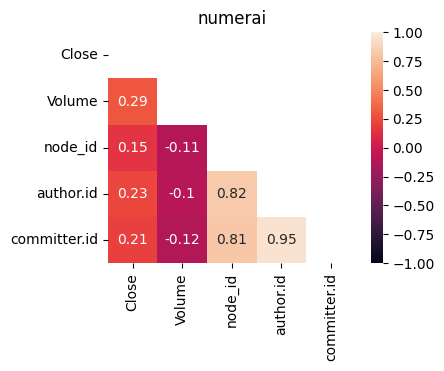

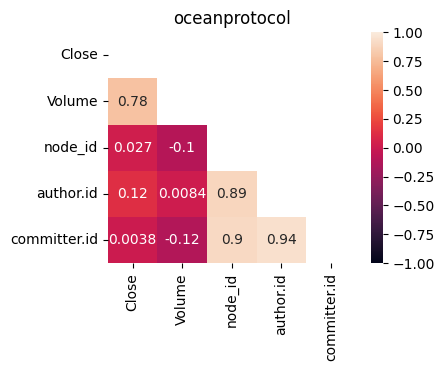

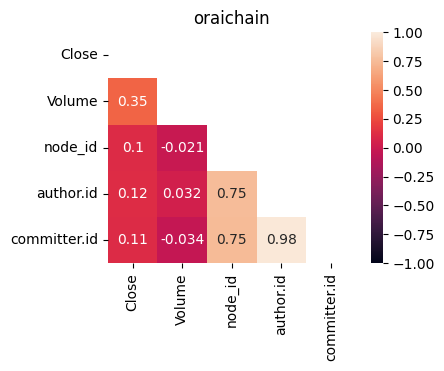

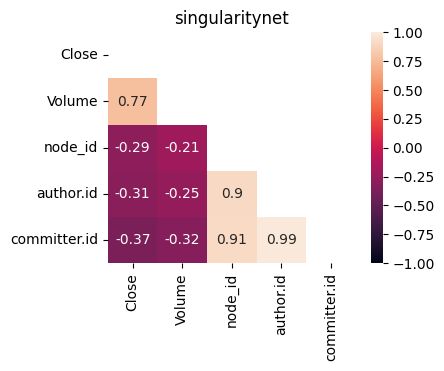

In [41]:
path = 'monthly_commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'node_id', 'author.id','committer.id']]
    heat_map(df, f'{name}')

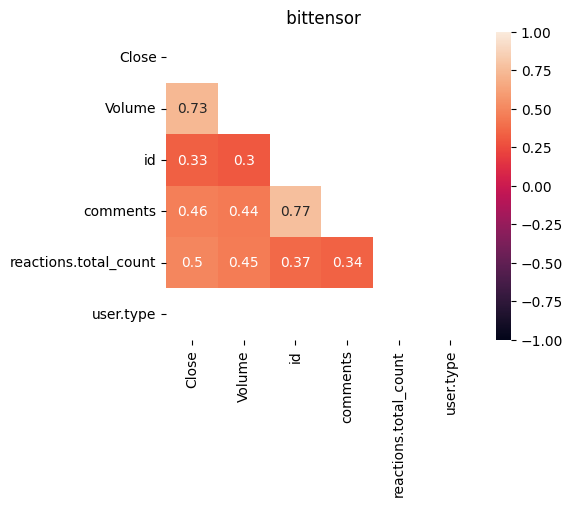

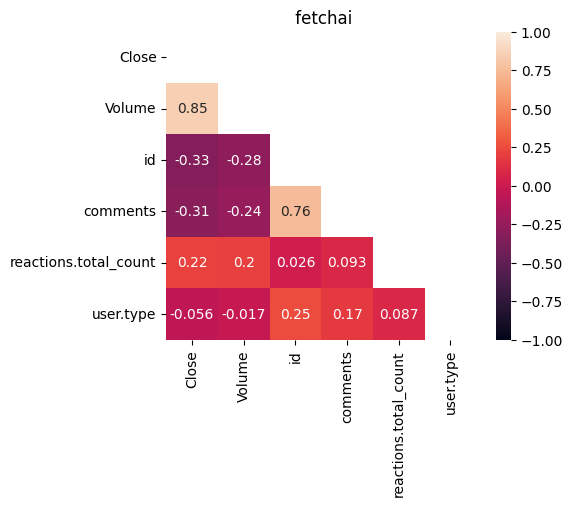

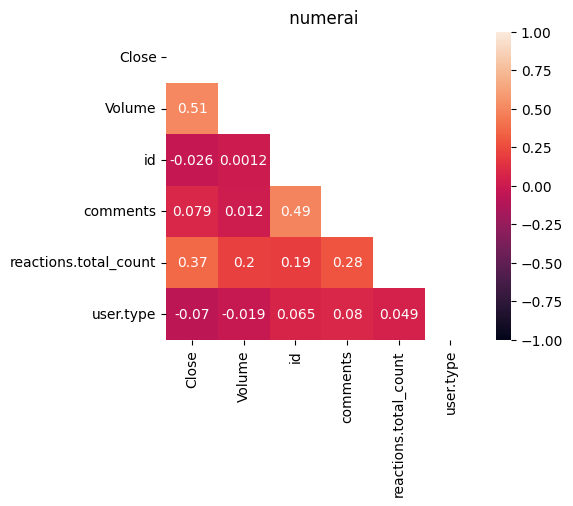

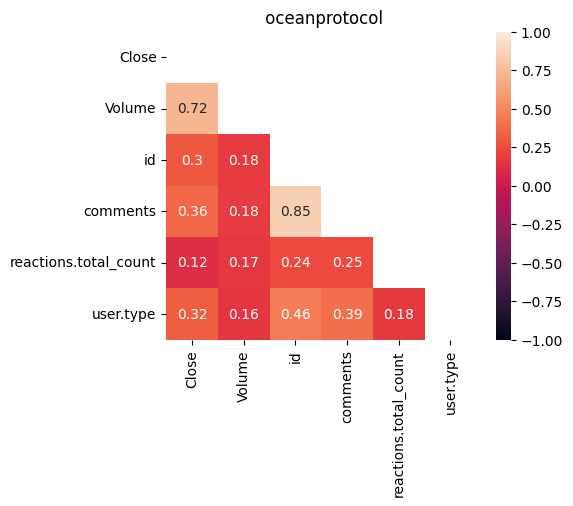

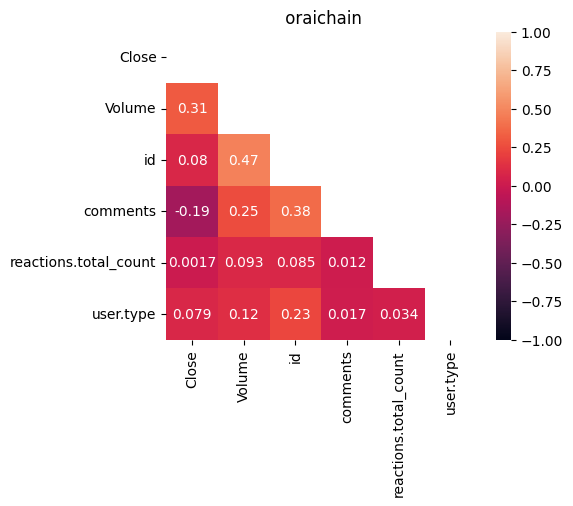

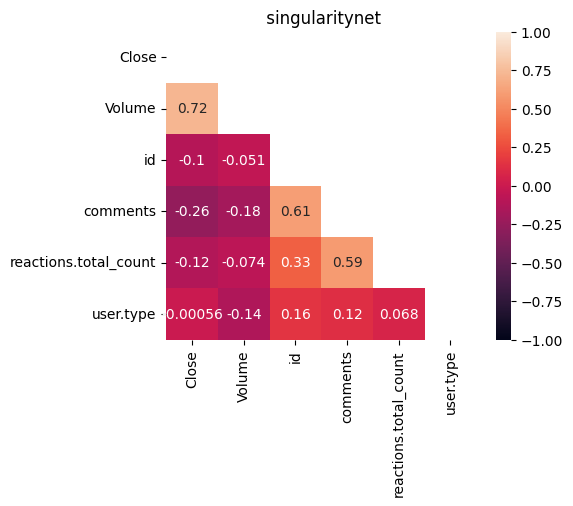

In [33]:
path = 'weekly_issueprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'id','comments','reactions.total_count', 'user.type']]
    heat_map(df, f' {name}')

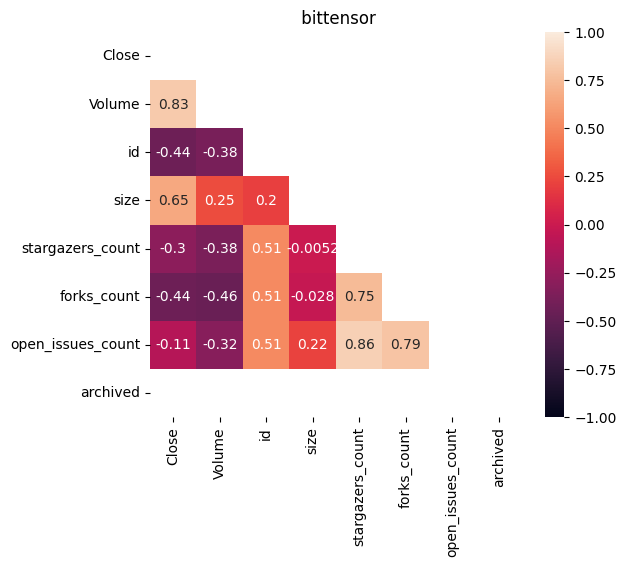

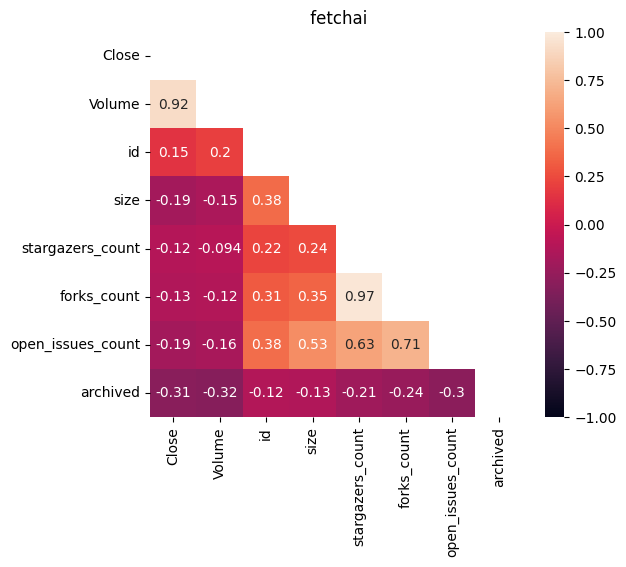

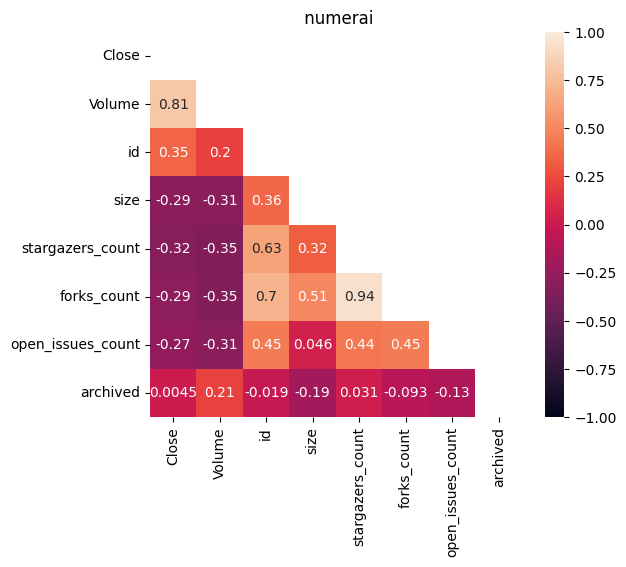

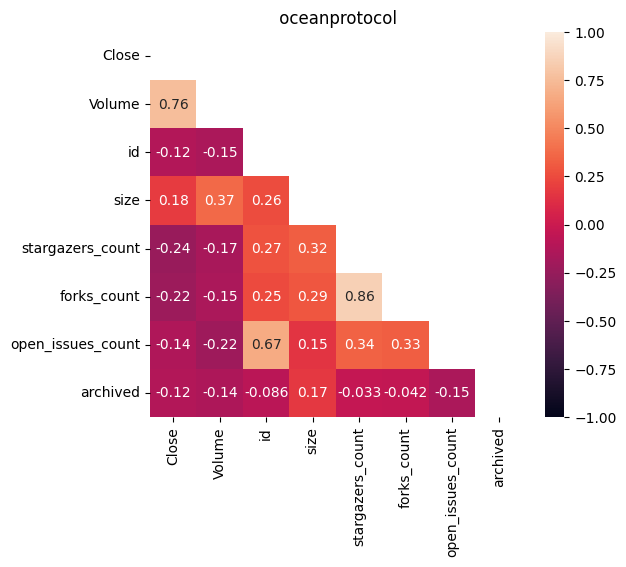

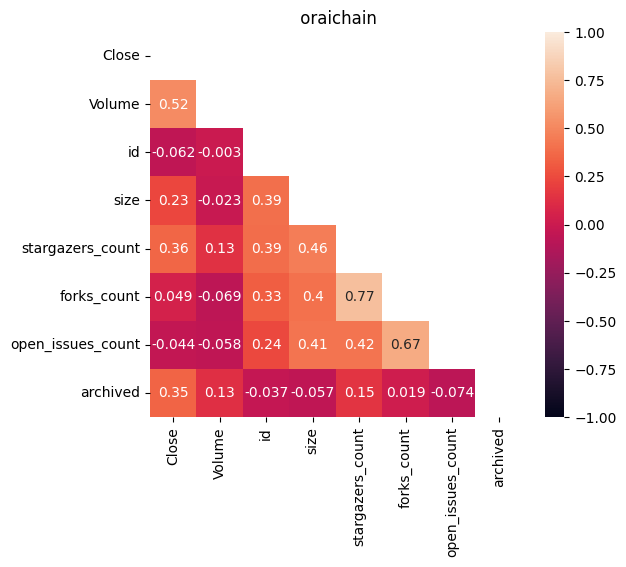

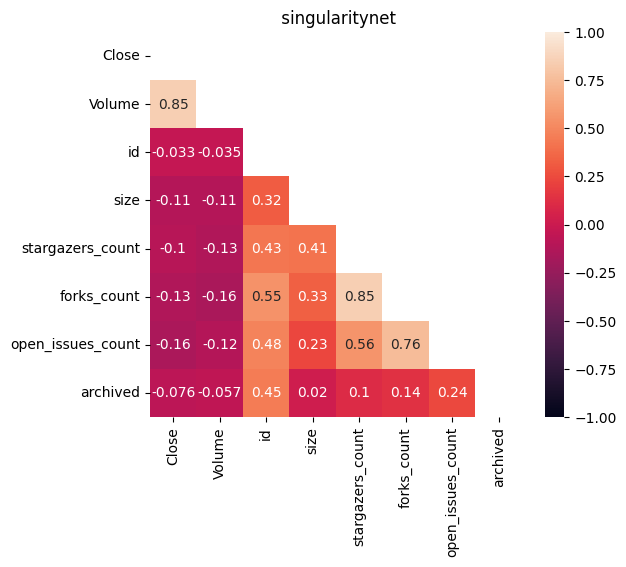

In [39]:
path = 'monthly_repoprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'id','size','stargazers_count','forks_count','open_issues_count','archived',]]
    heat_map(df, f' {name}')

#### Quarterly

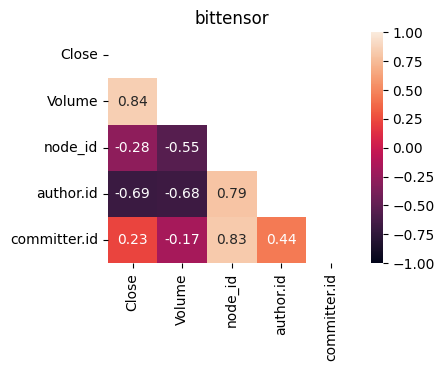

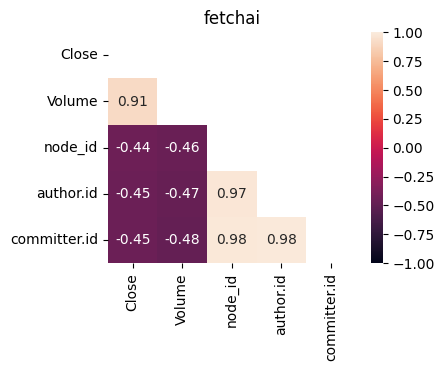

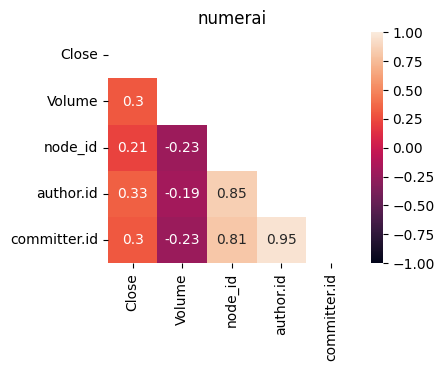

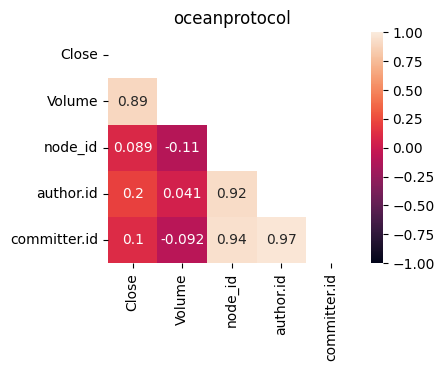

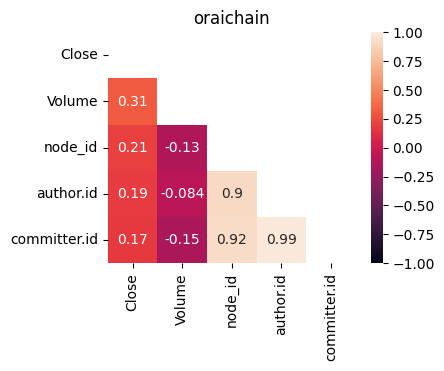

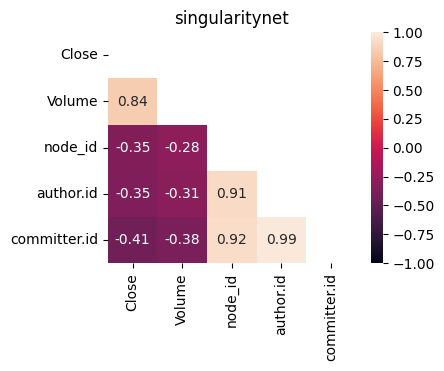

In [46]:
path = 'Quarterly_commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'node_id', 'author.id','committer.id']]
    heat_map(df, f'{name}')

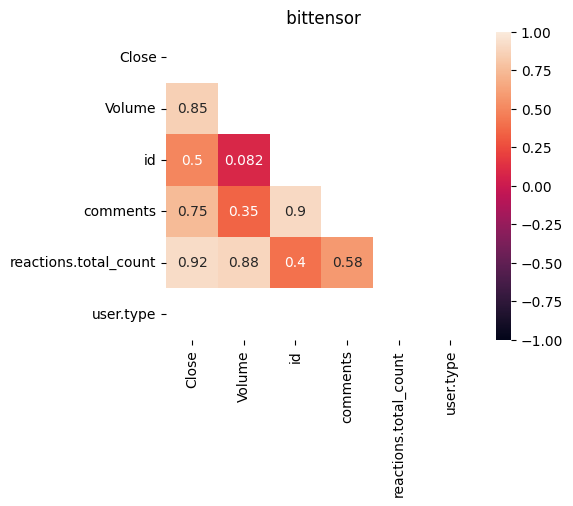

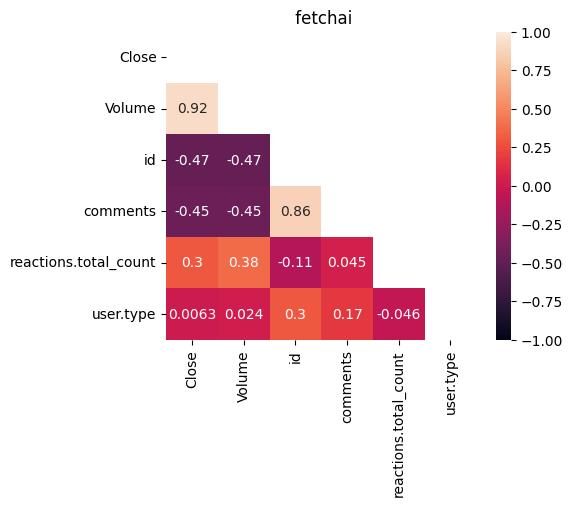

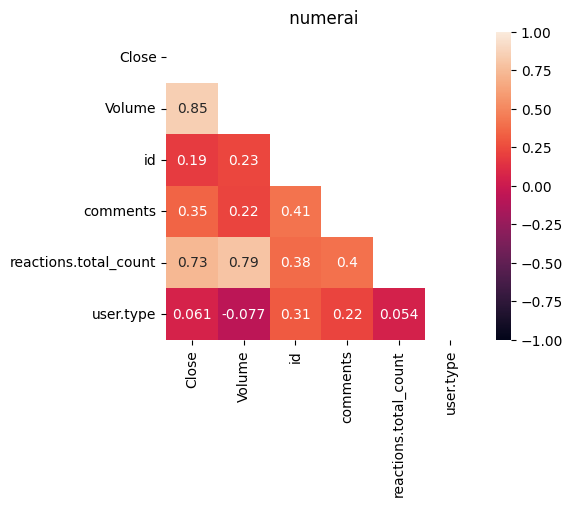

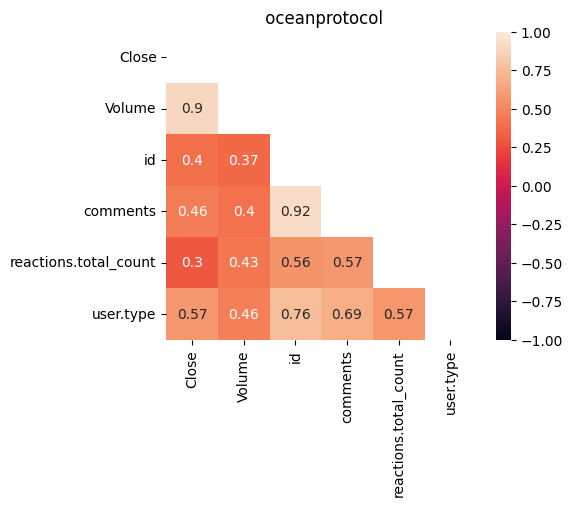

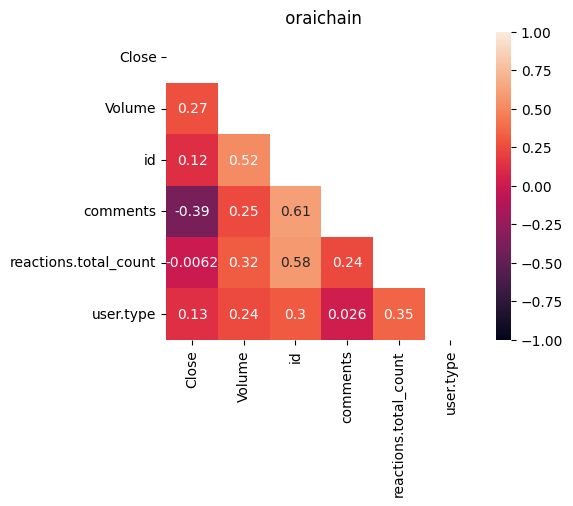

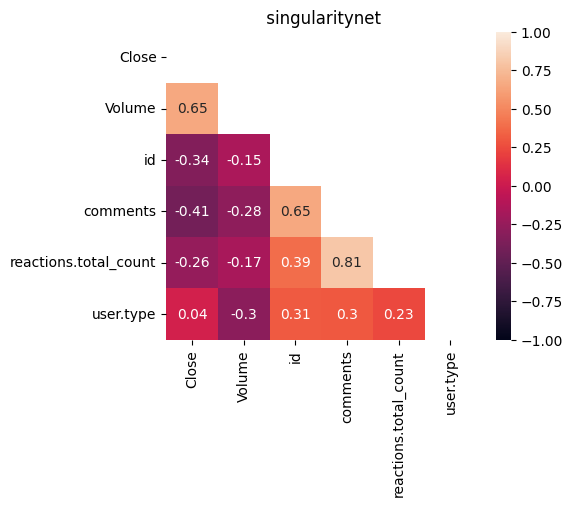

In [48]:
path = 'Quarterly_issueprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'id','comments','reactions.total_count', 'user.type']]
    heat_map(df, f' {name}')

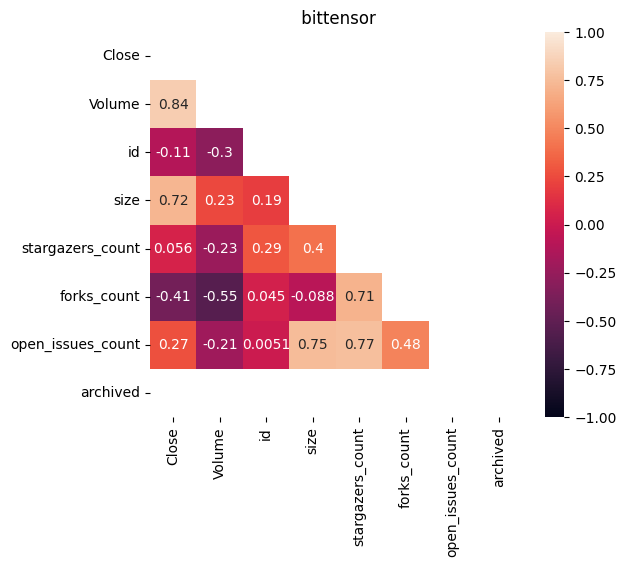

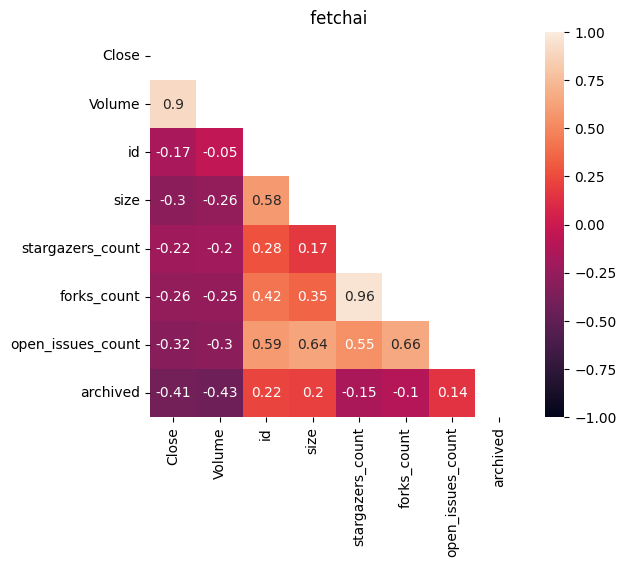

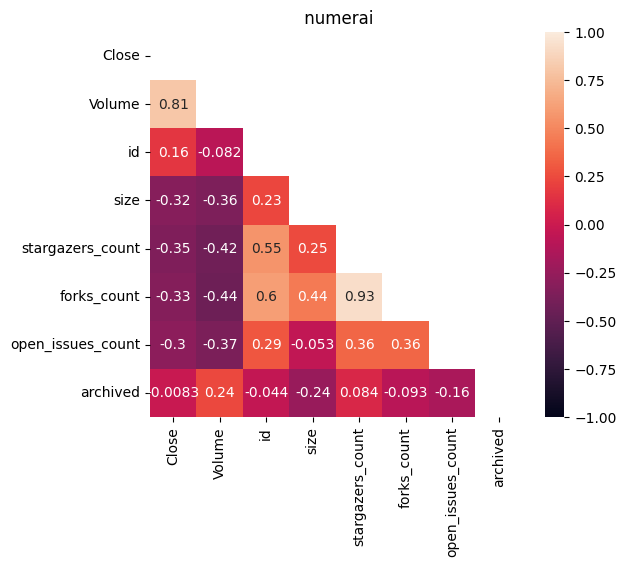

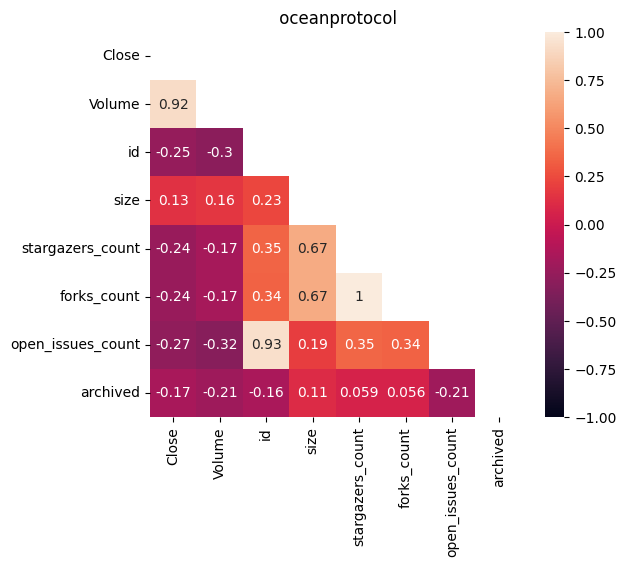

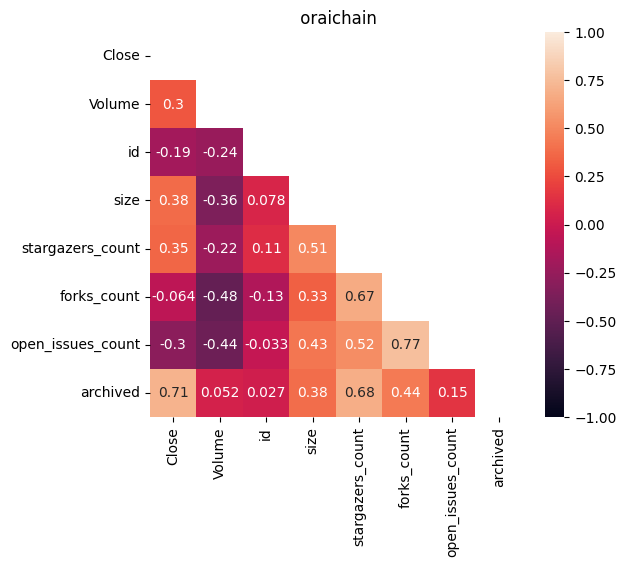

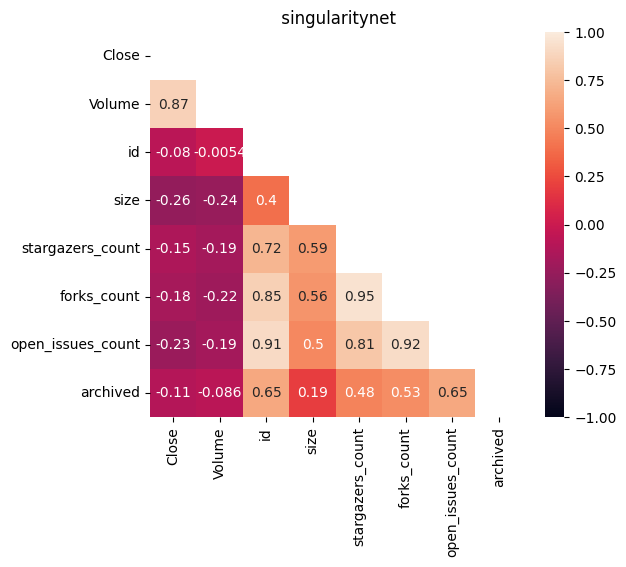

In [50]:
path = 'Quarterly_repoprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df[['Close', 'Volume', 'id','size','stargazers_count','forks_count','open_issues_count','archived',]]
    heat_map(df, f' {name}')

### Determine Time Lags for Maximum Correlations
10 points<br/>
Analyze different time lags between developer activity and token price to find the ones that maximize correlation. This will help identify any lagged effects between developer activity and token price movements.

In [51]:
import scipy.signal


path = 'weekly_commitprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
      name = data.split(".")[0]
      dataset=pd.read_csv(path  + data)
       # Find the time lag that maximizes the cross-correlation
      lags = np.arange(-50, 50, 1)
      ccf = scipy.signal.correlate(dataset[dataset.columns[-1]], dataset['Close'], mode='full')
      print(f'length {name} is:',len(dataset))
      # Find the lag that corresponds to the highest peak in the CCF
      lag = np.argmax(ccf)

      print(f'The best time lag for {name} is {lag}')


length bittensor is: 63
The best time lag for bittensor is 61
length fetchai is: 271
The best time lag for fetchai is 14
length numerai is: 340
The best time lag for numerai is 1
length oceanprotocol is: 262
The best time lag for oceanprotocol is 261
length oraichain is: 185
The best time lag for oraichain is 184
length singularitynet is: 326
The best time lag for singularitynet is 5


Maximum correlation of number of commits and bittensor_price: -0.04811739333661531
Corresponding lag: 3
Maximum correlation of number of commits and fetchai_price: -0.3530525661192553
Corresponding lag: 2
Maximum correlation of number of commits and numerai_price: 0.15776276728523803
Corresponding lag: 6
Maximum correlation of number of commits and oceanprotocol_price: 0.0643298516571309
Corresponding lag: 3
Maximum correlation of number of commits and oraichain_price: 0.07226455392281737
Corresponding lag: 0
Maximum correlation of number of commits and singularitynet_price: -0.22628363131611967
Corresponding lag: 2


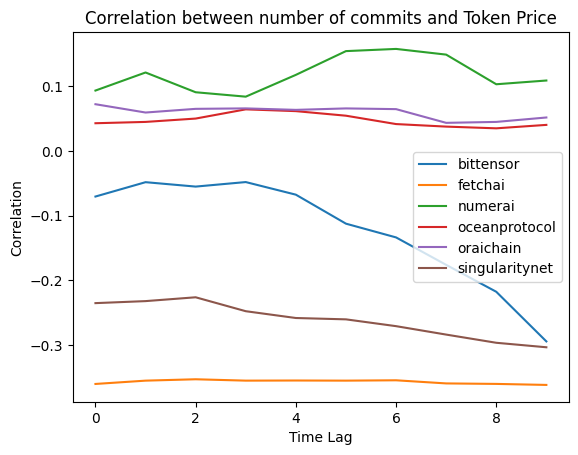

In [60]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_commitprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['node_id'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of commits and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of commits and Token Price')
plt.legend()
plt.show()

Maximum correlation of commit.comment_count and bittensor_price: 0.3926842720991453
Corresponding lag: 9
Maximum correlation of commit.comment_count and fetchai_price: -0.04126552153720453
Corresponding lag: 6
Maximum correlation of commit.comment_count and numerai_price: 0.10345701997536923
Corresponding lag: 8
Maximum correlation of commit.comment_count and oceanprotocol_price: 0.07955709950273923
Corresponding lag: 9
Maximum correlation of commit.comment_count and oraichain_price: 0.1965525656336408
Corresponding lag: 5
Maximum correlation of commit.comment_count and singularitynet_price: -0.011646843033309501
Corresponding lag: 0


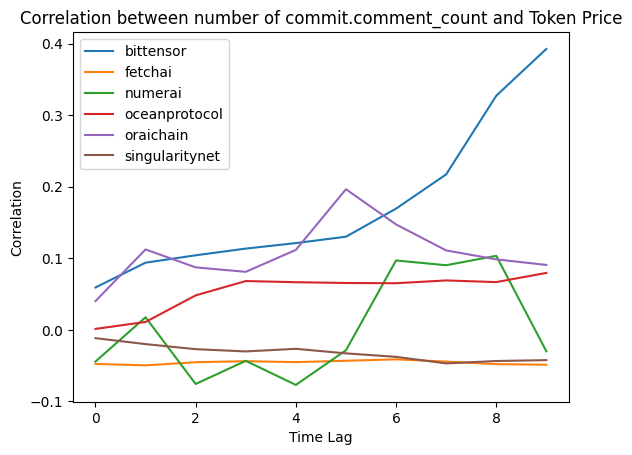

In [69]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_commitprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['commit.comment_count'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of commit.comment_count and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of commit.comment_count and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of authors and bittensor_price: -0.6391438478076044
Corresponding lag: 0
Maximum correlation of number of authors and fetchai_price: -0.3458252373632698
Corresponding lag: 1
Maximum correlation of number of authors and numerai_price: 0.2445087093149793
Corresponding lag: 5
Maximum correlation of number of authors and oceanprotocol_price: 0.15695143591369007
Corresponding lag: 3
Maximum correlation of number of authors and oraichain_price: 0.13714424280954038
Corresponding lag: 5
Maximum correlation of number of authors and singularitynet_price: -0.24134697085789628
Corresponding lag: 2


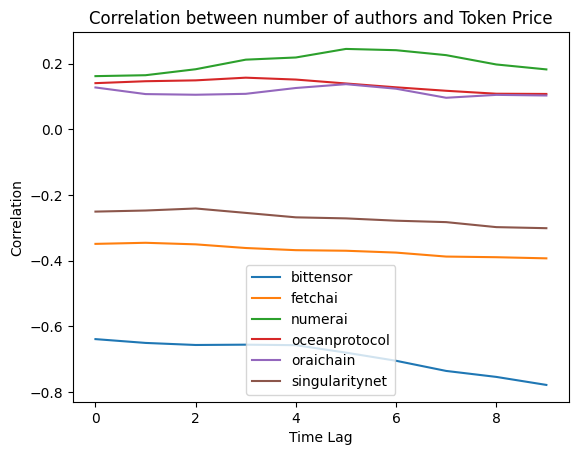

In [70]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_commitprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['author.id'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of authors and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of authors and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of committers and bittensor_price: 0.510819321566294
Corresponding lag: 1
Maximum correlation of number of committers and fetchai_price: -0.35781960102195043
Corresponding lag: 1
Maximum correlation of number of committers and numerai_price: 0.2564768633102417
Corresponding lag: 6
Maximum correlation of number of committers and oceanprotocol_price: 0.040641222507880714
Corresponding lag: 3
Maximum correlation of number of committers and oraichain_price: 0.13533805890274542
Corresponding lag: 5
Maximum correlation of number of committers and singularitynet_price: -0.3066581625120614
Corresponding lag: 2


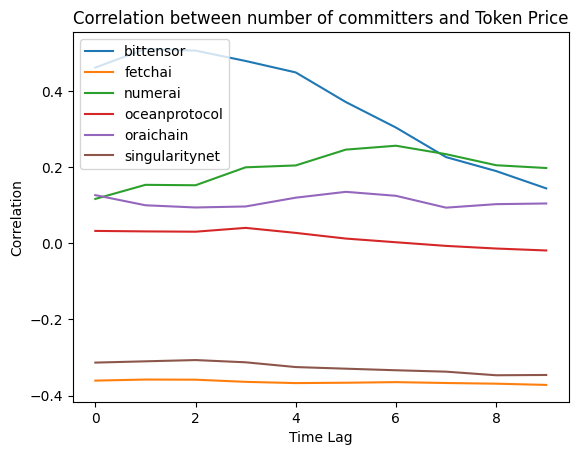

In [72]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_commitprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['committer.id'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of committers and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of committers and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of repos and bittensor_price: 0.11996105461866145
Corresponding lag: 5
Maximum correlation of number of repos and fetchai_price: 0.3015779141750333
Corresponding lag: 1
Maximum correlation of number of repos and numerai_price: 0.38978885290694476
Corresponding lag: 5
Maximum correlation of number of repos and oceanprotocol_price: -0.01824792648909131
Corresponding lag: 9
Maximum correlation of number of repos and oraichain_price: 0.06391777475290218
Corresponding lag: 9
Maximum correlation of number of repos and singularitynet_price: 0.053450032667568016
Corresponding lag: 3


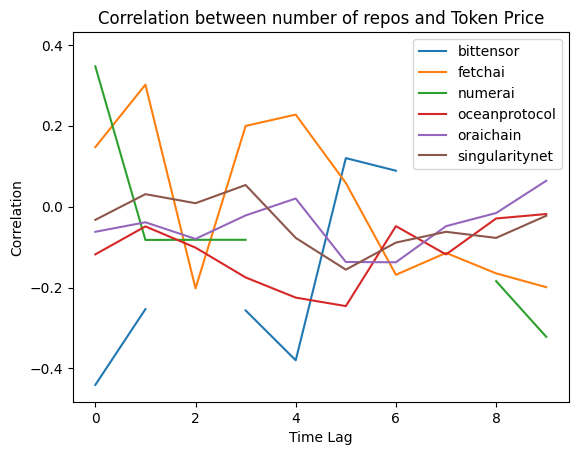

In [63]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_repoprice//'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['id'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of repos and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of repos and Token Price')
plt.legend()
plt.show()

Maximum correlation of size of repo and bittensor_price: 0.6491343863290477
Corresponding lag: 0
Maximum correlation of size of repo and fetchai_price: -0.06824835970144366
Corresponding lag: 1
Maximum correlation of size of repo and numerai_price: 0.38978885290694465
Corresponding lag: 5
Maximum correlation of size of repo and oceanprotocol_price: 0.18148352885597913
Corresponding lag: 0
Maximum correlation of size of repo and oraichain_price: 0.3468561979212918
Corresponding lag: 4
Maximum correlation of size of repo and singularitynet_price: -0.006032621447479753
Corresponding lag: 3


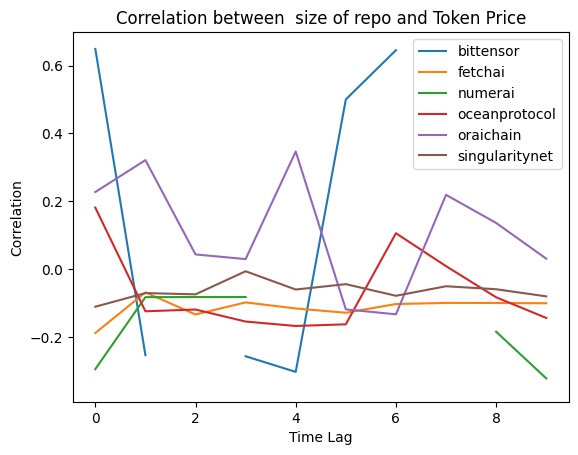

In [64]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_repoprice//'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['size'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of size of repo and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between  size of repo and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of forks and bittensor_price: 0.6245945913254526
Corresponding lag: 6
Maximum correlation of number of forks and fetchai_price: -0.03760318330996093
Corresponding lag: 1
Maximum correlation of number of forks and numerai_price: 0.3897888529069448
Corresponding lag: 5
Maximum correlation of number of forks and oceanprotocol_price: -0.030083232476704677
Corresponding lag: 2
Maximum correlation of number of forks and oraichain_price: 0.11022698462461414
Corresponding lag: 7
Maximum correlation of number of forks and singularitynet_price: -0.08414957722668619
Corresponding lag: 3


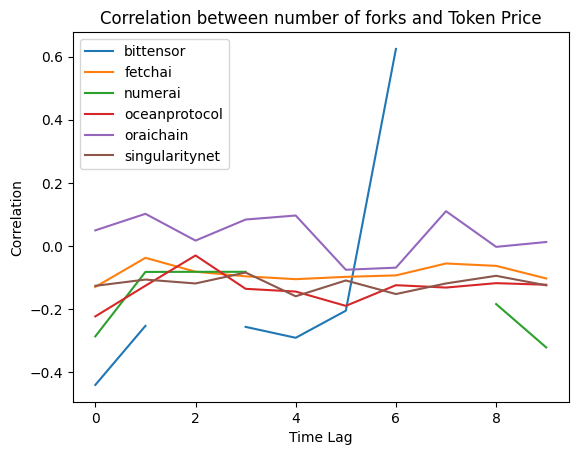

In [65]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_repoprice//'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['forks_count'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of forks and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of forks and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of issues and bittensor_price: 0.34668064041054
Corresponding lag: 1
Maximum correlation of number of issues and fetchai_price: -0.3300554772415265
Corresponding lag: 1
Maximum correlation of number of issues and numerai_price: 0.1468927868795481
Corresponding lag: 4
Maximum correlation of number of issues and oceanprotocol_price: 0.3138641567397095
Corresponding lag: 2
Maximum correlation of number of issues and oraichain_price: 0.18379785566043705
Corresponding lag: 9
Maximum correlation of number of issues and singularitynet_price: -0.08660336169063408
Corresponding lag: 2


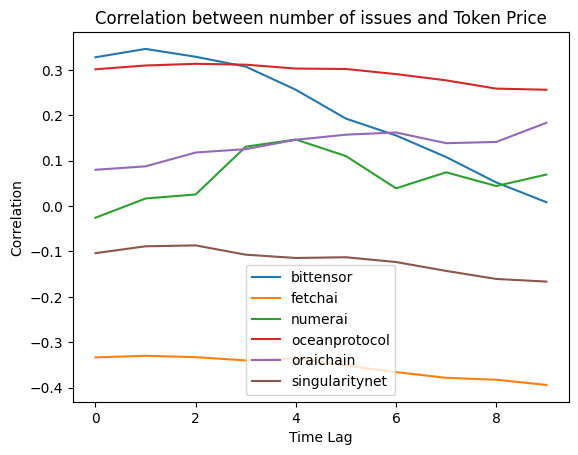

In [66]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_issueprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['id'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of issues and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of issues and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of issues comments and bittensor_price: 0.4616811540515976
Corresponding lag: 0
Maximum correlation of number of issues comments and fetchai_price: -0.30593994409638897
Corresponding lag: 1
Maximum correlation of number of issues comments and numerai_price: 0.2071054054870434
Corresponding lag: 4
Maximum correlation of number of issues comments and oceanprotocol_price: 0.39937690941898163
Corresponding lag: 5
Maximum correlation of number of issues comments and oraichain_price: -0.18839470356024907
Corresponding lag: 6
Maximum correlation of number of issues comments and singularitynet_price: -0.23883853865856744
Corresponding lag: 9


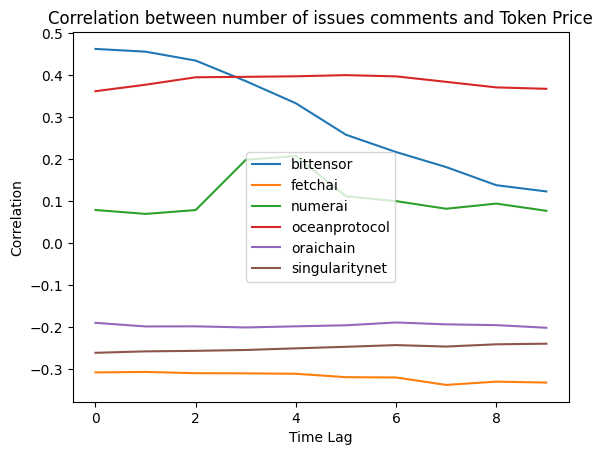

In [67]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_issueprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['comments'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of issues comments and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of issues comments and Token Price')
plt.legend()
plt.show()

Maximum correlation of number of total reaction count and bittensor_price: 0.49914709366019444
Corresponding lag: 0
Maximum correlation of number of total reaction count and fetchai_price: 0.2231610405849454
Corresponding lag: 2
Maximum correlation of number of total reaction count and numerai_price: 0.3707358162640987
Corresponding lag: 0
Maximum correlation of number of total reaction count and oceanprotocol_price: 0.23926029053022152
Corresponding lag: 9
Maximum correlation of number of total reaction count and oraichain_price: 0.03301503622603851
Corresponding lag: 8
Maximum correlation of number of total reaction count and singularitynet_price: -0.11277710998522202
Corresponding lag: 6


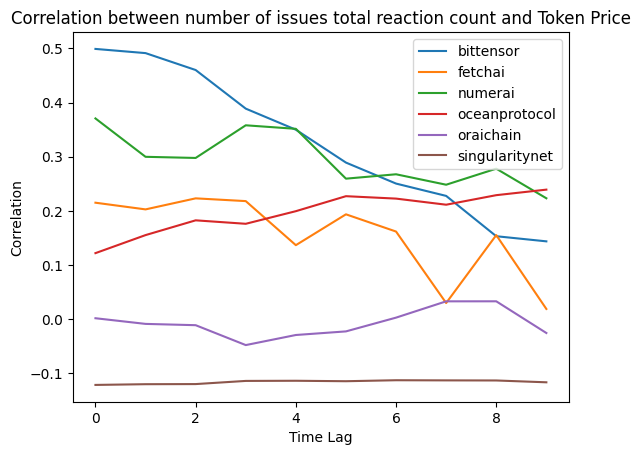

In [68]:
lags = range(0, 10)  # Specify the range of time lags to test
path = 'weekly_issueprice/'
for data in os.listdir(path):
    if os.path.isfile(os.path.join(path, data)):
        name = data.split(".")[0]
        df=pd.read_csv(path  + data)
        correlations = []
        for lag in lags:
            activity_shifted = df['reactions.total_count'].shift(lag)
            correlation = df['Close'].corr(activity_shifted)
            correlations.append(correlation)

        # Find the maximum correlation and its corresponding lag
        max_correlation = max(correlations)
        max_lag = lags[correlations.index(max_correlation)]

        print(f"Maximum correlation of number of total reaction count and {name}_price:", max_correlation)
        print("Corresponding lag:", max_lag)
    plt.plot(lags, correlations, label=name)
    plt.xlabel('Time Lag')
    plt.ylabel('Correlation')
    plt.title(f'Correlation between number of issues total reaction count and Token Price')
plt.legend()
plt.show()

### Additional Data to Improve Analysis
10 points<br/>
Find and incorporate data on social media activity related to the project, or data on partnerships and collaborations to add another layer of insights to your analysis.

##### corr between price and trends

In [135]:
# os.mkdir('merged_price_trend_weekly')

path = 'trends/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    
    df = pd.read_csv(path + full_name,  skiprows=1)
    df['Week'] = pd.to_datetime(df['Week'])
    df['Date'] = df['Week']
    df.set_index('Date', inplace=True)
    df=df.drop(columns=['Week'])
    df.rename(columns={df.columns[-1]: 'trends'}, inplace=True)


    price = pd.read_csv('prices/' + name+'_token_price.csv')
    price['Date'] = pd.to_datetime(price['Date'])

    price = price.set_index('Date')

    price = price.resample('W').mean()
    price = price.reset_index()
    merged_data = pd.merge(price,df , left_on='Date', right_index=True, how='inner')

    merged_data.to_csv('merged_price_trend_weekly/'+name+'.csv')

In [136]:
tp = {}
path = 'merged_price_trend_weekly/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path + full_name)
    tp.update({name:df})
    print(df.shape)

(63, 9)
(262, 9)
(260, 9)
(257, 9)
(185, 9)
(262, 9)


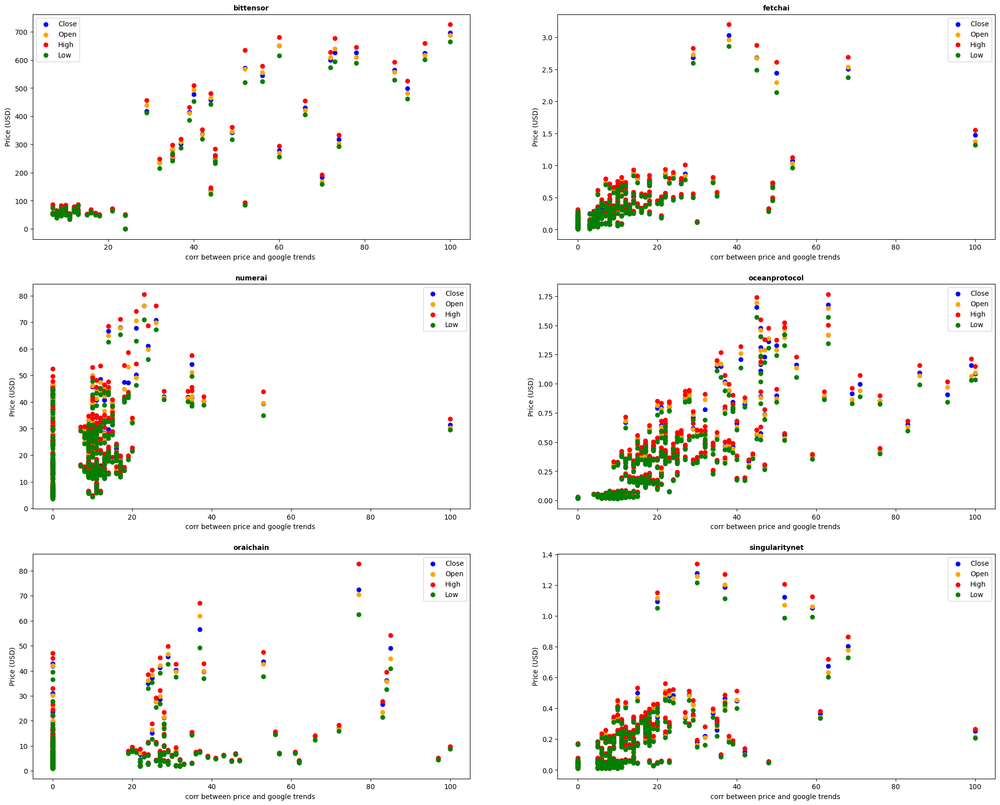

In [137]:
pair_list = list(tp.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
# for (i, ax) in  enumerate(axes.flatten()):
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = tp[c]
    ax.scatter(df['trends'], df['Close'], label='Close', c=color_list[0])
    ax.scatter(df['trends'], df['Open'], label='Open', c=color_list[1])
    ax.scatter(df['trends'], df['High'], label='High', c=color_list[2])
    ax.scatter(df['trends'], df['Low'], label='Low', c=color_list[3])
    # ax.scatter(df['trends'], df['Volume'], label='Volume', c=color_list[4])

    ax.set_title(f'{c}', fontsize=10, fontweight='bold')  # Customize title as needed
    ax.set_xlabel('corr between price and google trends ')
    ax.set_ylabel('Price (USD)')
    ax.legend()


##### correlation between google trends and github developer activity

In [152]:
os.mkdir('repos_trend')

path = 'trends/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    
    df = pd.read_csv(path + full_name,  skiprows=1)
    df['Week'] = pd.to_datetime(df['Week'])
    df['Date'] = df['Week']
    df.set_index('Date', inplace=True)
    df=df.drop(columns=['Week'])
    df.rename(columns={df.columns[-1]: 'trends'}, inplace=True)


    github = pd.read_csv('remove_equal_columns_repo/' + name+'.csv')
    github['Date'] = pd.to_datetime(github['Date'])

    github = github.set_index('Date')

    github = github.resample('W').mean()
    github = github.reset_index()
    github = github[['Date','id','size','stargazers_count','forks_count','open_issues_count']]
    merged_data = pd.merge(github,df , left_on='Date', right_index=True, how='inner')

    merged_data.to_csv('repos_trend/'+name+'.csv')

In [159]:
tc = {}
path = 'commits_trend/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path + full_name)
    tc.update({name:df})
    print(df.shape)

(63, 9)
(262, 9)
(260, 9)
(257, 9)
(185, 9)
(262, 9)


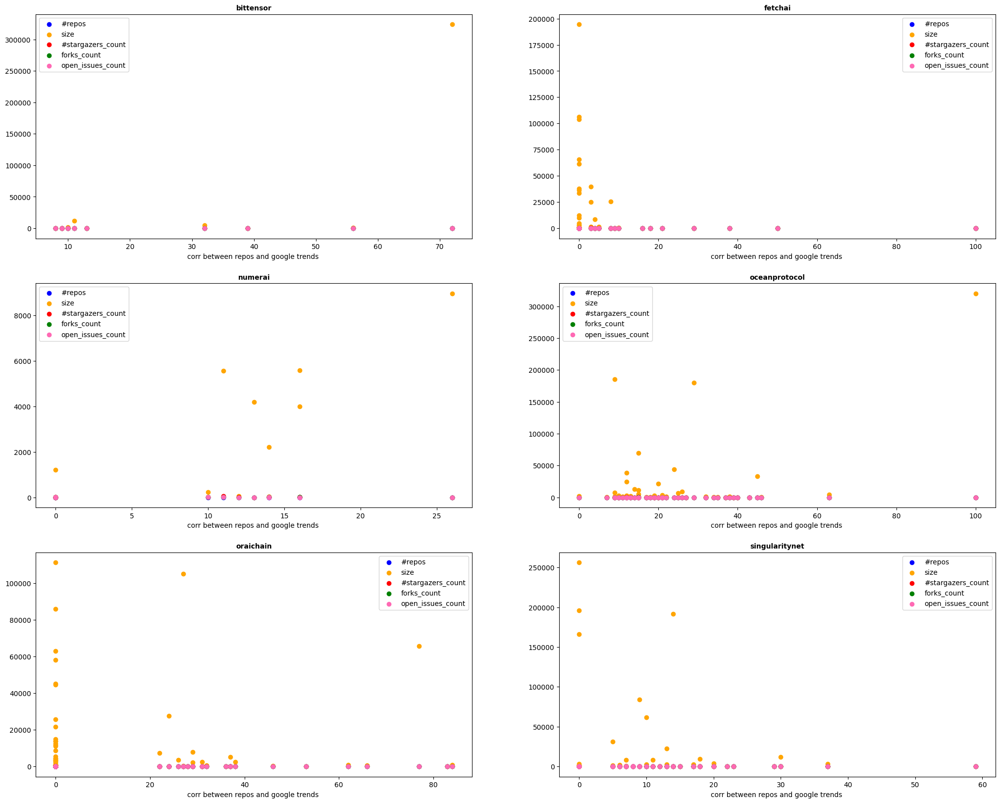

In [156]:
pair_list = list(tr.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
# for (i, ax) in  enumerate(axes.flatten()):
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = tr[c]
    ax.scatter(df['trends'], df['id'], label='#repos', c=color_list[0])
    ax.scatter(df['trends'], df['size'], label='size', c=color_list[1])
    ax.scatter(df['trends'], df['stargazers_count'], label='#stargazers_count', c=color_list[2])
    ax.scatter(df['trends'], df['forks_count'], label='forks_count', c=color_list[3])
    ax.scatter(df['trends'], df['open_issues_count'], label='open_issues_count', c=color_list[4])

    # ax.scatter(df['trends'], df['Volume'], label='Volume', c=color_list[4])

    ax.set_title(f'{c}', fontsize=10, fontweight='bold')  # Customize title as needed
    ax.set_xlabel('corr between repos and google trends ')
    ax.legend()


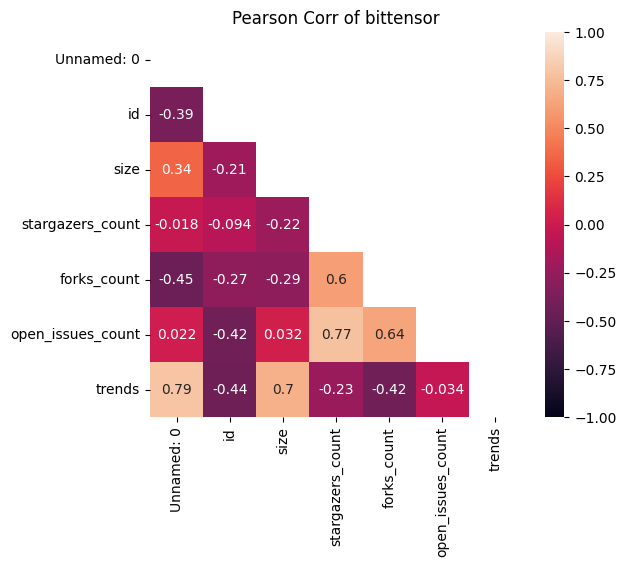

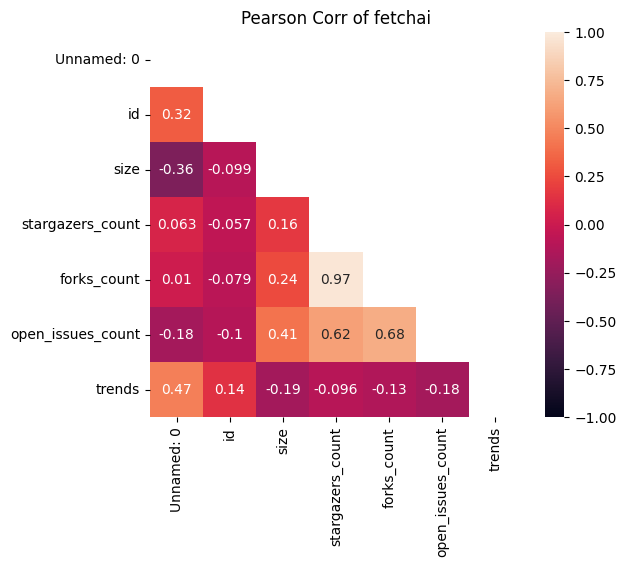

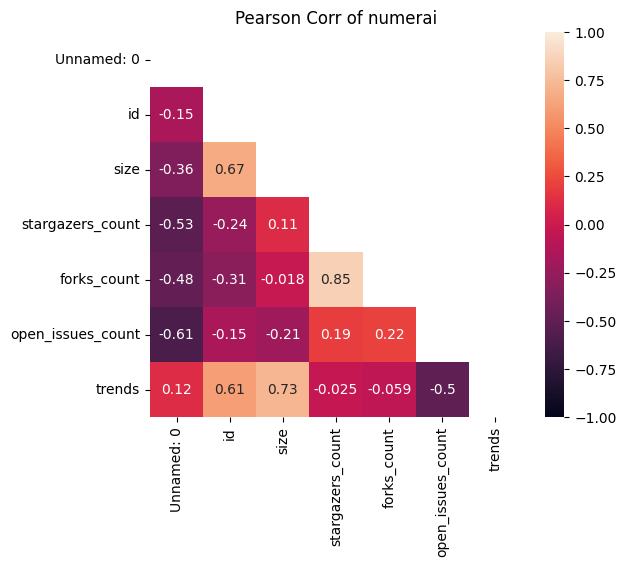

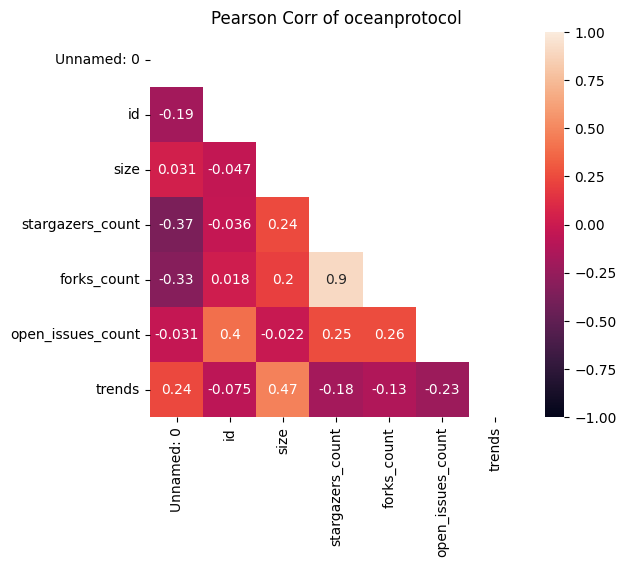

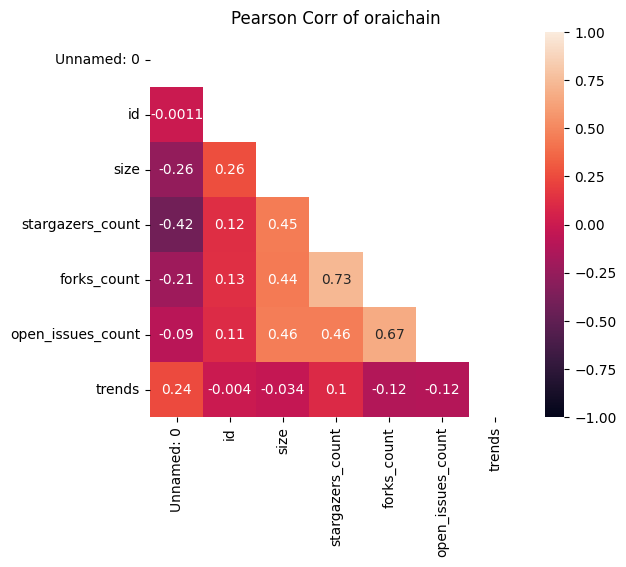

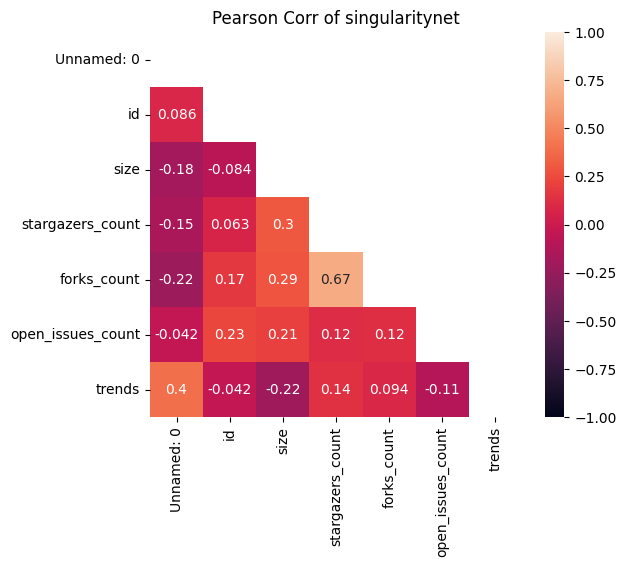

In [164]:
path = 'repos_trend//'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path + full_name)
    df.drop(columns=['Date'], inplace=True)
    heat_map(df, f'Pearson Corr of {name}')

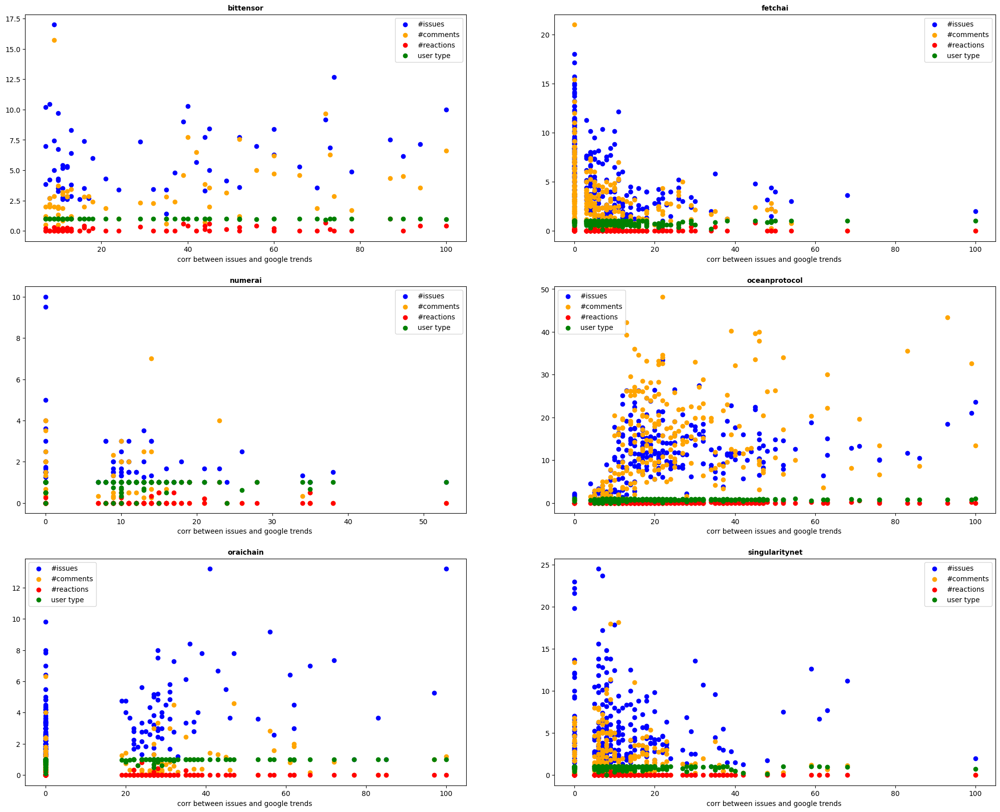

In [157]:
pair_list = list(ti.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
# for (i, ax) in  enumerate(axes.flatten()):
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = ti[c]
    ax.scatter(df['trends'], df['id'], label='#issues', c=color_list[0])
    ax.scatter(df['trends'], df['comments'], label='#comments', c=color_list[1])
    ax.scatter(df['trends'], df['reactions.total_count'], label='#reactions', c=color_list[2])
    ax.scatter(df['trends'], df['user.type'], label='user type', c=color_list[3])

    # ax.scatter(df['trends'], df['Volume'], label='Volume', c=color_list[4])

    ax.set_title(f'{c}', fontsize=10, fontweight='bold')  # Customize title as needed
    ax.set_xlabel('corr between issues and google trends ')
    ax.legend()


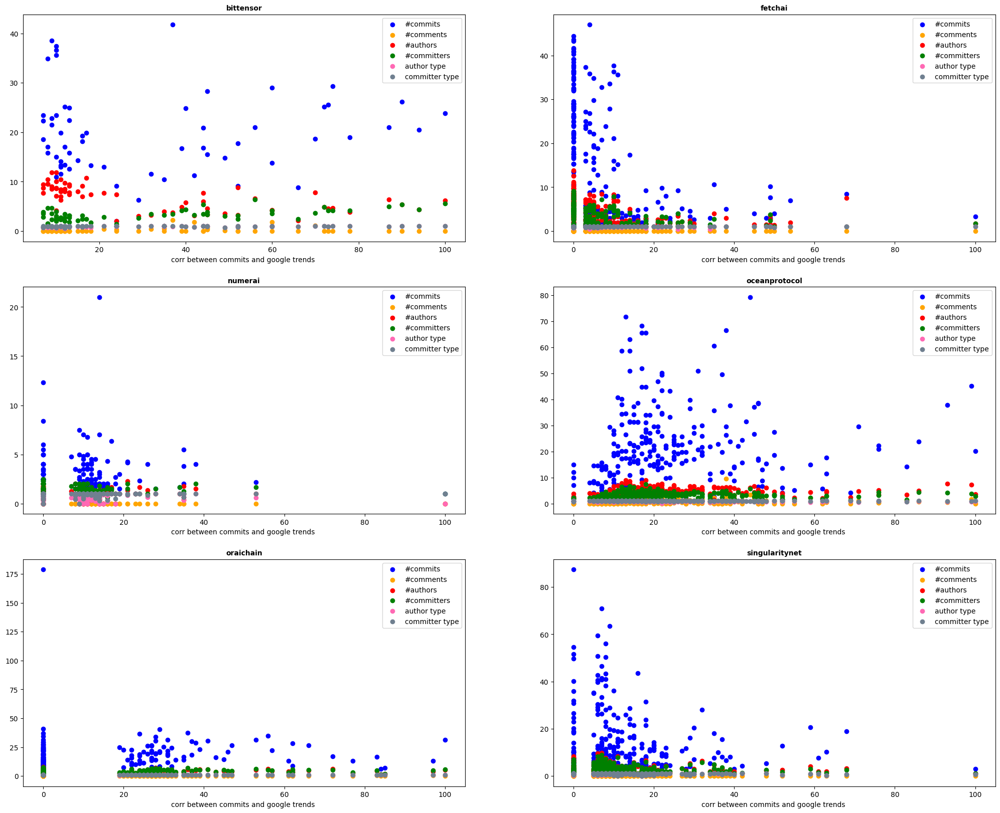

In [161]:
pair_list = list(tc.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
# for (i, ax) in  enumerate(axes.flatten()):
for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    df = tc[c]
    ax.scatter(df['trends'], df['node_id'], label='#commits', c=color_list[0])
    ax.scatter(df['trends'], df['commit.comment_count'], label='#comments', c=color_list[1])
    ax.scatter(df['trends'], df['author.id'], label='#authors', c=color_list[2])
    ax.scatter(df['trends'], df['committer.id'], label='#committers', c=color_list[3])
    ax.scatter(df['trends'], df['author.type'], label='author type', c=color_list[4])
    ax.scatter(df['trends'], df['committer.type'], label='committer type', c=color_list[5])
    # ax.scatter(df['trends'], df['Volume'], label='Volume', c=color_list[4])

    ax.set_title(f'{c}', fontsize=10, fontweight='bold')  # Customize title as needed
    ax.set_xlabel('corr between commits and google trends ')
    ax.legend()


In [106]:
!pip install numerapi

from numerapi import NumerAPI
napi = NumerAPI()
datasets = napi.list_datasets()

ERROR: Could not install packages due to an OSError: [WinError 2] The system cannot find the file specified: 'C:\\Python311\\Scripts\\numerapi.exe' -> 'C:\\Python311\\Scripts\\numerapi.exe.deleteme'


[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached numerapi-2.18.0-py3-none-any.whl (27 kB)
  Using cached requests-2.32.2-py3-none-any.whl (63 kB)
  Using cached click-8.1.7-py3-none-any.whl (97 kB)
  Using cached certifi-2024.2.2-py3-none-any.whl (163 kB)


In [132]:
datasets[3]

'v4.1/live_example_preds.parquet'

### groupby week , month, 2weeks

In [42]:
os.makedirs('Quarterly_commitprice')
path = 'remove_equal_columns_commit/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    # type = name.split('_')[1]
    df = pd.read_csv(path+full_name)
    print(full_name)
    df = df[df['Date'] != '0']
    df['Date'] = pd.to_datetime(df['Date'])
    # df['Date'] = df['Date'].dt.date
    dict = {
        'Open': 'mean',
        'Close':'mean',
        'High':'mean',
        'Low':'mean',
        'Volume':'mean',
        'node_id': 'sum',
        'commit.comment_count': 'sum',
        'author.id': 'sum',
        'committer.id':'sum',
        'author.type': lambda x: (x != 0).sum() / len(x),
        'committer.type': lambda x: (x != 0).sum() / len(x)
    }
    existing_keys = [key for key in dict.keys() if key in df.columns]
    subdic = {key: dict[key] for key in existing_keys}
    weekly = df.resample('3M', on='Date').agg(subdic,dropna=False).reset_index()
    weekly.to_csv('Quarterly_commitprice/'+full_name, index=False)


bittensor.csv
fetchai.csv
numerai.csv
oceanprotocol.csv
oraichain.csv
singularitynet.csv


In [43]:
os.makedirs('Quarterly_issueprice')
path = 'remove_equal_columns_issue/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    print(full_name)
    df = df[df['Date'] != '0']
    df['Date'] = pd.to_datetime(df['Date'])
    dict = {
        'Open': 'mean',
        'Close':'mean',
        'High':'mean',
        'Low':'mean',
        'Volume':'mean',
        'id': 'sum',
        'comments':'sum',
        'reactions.total_count':'sum',
        'reactions.+1': 'sum',
        'reactions.-1': 'sum',
        'reactions.confused': 'sum',
        'reactions.heart' :'sum',
        'reactions.rocket' :'sum',
        'reactions.eyes':'sum',
        'reactions.laugh':'sum',
        'reactions.hooray':'sum',
        'user.type': lambda x: (x != 0).sum() / len(x),
    }
    existing_keys = [key for key in dict.keys() if key in df.columns]
    subdic = {key: dict[key] for key in existing_keys}
    weekly = df.resample('3M', on='Date').agg(subdic,dropna=False).reset_index()

    weekly.to_csv('Quarterly_issueprice/'+full_name, index=False)


bittensor.csv
fetchai.csv
numerai.csv
oceanprotocol.csv
oraichain.csv
singularitynet.csv


In [44]:
os.makedirs('Quarterly_repoprice')
path = 'remove_equal_columns_repo/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    print(full_name)
    df = df[df['Date'] != '0']
    df['Date'] = pd.to_datetime(df['Date'])
    dict = {
        'Open': 'mean',
        'Close':'mean',
        'High':'mean',
        'Low':'mean',
        'Volume':'mean',
        'id': 'sum',
        'size': 'sum',
        'stargazers_count':'sum',
        'forks_count':'sum',
        'open_issues_count':'sum',
        'has_issues': lambda x: (x != 0).sum() / len(x),
        'archived': lambda x: (x != 0).sum() / len(x),
        'has_wiki': lambda x: (x != 0).sum() / len(x),
        'has_discussions': lambda x: (x != 0).sum() / len(x),
        'is_template': lambda x: (x != 0).sum() / len(x),
    }
    existing_keys = [key for key in dict.keys() if key in df.columns]
    subdic = {key: dict[key] for key in existing_keys}
    weekly = df.resample('3M', on='Date').agg(subdic,dropna=False).reset_index()
    weekly.to_csv('Quarterly_repoprice/'+full_name, index=False)


bittensor.csv
fetchai.csv
numerai.csv
oceanprotocol.csv
oraichain.csv
singularitynet.csv


### plots

In [ ]:
df=pd.read_csv('commitPrice/bittensor.csv')
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,node_id,commit.comment_count,author.id,committer.id,author.type,committer.type
0,2023-03-05,0.126304,0.126306,0.126083,0.126083,0.126083,139581,2,0,2,1,1.000000,1.000000
1,2023-03-06,93.397392,96.758545,86.002510,87.780952,87.780952,908375,30,0,12,3,0.800000,0.800000
2,2023-03-07,87.781509,89.711761,78.708427,85.221146,85.221146,535028,35,0,19,4,0.971429,0.971429
3,2023-03-08,85.221329,89.000496,75.799866,79.790527,79.790527,410425,29,0,8,5,0.931034,0.931034
4,2023-03-09,79.790474,81.399940,68.263435,75.628929,75.628929,585235,39,0,10,3,0.538462,0.589744


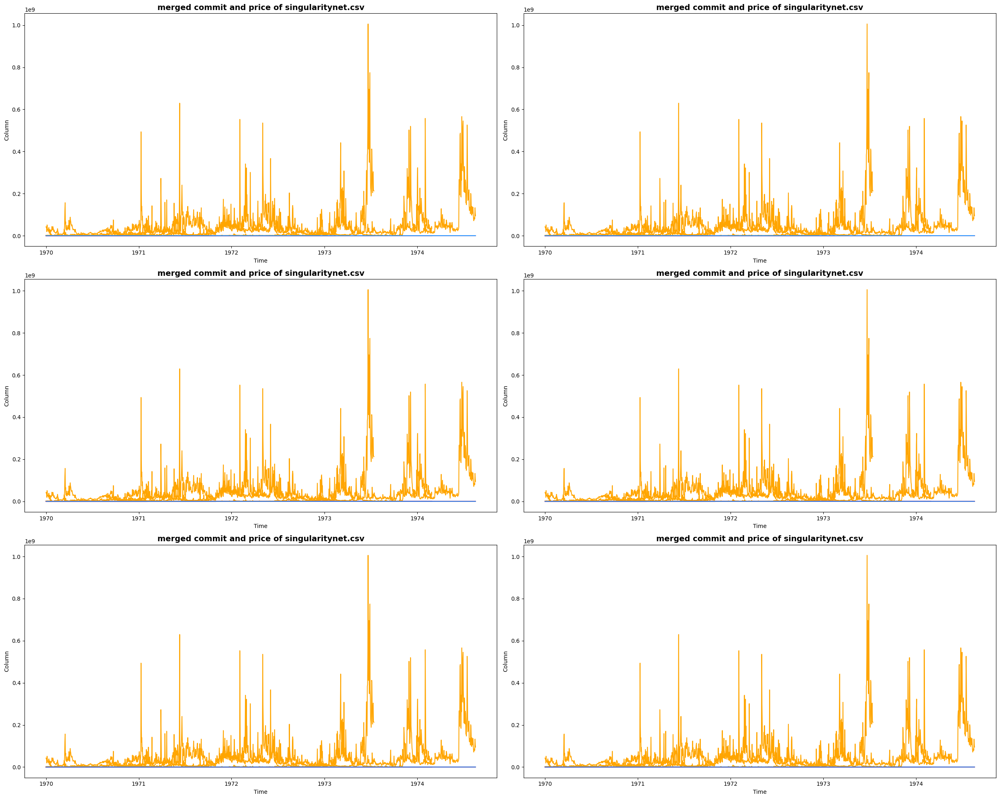

In [ ]:
# pair_list = list(prices_raw_data_dict.keys())
fig, axes = plt.subplots(3, 2, figsize=(25, 20))  # Creating a 5x4 grid of subplots
path = 'commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)

    for (i, ax) in  enumerate(axes.flatten()):
        # df = prices_raw_data_dict[c]
        # ax.plot(df.index,df['Low'],  color='b')
        ax.plot(df.index,df['High'], color=color_list[3])
        ax.plot(df.index,df['Volume'], color=color_list[1])
        ax.plot(df.index,df['node_id'], color=color_list[2])
        ax.plot(df.index,df['commit.comment_count'],label='commit_comment_count', color=color_list[0])
        ax.set_title(f'merged commit and price of {full_name}', fontsize=14, fontweight='bold')
        ax.set_ylabel(r'Column')
        ax.set_xlabel(r'Time')

        # Set the x-axis to show only the year
        ax.xaxis.set_major_locator(mdates.YearLocator())  # Only show one tick per year
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show the year only
        # ax.legend()

    # Adjust layout to prevent overlap
    plt.tight_layout()


## heatmap

In [49]:

def heat_map(df, title ):
  plt.figure(figsize=(6,5))
  corr = df.corr()
  matrix = np.triu(corr)
  sns.heatmap(corr, annot = True, vmin = -1, vmax = 1, mask=matrix)
  # Get the current Axes object
  ax = plt.gca()
  # Set the title for the heatmap plot
  ax.set_title(title)
  plt.show()

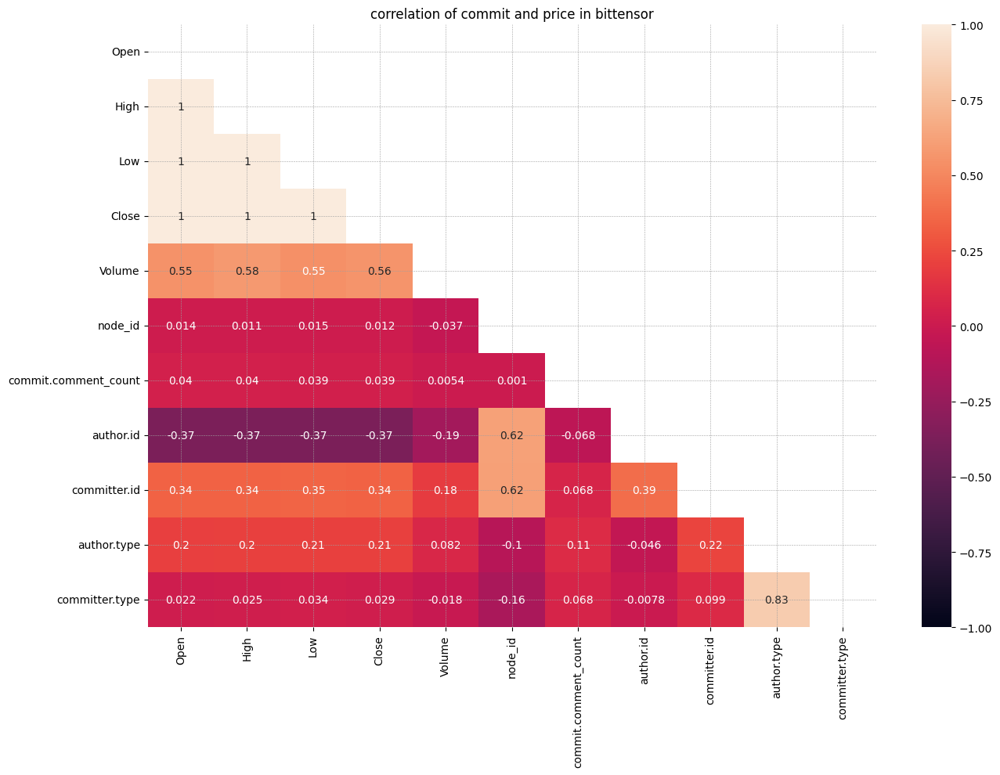

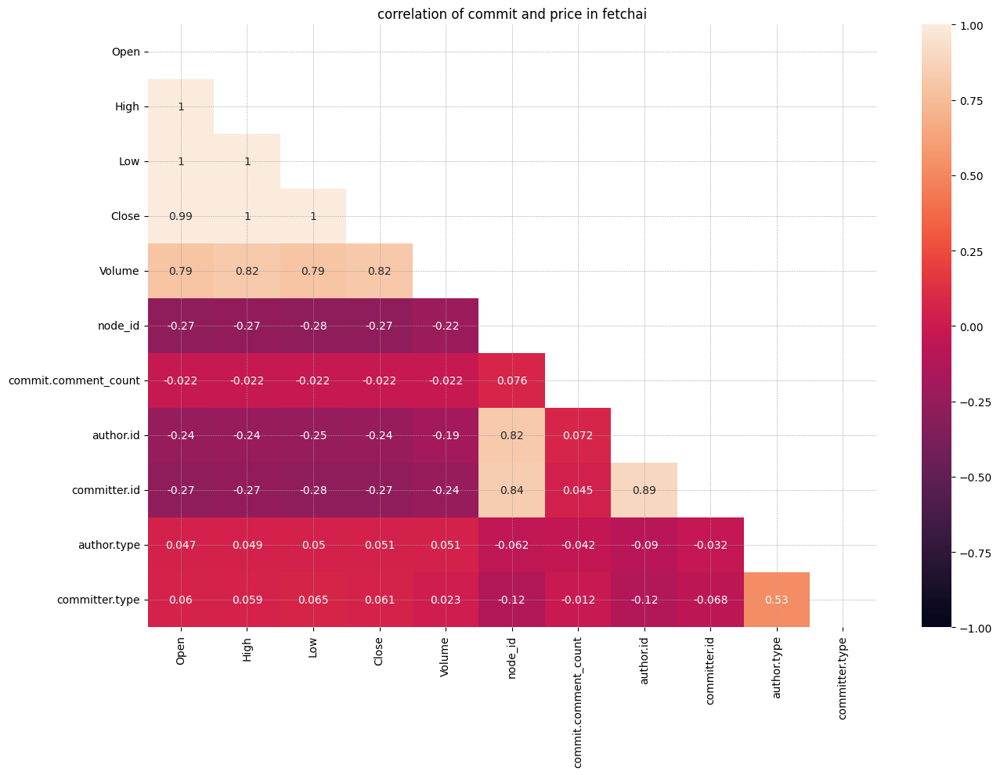

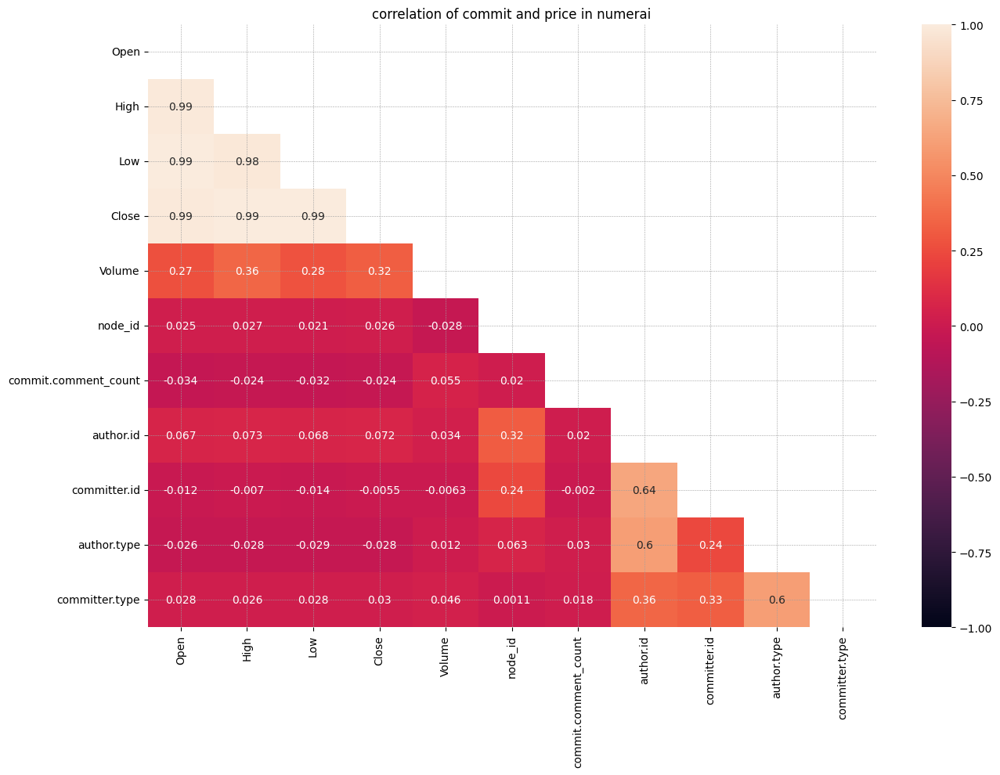

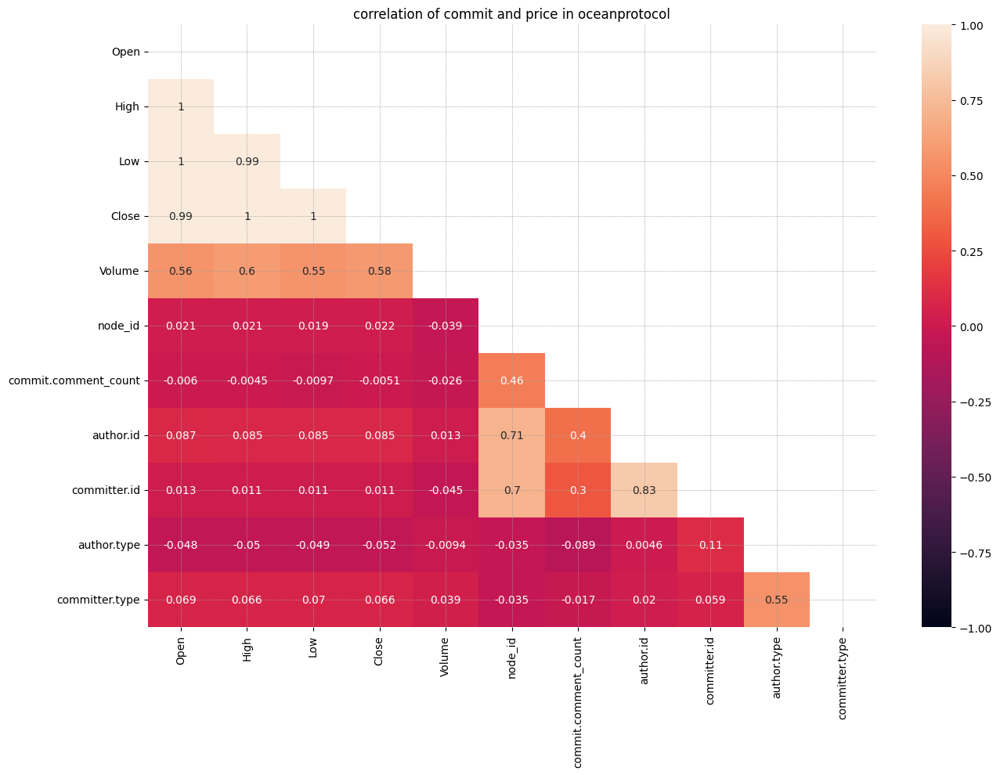

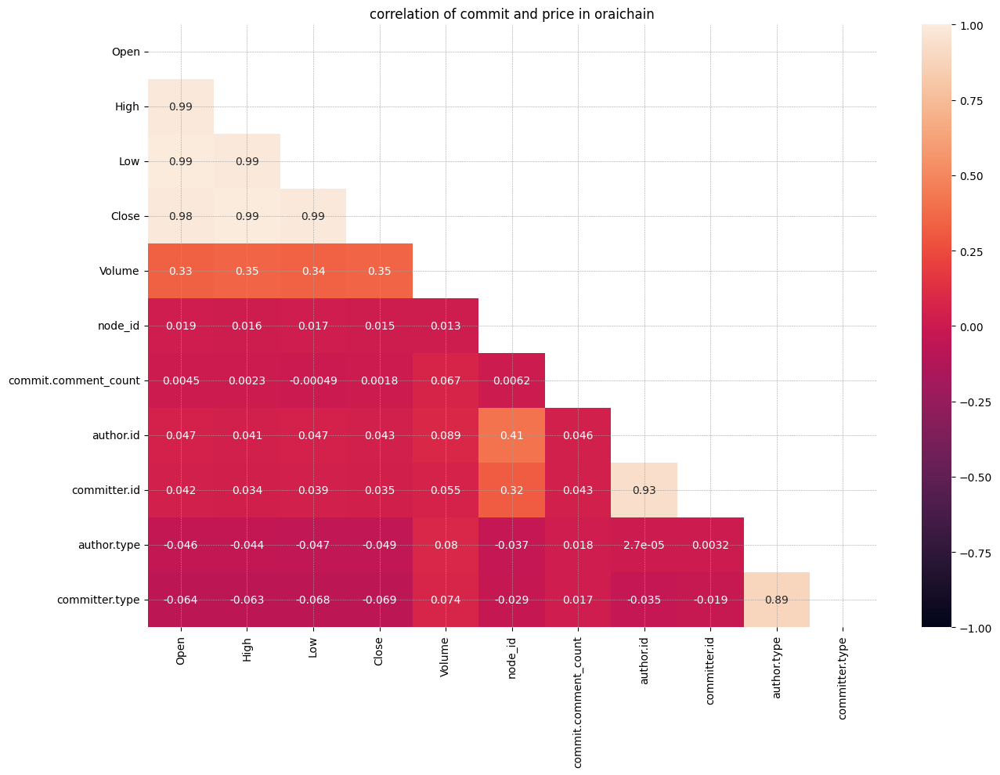

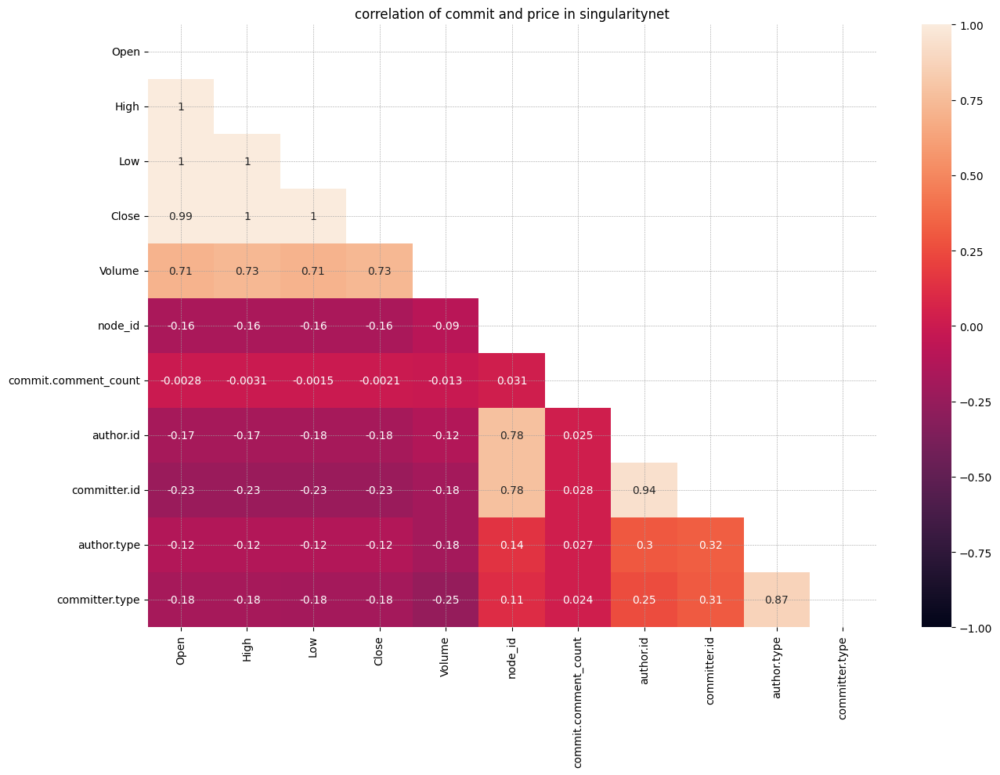

In [ ]:
path = 'remove_equal_columns_commit/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df.drop(columns=['Date'])
    heat_map(df, f'correlation of commit and price in {name}')

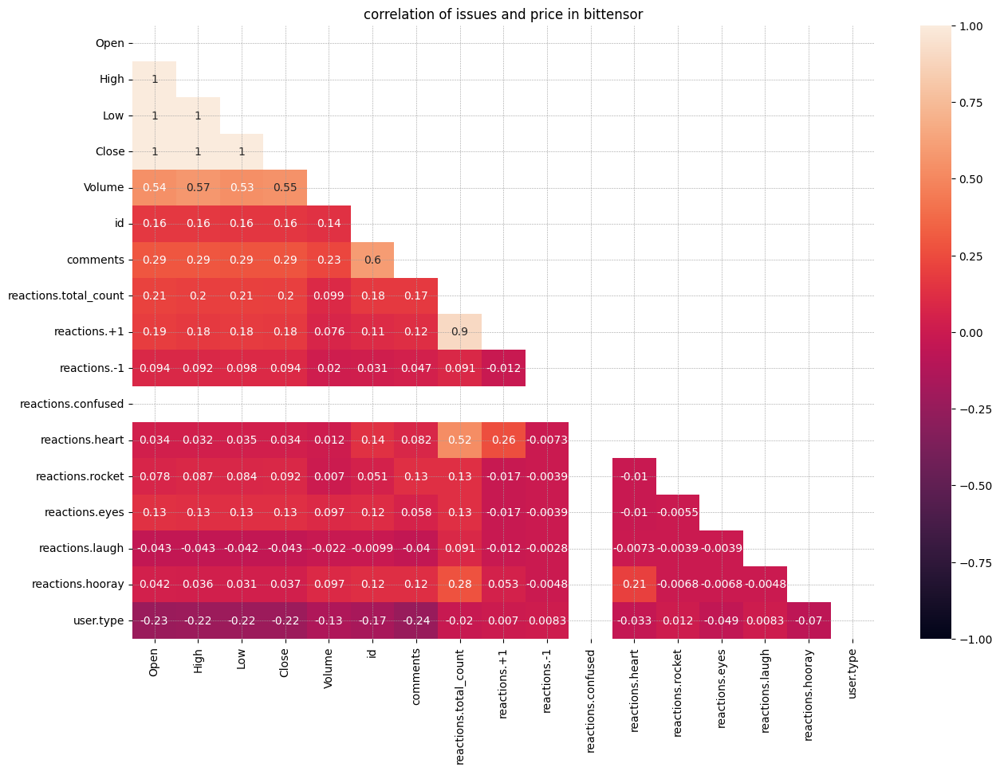

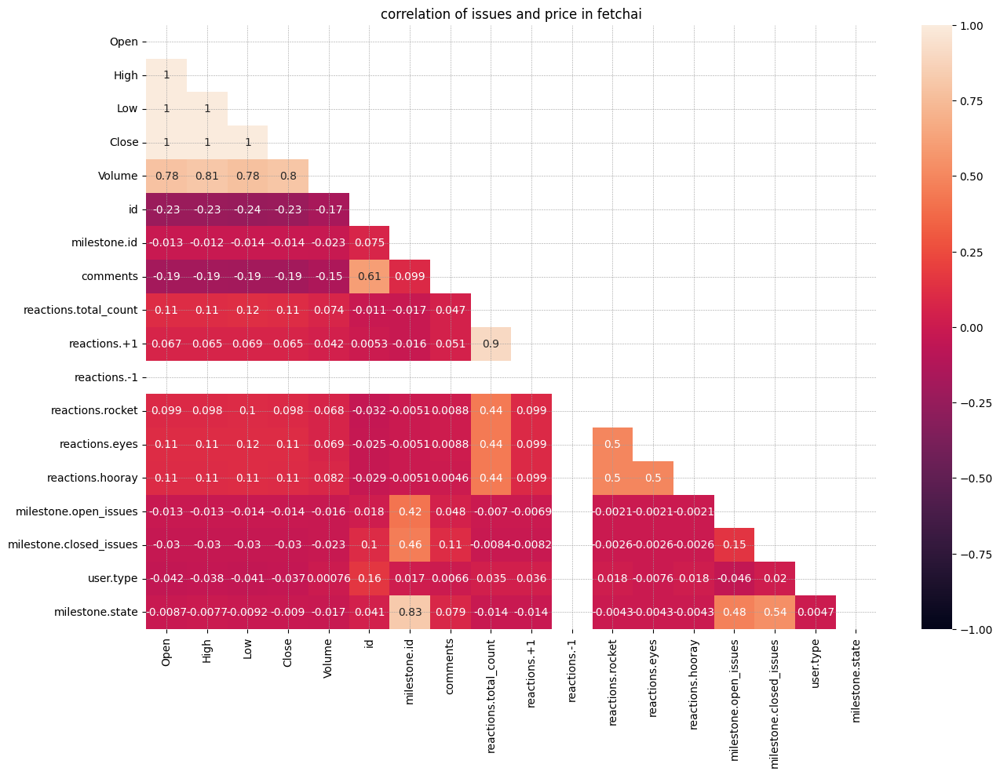

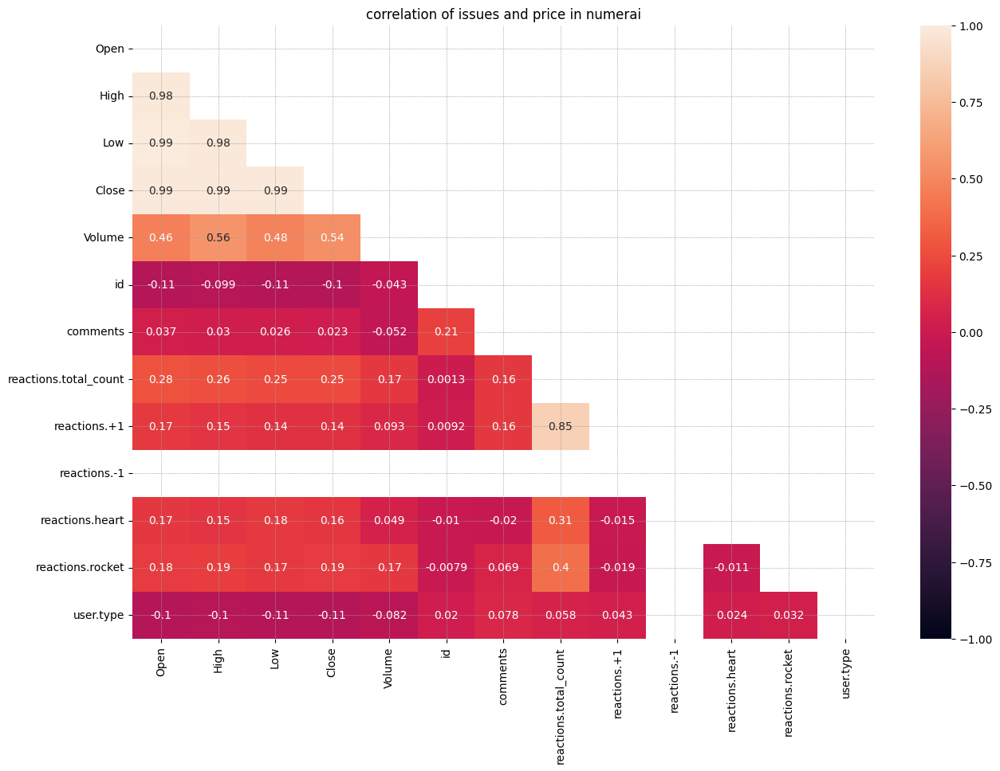

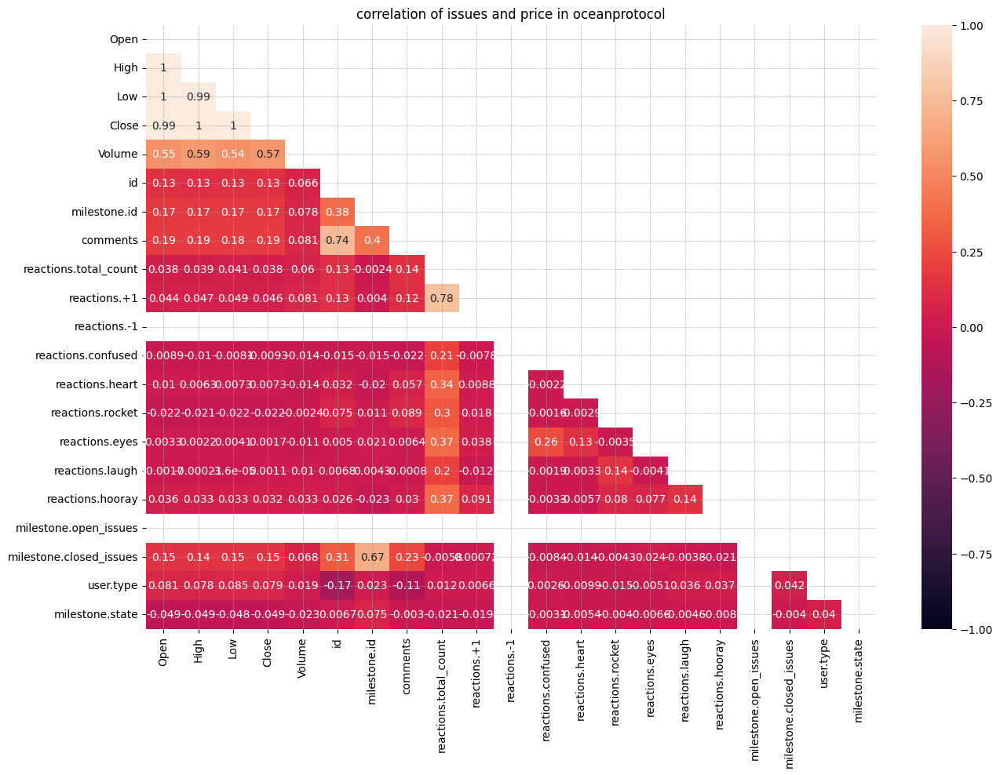

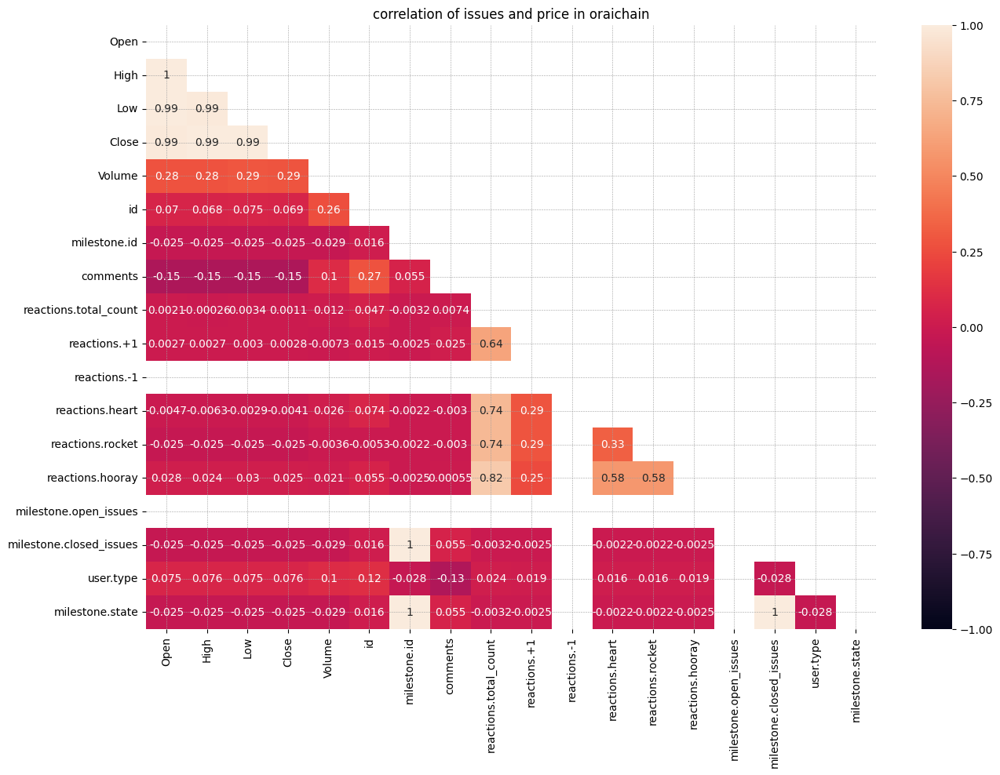

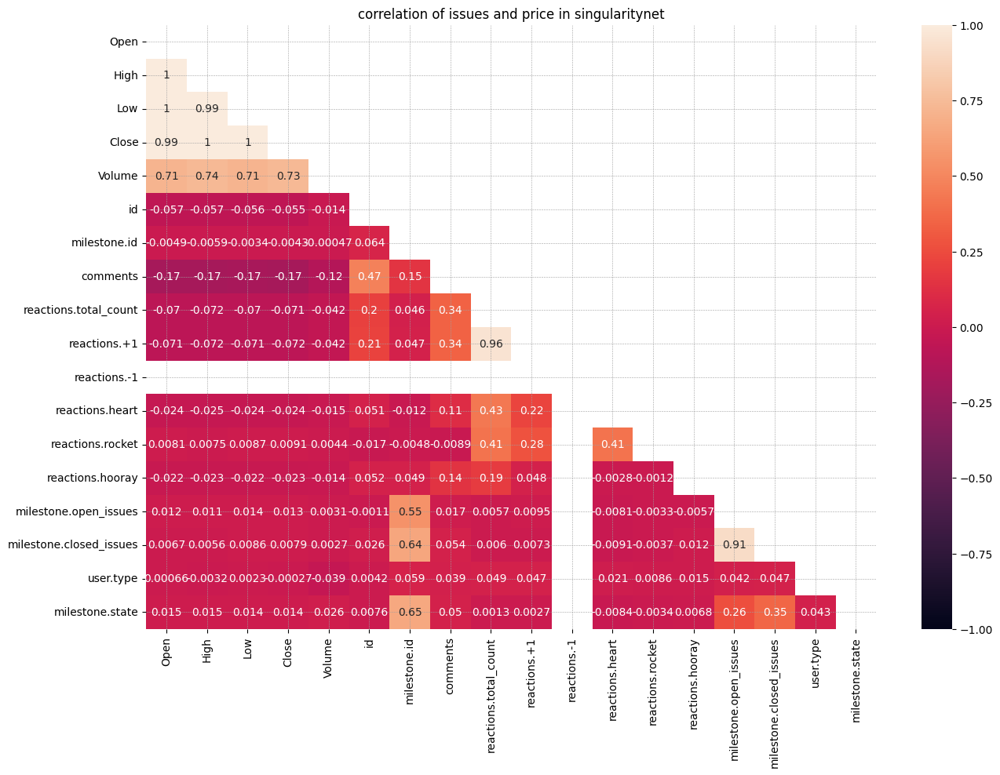

In [ ]:
path = 'remove_equal_columns_issue/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df.drop(columns=['Date'])
    heat_map(df, f'correlation of issues and price in {name}')

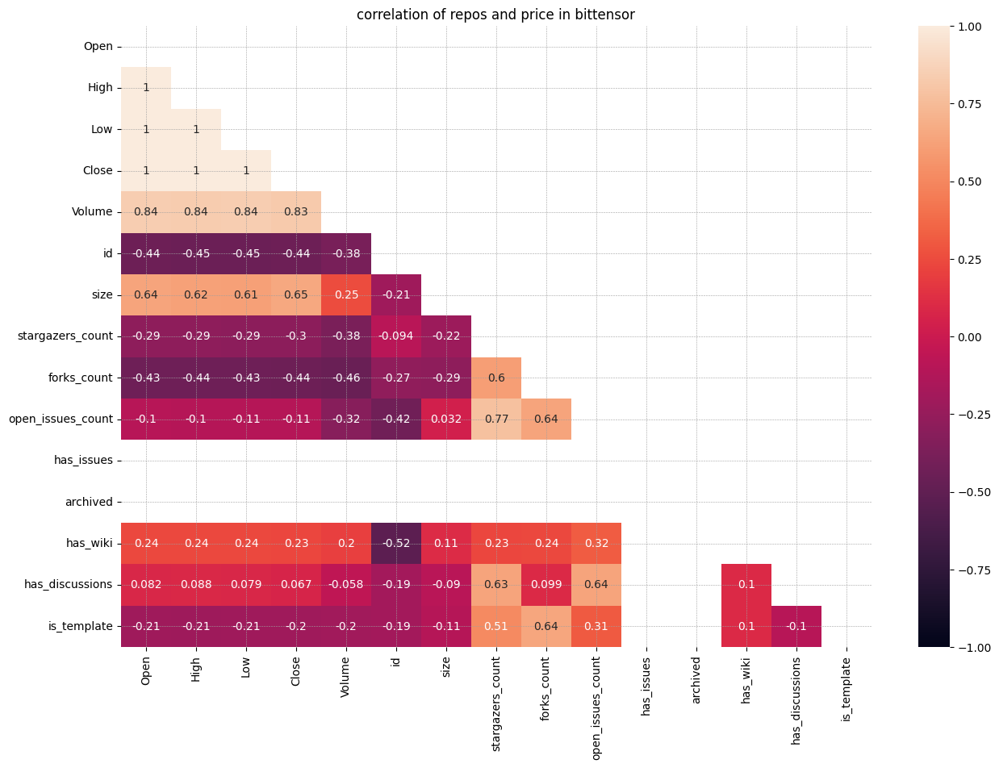

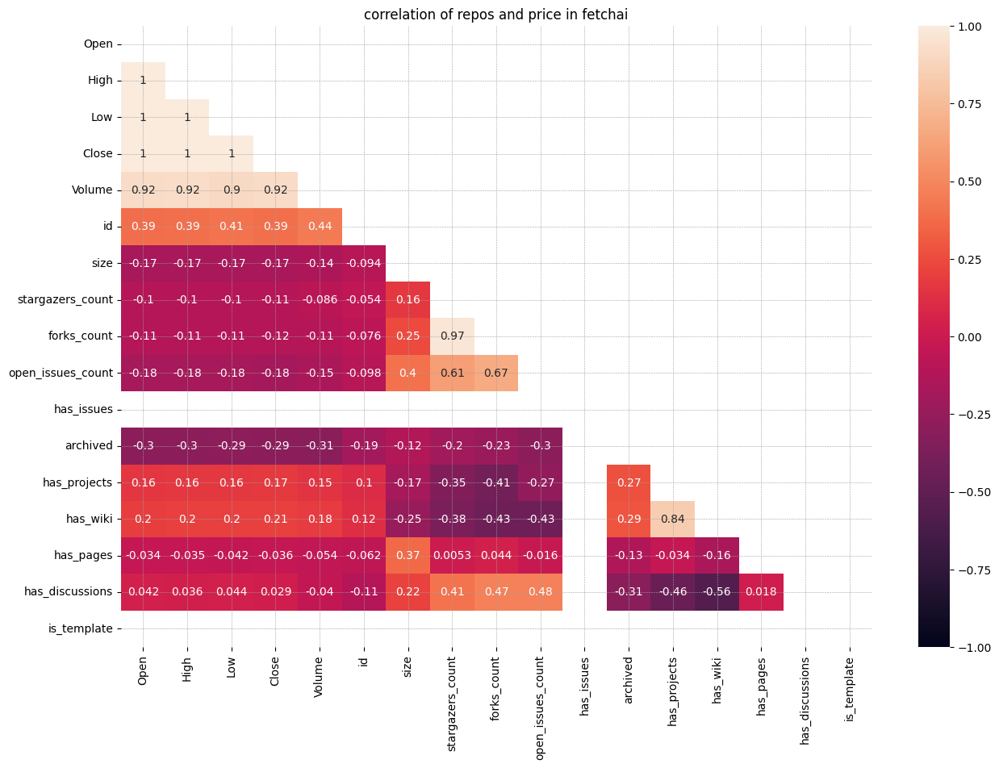

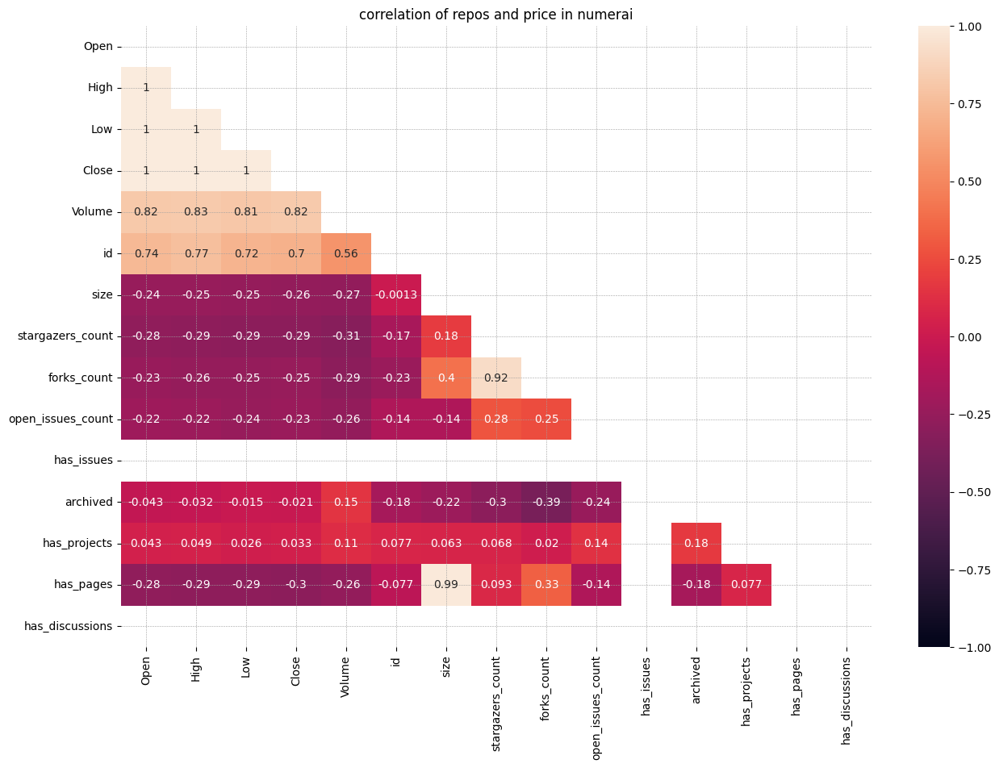

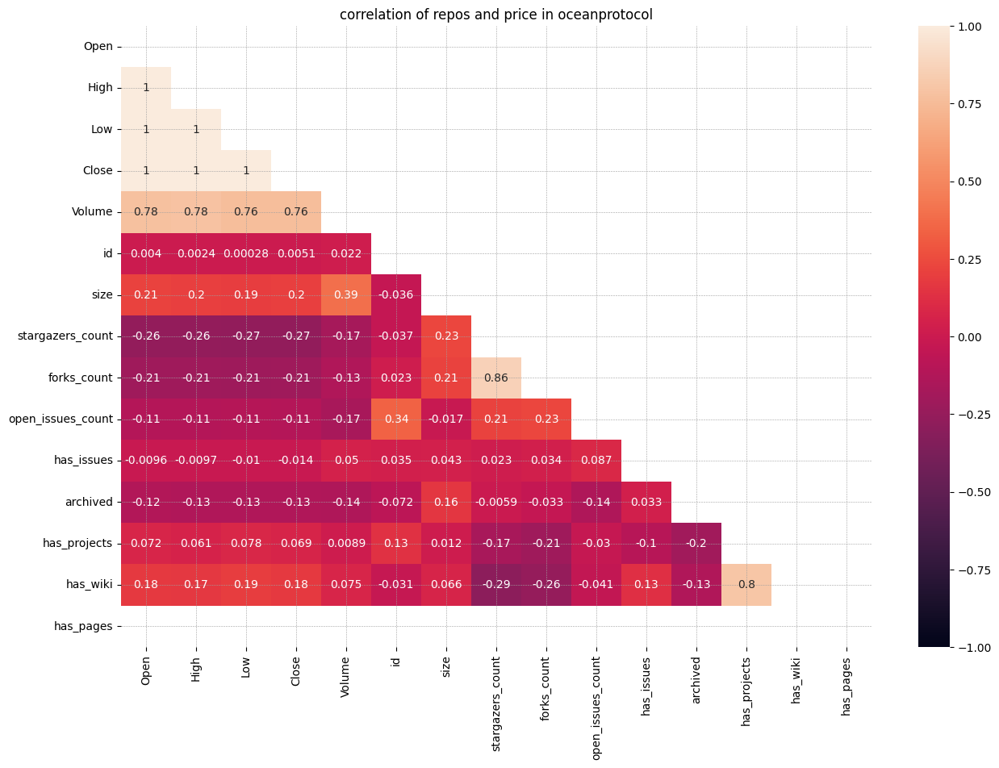

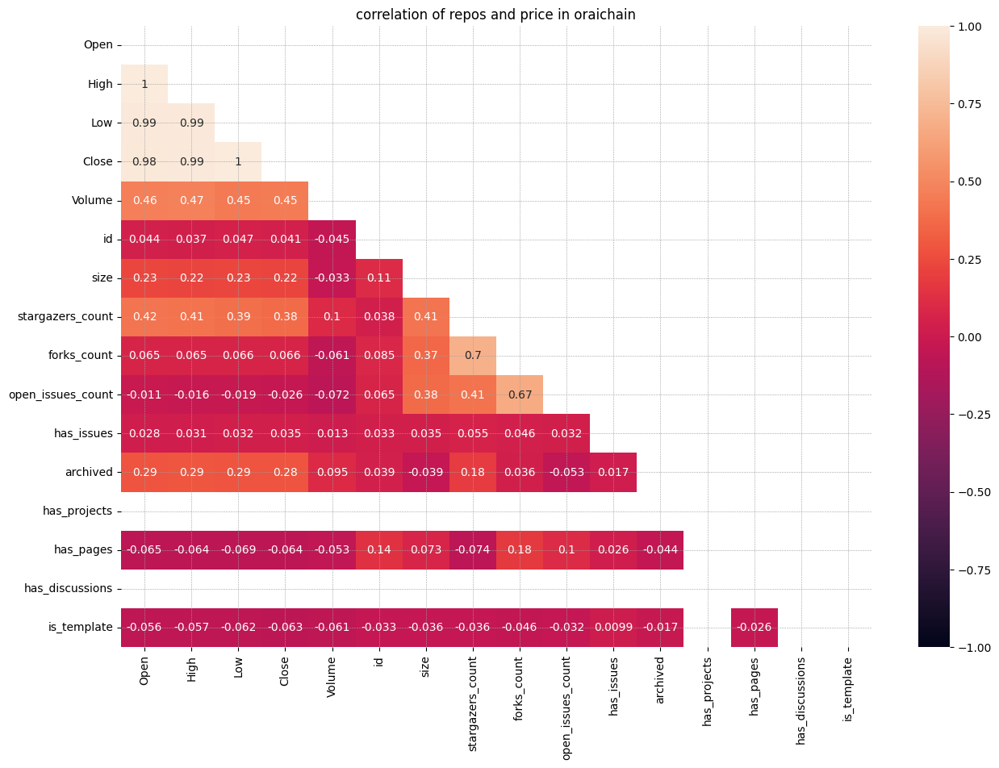

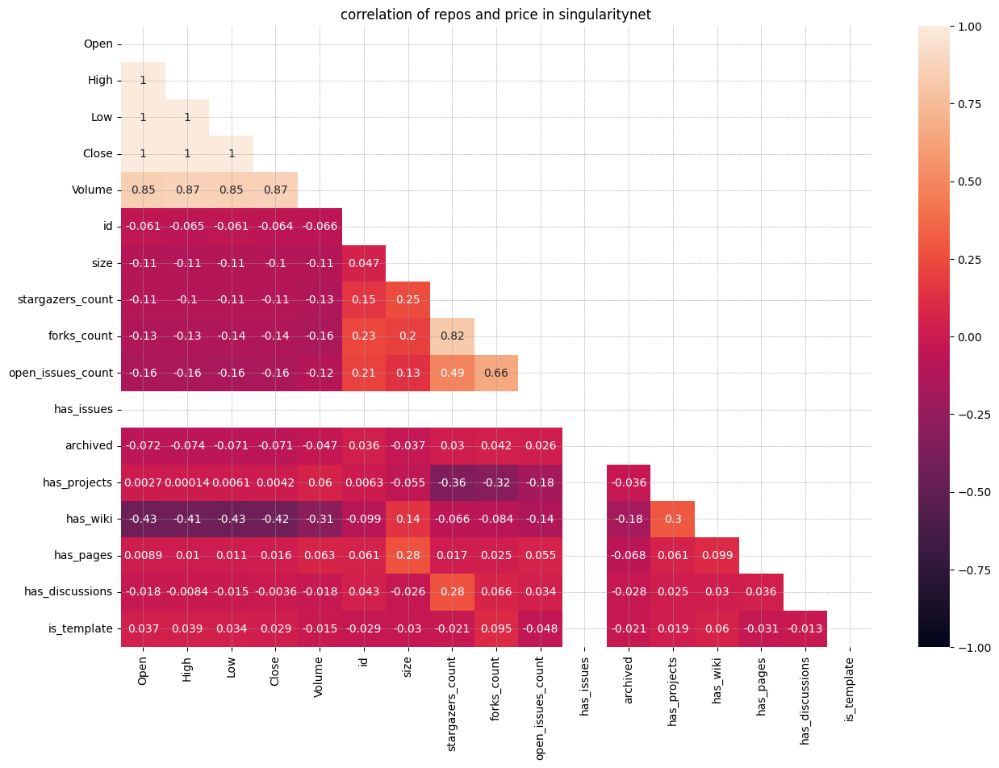

In [ ]:
path = 'remove_equal_columns_repo/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    df = df.drop(columns=['Date'])
    heat_map(df, f'correlation of repos and price in {name}')

## scatter

### commits

In [ ]:
path = 'remove_equal_columns_commit/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    print(df.columns)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'node_id',
       'commit.comment_count', 'author.id', 'committer.id', 'author.type',
       'committer.type'],
      dtype='object')
Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'node_id',
       'commit.comment_count', 'author.id', 'committer.id', 'author.type',
       'committer.type'],
      dtype='object')
Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'node_id',
       'commit.comment_count', 'author.id', 'committer.id', 'author.type',
       'committer.type'],
      dtype='object')
Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'node_id',
       'commit.comment_count', 'author.id', 'committer.id', 'author.type',
       'committer.type'],
      dtype='object')
Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'node_id',
       'commit.comment_count', 'author.id', 'committer.id', 'author.type',
       'committer.type'],
      dtype='object')
Index(['Date', 'Open', 'High', 'Low', 'Close'

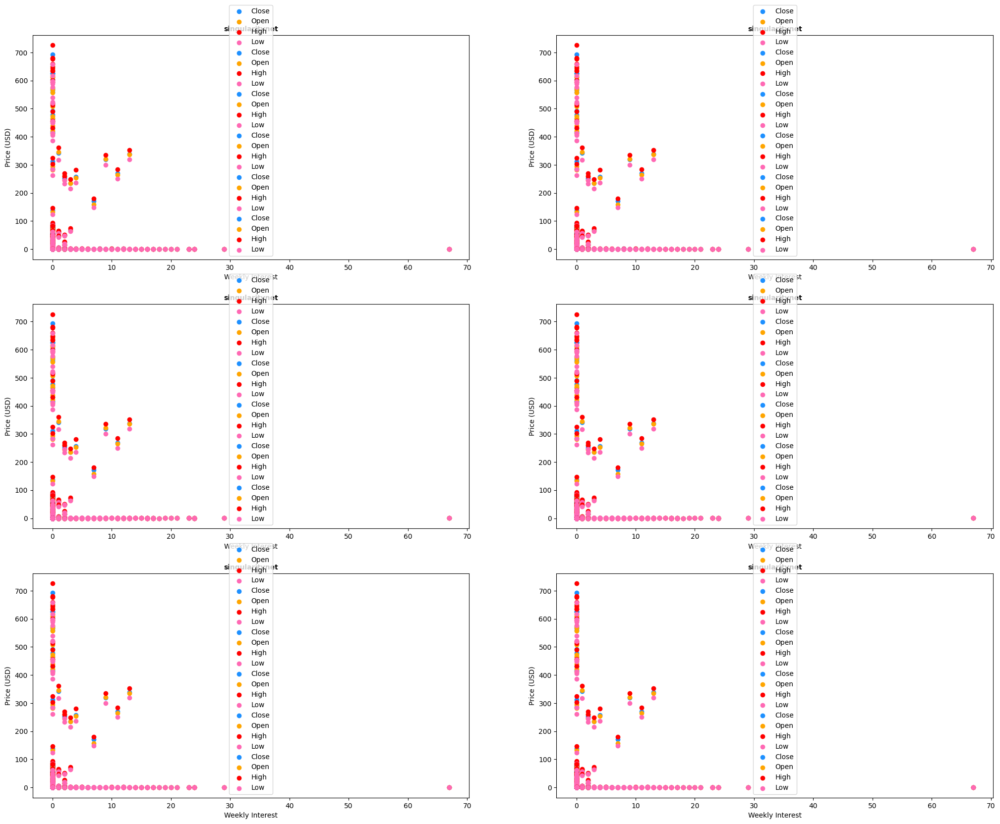

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['commit.comment_count'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['commit.comment_count'], df['Open'], label='Open', c=color_list[1])
        ax.scatter(df['commit.comment_count'], df['High'], label='High', c=color_list[2])
        ax.scatter(df['commit.comment_count'], df['Low'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('Weekly Interest')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


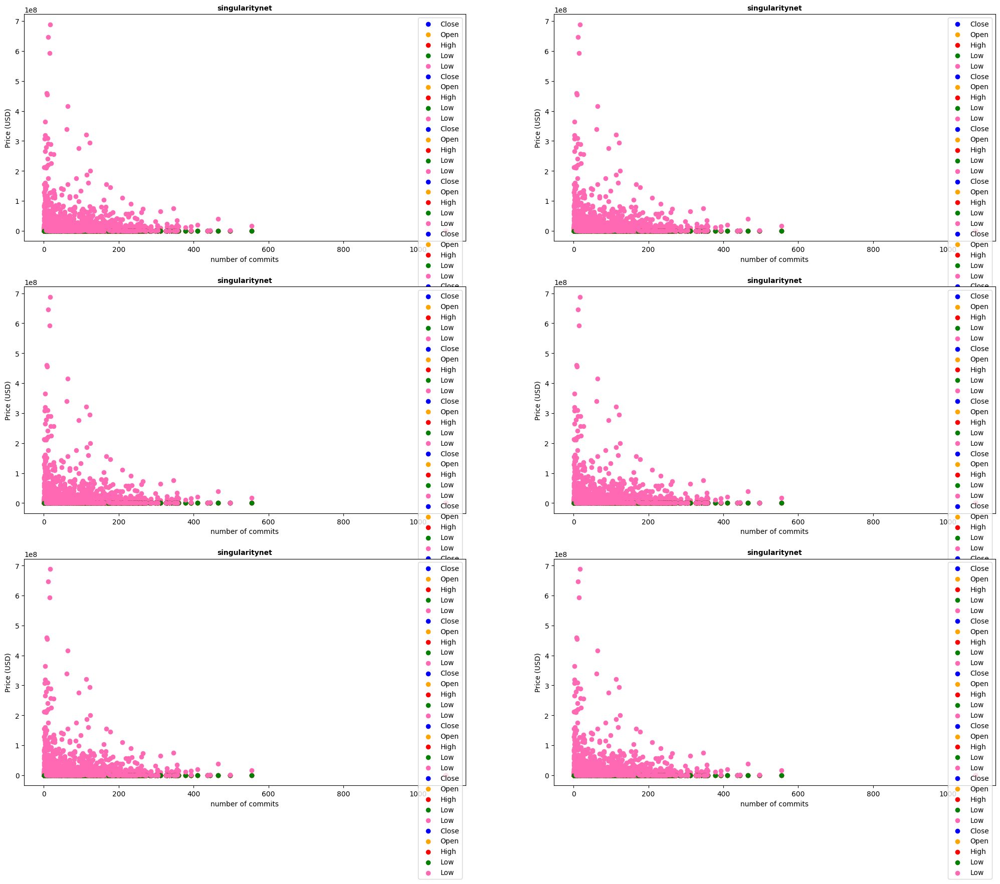

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['node_id'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['node_id'], df['Open'], label='Open', c=color_list[1])
        ax.scatter(df['node_id'], df['High'], label='High', c=color_list[2])
        ax.scatter(df['node_id'], df['Low'], label='Low', c=color_list[3])
        ax.scatter(df['node_id'], df['Volume'], label='Low', c=color_list[4])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of commits')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


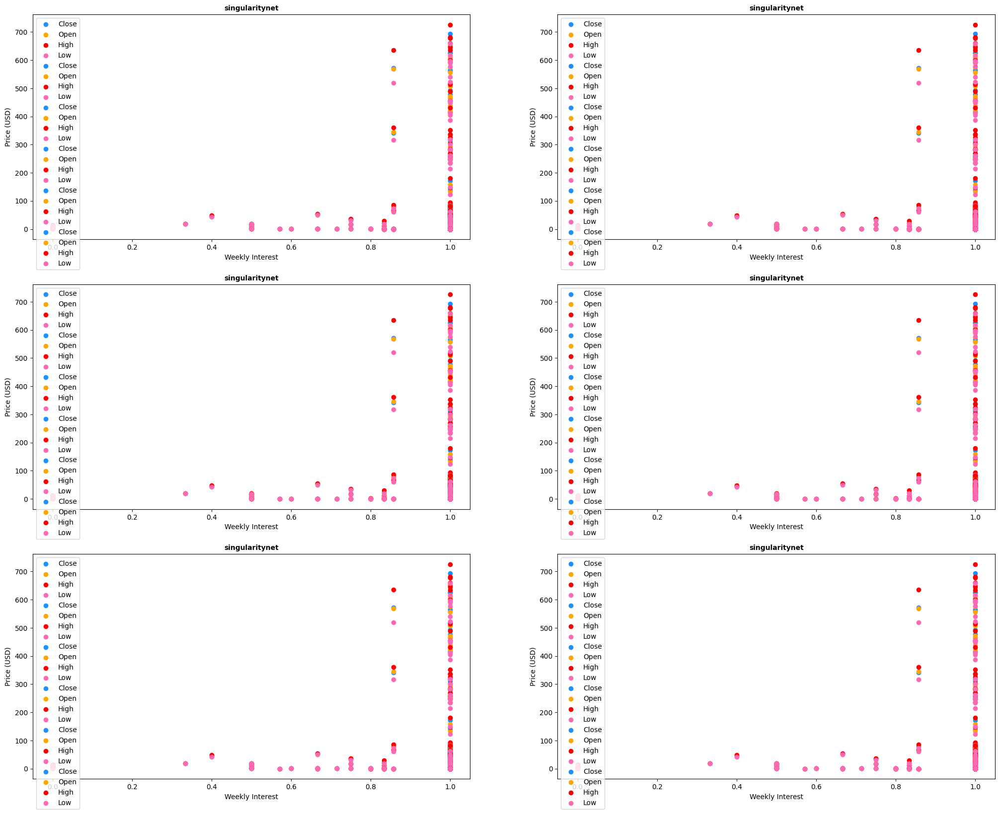

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['committer.type'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['committer.type'], df['Open'], label='Open', c=color_list[1])
        ax.scatter(df['committer.type'], df['High'], label='High', c=color_list[2])
        ax.scatter(df['committer.type'], df['Low'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('Weekly Interest')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


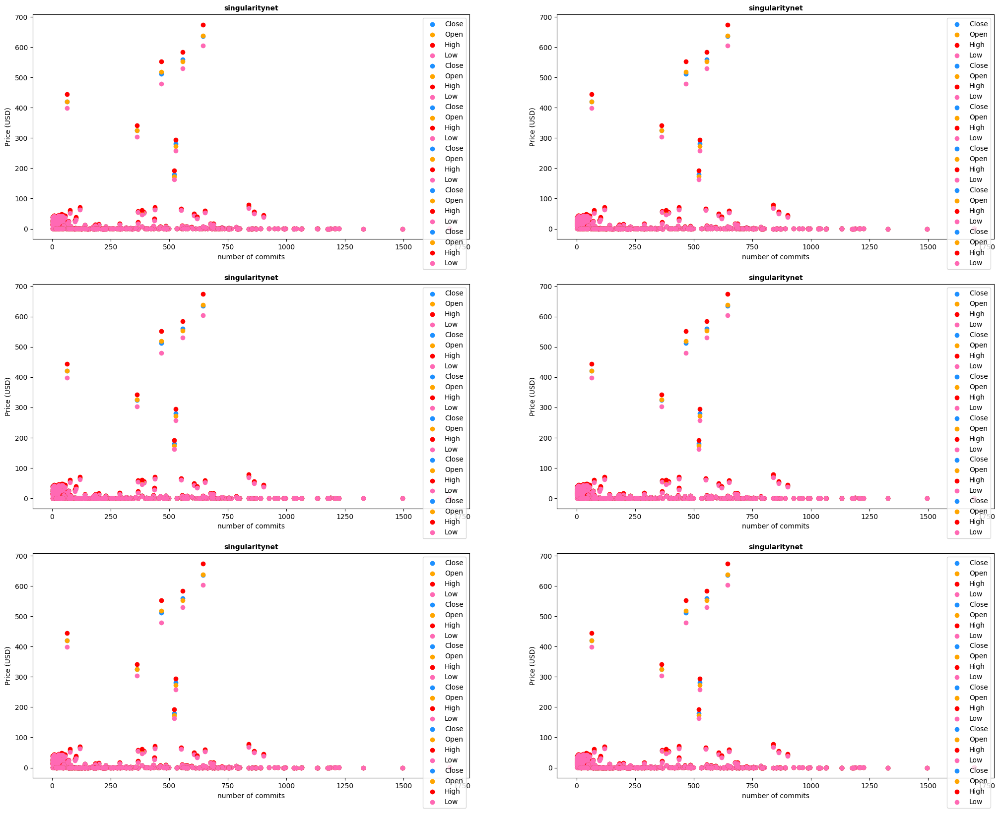

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'monthly_commitprice//'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['node_id'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['node_id'], df['Open'], label='Open', c=color_list[1])
        ax.scatter(df['node_id'], df['High'], label='High', c=color_list[2])
        ax.scatter(df['node_id'], df['Low'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of commits')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


### issues

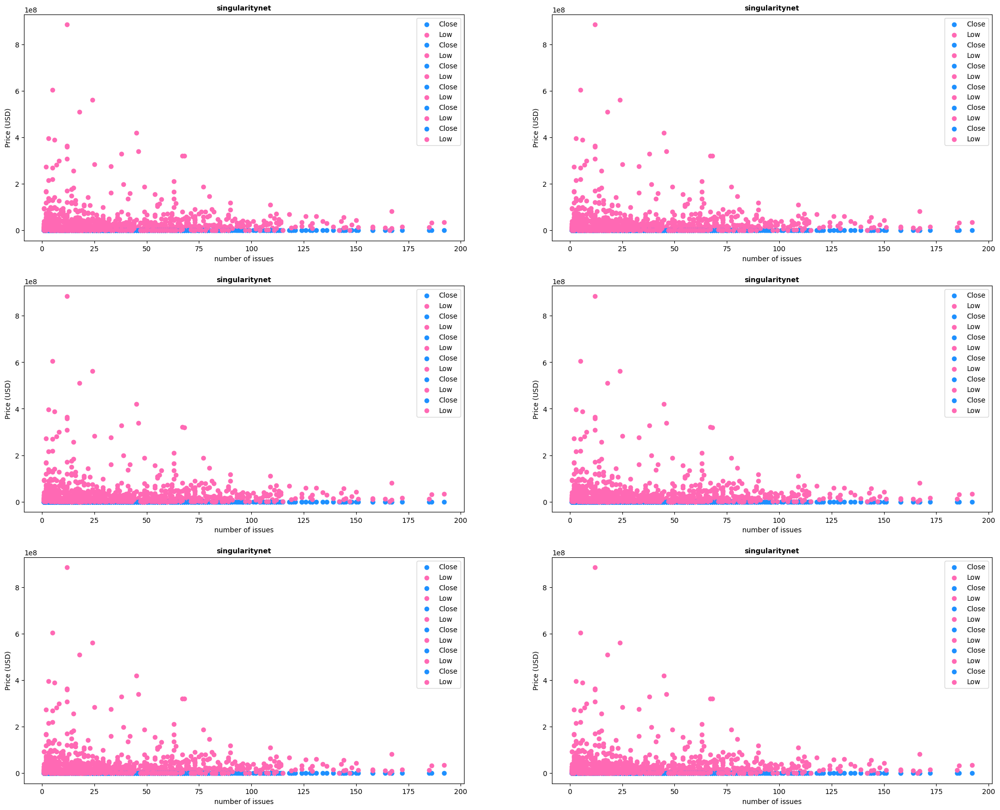

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_issueprice//'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['id'], df['Close'], label='Close', c=color_list[0])

        ax.scatter(df['id'], df['Volume'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of issues')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


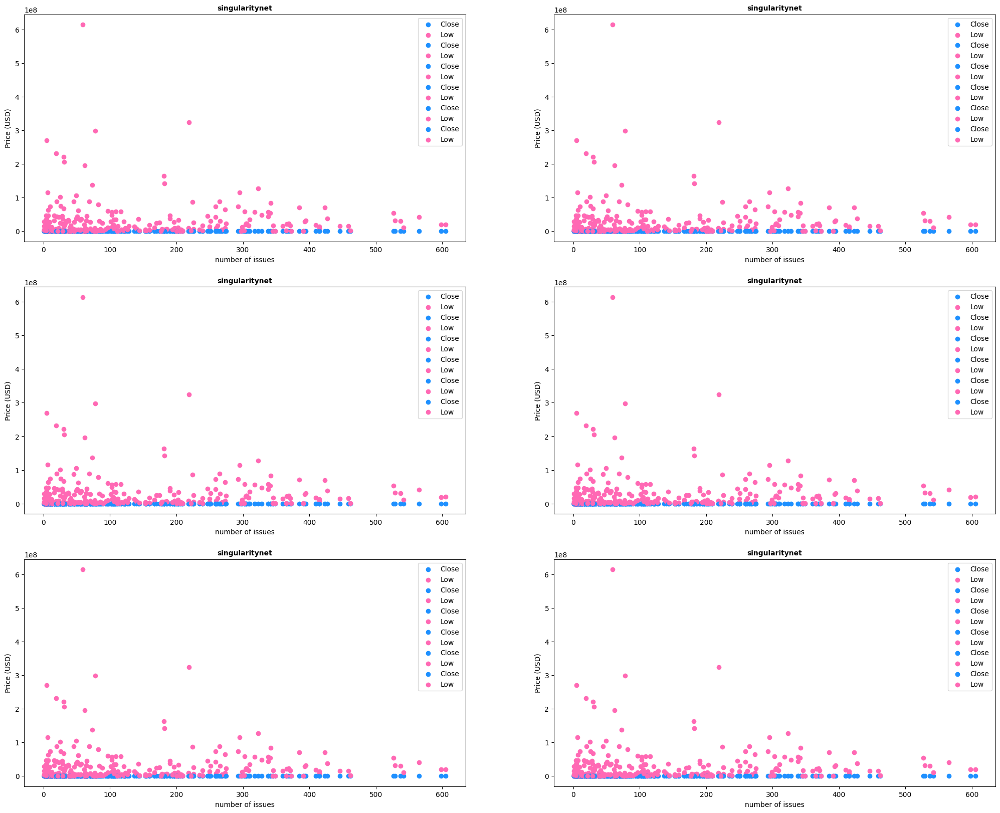

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'monthly_issueprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['id'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['id'], df['Volume'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of issues')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


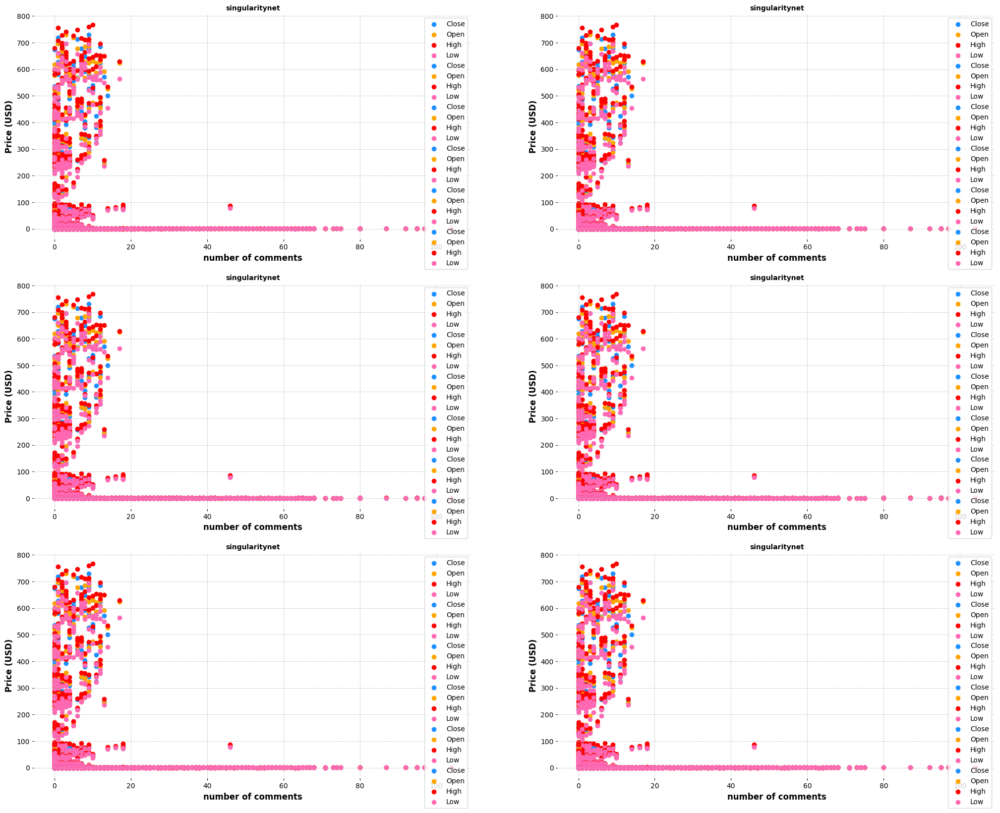

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'issueprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['comments'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['comments'], df['Open'], label='Open', c=color_list[1])
        ax.scatter(df['comments'], df['High'], label='High', c=color_list[2])
        ax.scatter(df['comments'], df['Low'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of comments')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


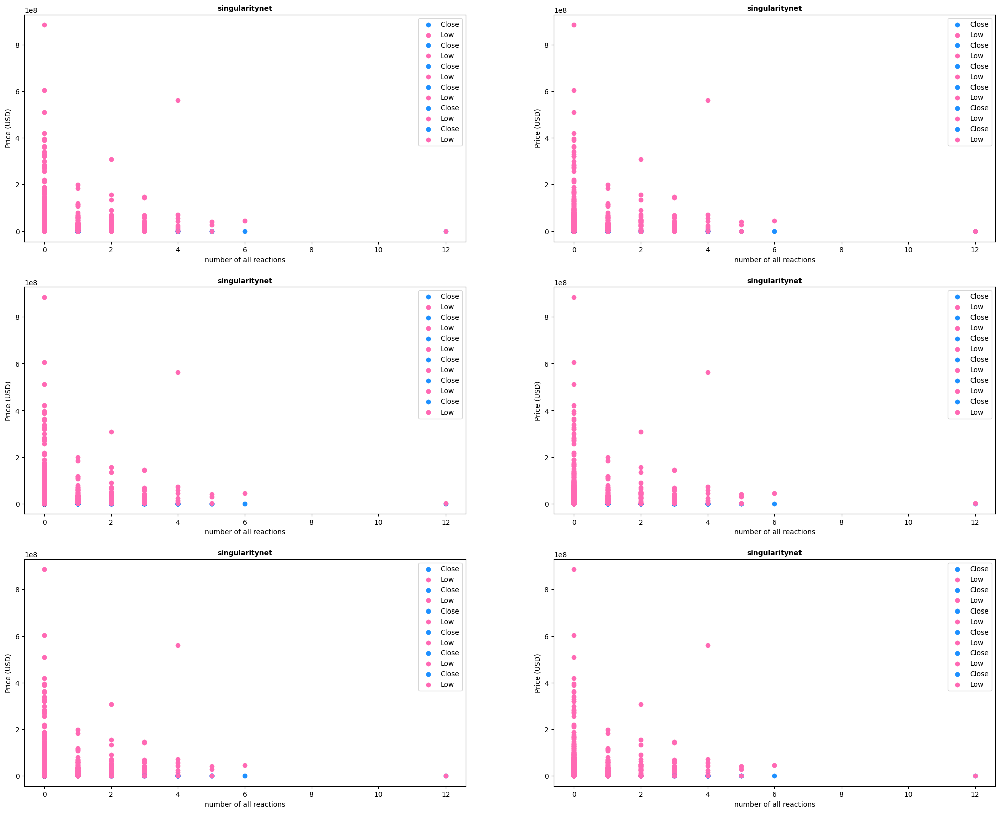

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_issueprice//'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['reactions.total_count'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['reactions.total_count'], df['Volume'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of all reactions')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        ax.legend()


### repos

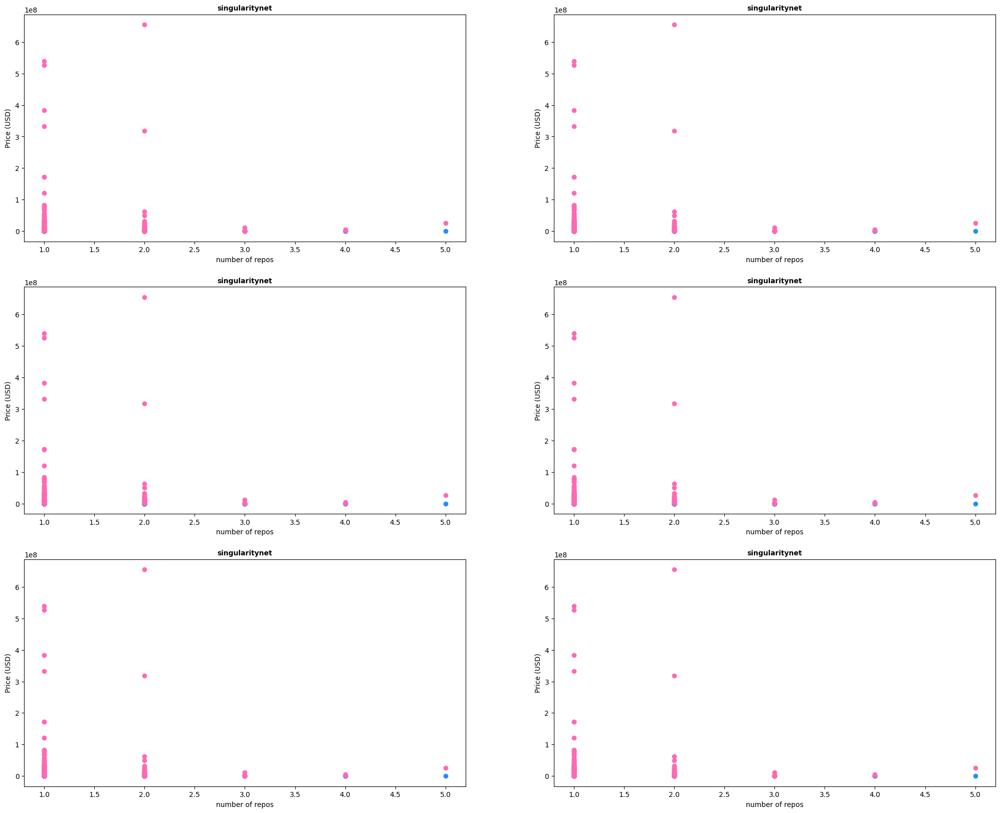

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_repoprice//'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['id'], df['Close'], label='Close', c=color_list[0])

        ax.scatter(df['id'], df['Volume'], label='volume', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('number of repos')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot


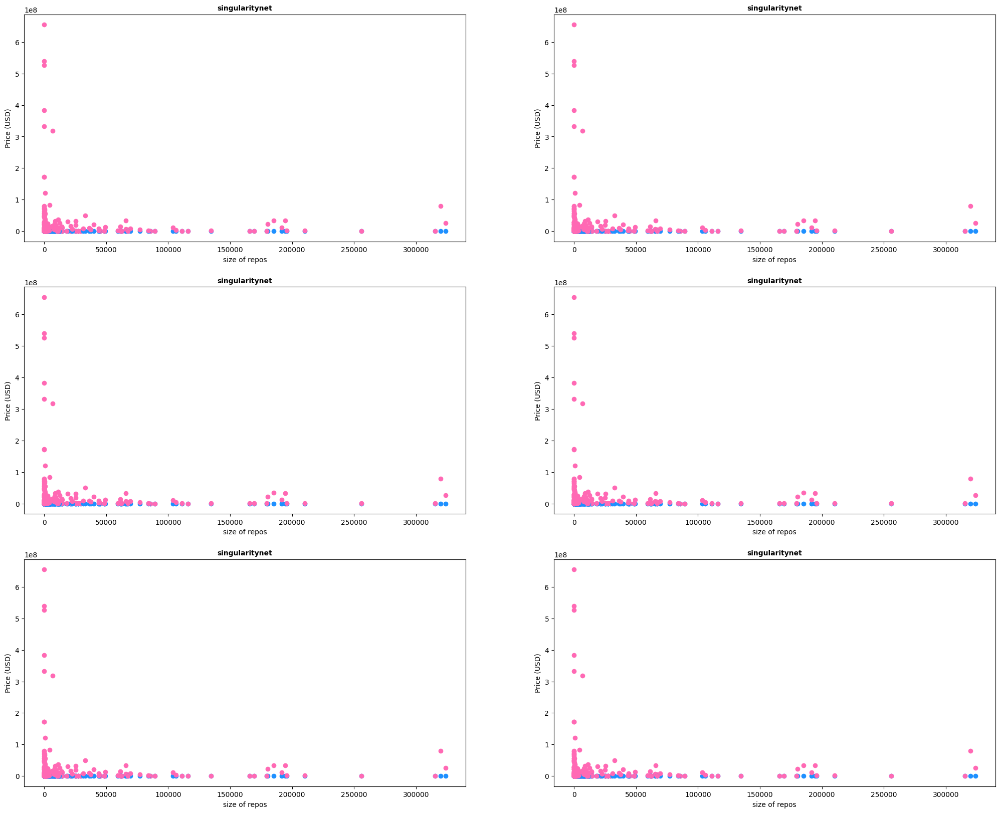

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'weekly_repoprice//'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['size'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['size'], df['Volume'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('size of repos')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        # ax.legend()


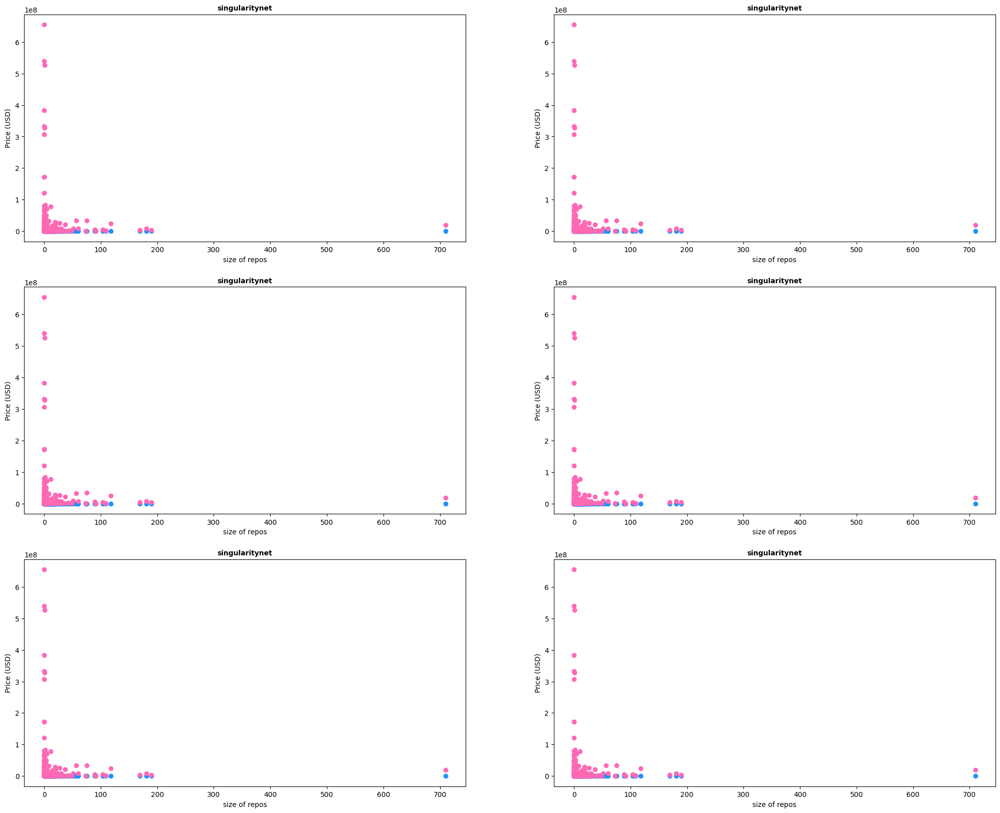

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'repoprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['stargazers_count'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['stargazers_count'], df['Volume'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('size of repos')
        ax.set_ylabel('Price (USD)')



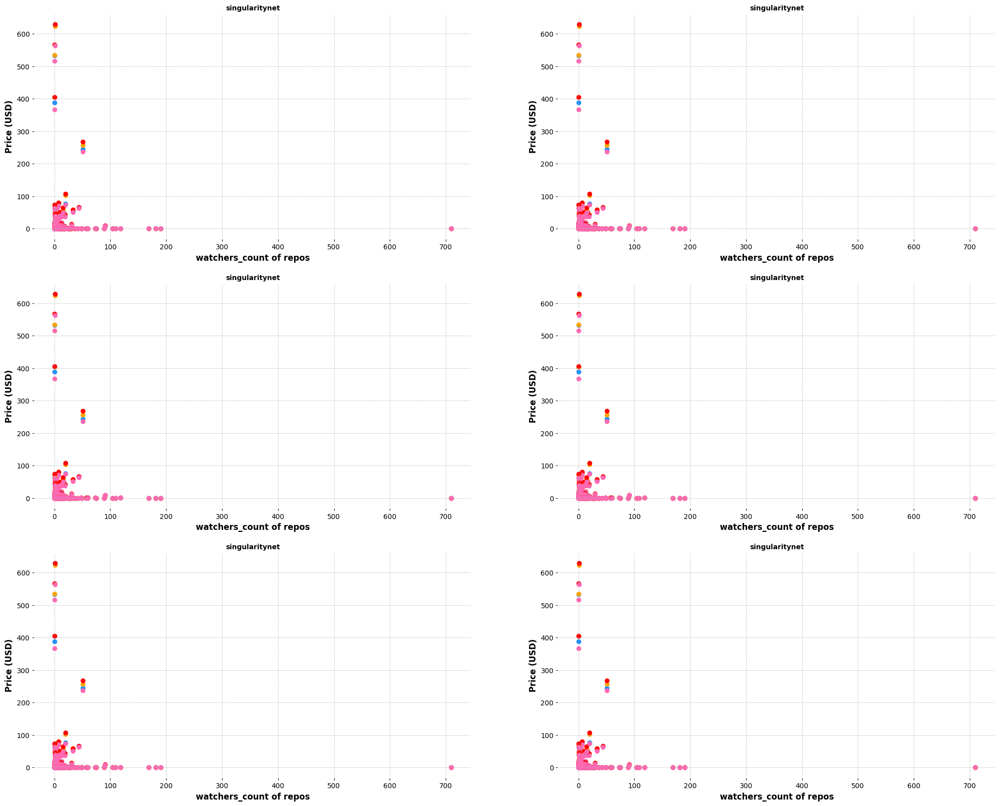

In [ ]:

fig, axes = plt.subplots(3, 2, figsize=(25, 20))
path = 'repoprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    for (i, ax) in  enumerate(axes.flatten()):
        ax.scatter(df['watchers_count'], df['Close'], label='Close', c=color_list[0])
        ax.scatter(df['watchers_count'], df['Open'], label='Open', c=color_list[1])
        ax.scatter(df['watchers_count'], df['High'], label='High', c=color_list[2])
        ax.scatter(df['watchers_count'], df['Low'], label='Low', c=color_list[3])

        # Setting titles, labels etc
        ax.set_title(f'{name}', fontsize=10, fontweight='bold')  # Customize title as needed
        ax.set_xlabel('watchers_count of repos')
        ax.set_ylabel('Price (USD)')

        # Adding a legend to each subplot
        # ax.legend()


## candle chart

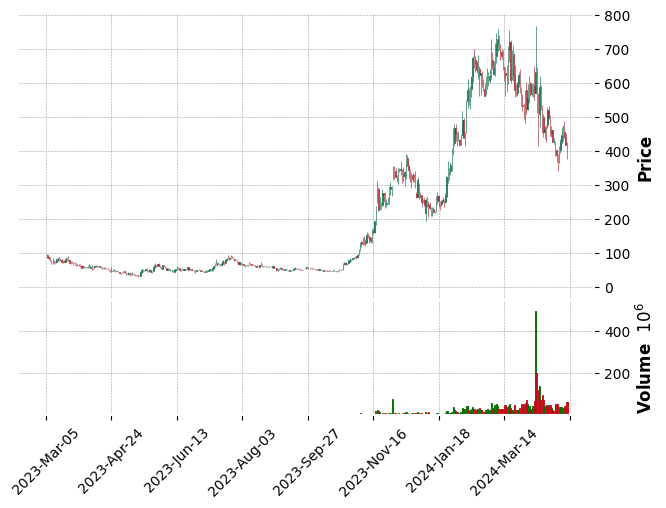

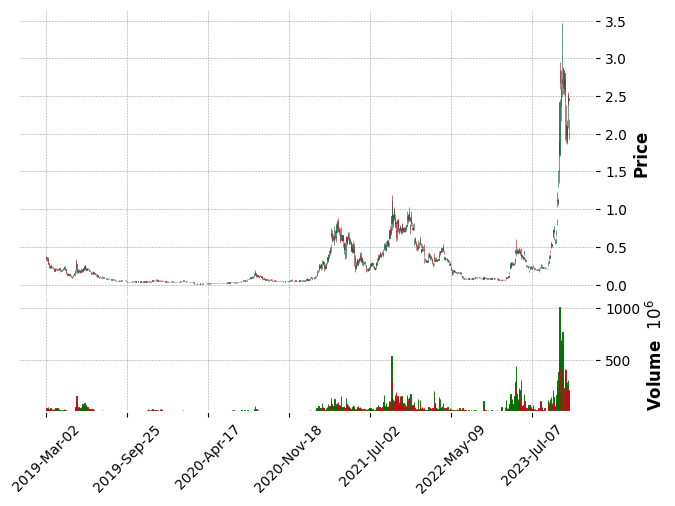

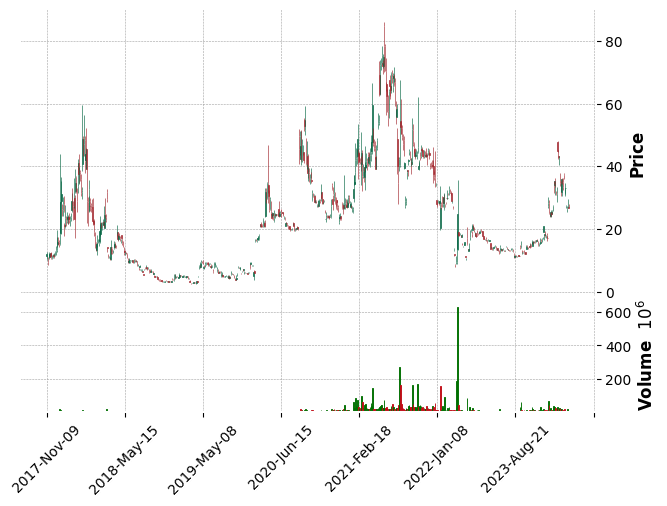

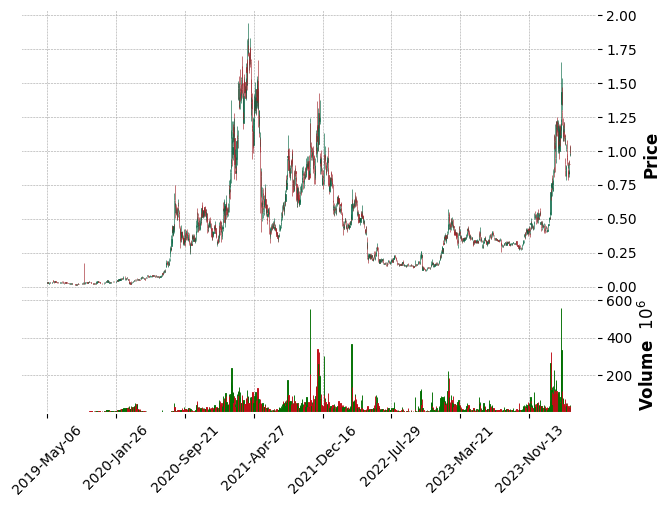

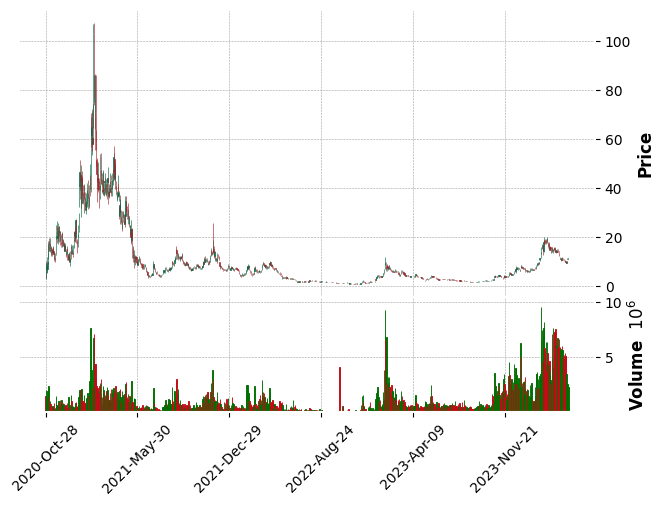

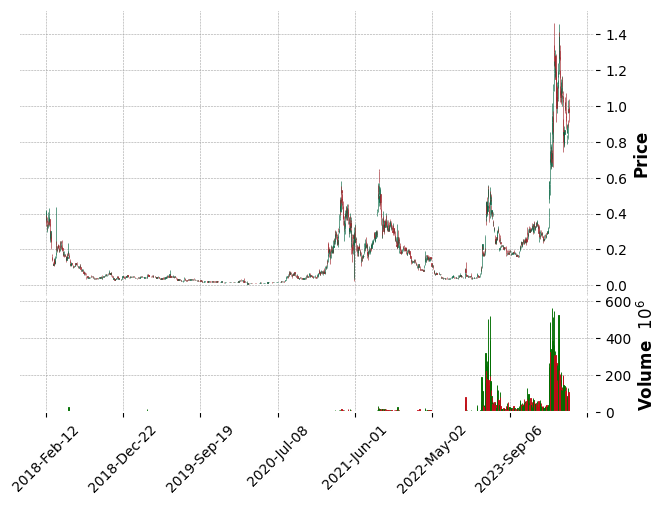

In [ ]:
# Low high price difference over time
path = 'commitprice/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)

    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    ax = mpf.plot(df, type='candle', style='charles', volume=True)


In [ ]:
pair_list = list(prices_raw_data_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 10))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = prices_raw_data_dict[c]
    ax.hist(df['High'], bins=20, color='g')
    ax.hist(df['Low'], bins=20, color='r',alpha=0.5)
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_xlabel(r'Price')
    ax.set_ylabel(r'Count')

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/Data_overview.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()